# TODO Needs Comments


In [96]:
import organoid_prediction_python as opp
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

mapping_df = pd.read_csv("translation_dataframe_timepoints.csv")
mapping_names = {k:v for k,v in mapping_df[["original_names","plot_names"]].to_numpy()}

home_directory = r"C:\Users\savill\OneDrive\Documents\PhD Jesse\Embryonic_organoid_prediction\Processing dataset for Paper\TLS_2D_morphostate_investigation/"
table_location = home_directory + "tabular_data"

normalised_data = pd.read_csv(f"{table_location}/All_Samples_Feature_Space_All_Features_48h,72h,96h_Normalised_per_Timepoint.csv")
normalised_data

,Run,Plate,ID,048h_raw_BF_AreaShape_area,048h_raw_BF_AreaShape_aspect_ratio,048h_raw_BF_AreaShape_axis_major_length,048h_raw_BF_AreaShape_axis_minor_length,048h_raw_BF_AreaShape_eccentricity,048h_raw_BF_AreaShape_feret_diameter_max,048h_raw_BF_AreaShape_perimeter,...,096h_str_BF_AreaShape_moments_hu_1,096h_str_BF_AreaShape_moments_hu_2,096h_str_BF_AreaShape_moments_hu_3,096h_str_BF_AreaShape_moments_hu_4,096h_str_BF_AreaShape_moments_hu_5,096h_str_BF_AreaShape_moments_hu_6,096h_str_BF_AreaShape_orientation,096h_str_BF_AreaShape_perimeter,096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation,096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation
0,RR,1,A1,0.754091,-0.889636,0.132588,1.204628,-1.000051,0.007074,0.615519,...,-0.769984,-0.768314,-0.188818,-0.081040,-0.108285,-0.018937,0.218694,0.485603,-0.237483,0.204173
1,RR,1,A2,-0.783470,-1.252670,-1.238409,0.003129,-1.752936,-1.131530,-0.724230,...,-0.587974,0.518118,-0.142104,-0.080919,-0.108023,0.017986,-1.310831,-0.276812,-0.930821,1.071650
2,RR,1,A3,1.636441,-0.184192,1.186196,1.565451,-0.008740,1.127225,1.795347,...,-0.724302,-0.679043,-0.186519,-0.081045,-0.108504,-0.019001,-0.638784,0.014028,0.406917,-0.068697
3,RR,1,A4,-0.525754,-0.513477,-0.672134,-0.202863,-0.422446,-0.849309,-0.402853,...,0.276192,-0.326314,0.038707,-0.073034,-0.013521,0.038021,0.362758,0.652506,0.992505,-0.551399
4,RR,1,A5,0.537872,-0.248943,0.294790,0.612413,-0.084969,0.059492,0.498737,...,0.544892,-0.696050,-0.161387,-0.081127,-0.113141,-0.013480,-0.324894,-1.090064,0.285818,-0.643907
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
762,TR,2,H8,-0.342295,-0.103644,-0.319022,-0.266071,0.083062,-0.511010,-0.233997,...,-0.240030,1.252083,-0.031233,-0.076766,-0.095753,0.232280,-0.531978,0.936472,-1.056426,0.770934
763,TR,2,H9,-0.925432,1.281638,-0.116354,-1.536867,1.304509,-0.330223,-1.009869,...,-0.010842,0.858318,-0.018204,-0.084586,-0.137911,0.247706,0.371618,1.965908,0.143556,0.712064
764,TR,2,H10,-1.873304,-1.279234,-2.131125,-1.049808,-1.821515,-2.016265,-1.929328,...,-0.454779,1.044578,-0.117763,-0.082320,-0.115499,0.052699,0.177291,1.923294,-1.128242,-0.816051
765,TR,2,H11,-2.408392,-0.915375,-2.411391,-1.803167,-1.045366,-2.414625,-2.306480,...,1.523053,0.369209,0.161155,-0.101456,-0.309307,0.338411,-0.341009,1.652660,-0.982778,1.840169


In [97]:
normalised_data.keys().to_numpy()

array(['Run', 'Plate', 'ID', '048h_raw_BF_AreaShape_area',
       '048h_raw_BF_AreaShape_aspect_ratio',
       '048h_raw_BF_AreaShape_axis_major_length',
       '048h_raw_BF_AreaShape_axis_minor_length',
       '048h_raw_BF_AreaShape_eccentricity',
       '048h_raw_BF_AreaShape_feret_diameter_max',
       '048h_raw_BF_AreaShape_perimeter',
       '048h_raw_BF_AreaShape_solidity', '048h_str_BF_AreaShape_area',
       '048h_str_BF_AreaShape_aspect_ratio',
       '048h_str_BF_AreaShape_eccentricity',
       '048h_str_BF_AreaShape_equivalent_diameter',
       '048h_str_BF_AreaShape_extent',
       '048h_str_BF_AreaShape_form_factor',
       '048h_str_BF_AreaShape_inertia_tensor_0_0',
       '048h_str_BF_AreaShape_inertia_tensor_0_1',
       '048h_str_BF_AreaShape_inertia_tensor_1_0',
       '048h_str_BF_AreaShape_inertia_tensor_1_1',
       '048h_str_BF_AreaShape_inertia_tensor_eigvals_0',
       '048h_str_BF_AreaShape_inertia_tensor_eigvals_1',
       '048h_str_BF_AreaShape_locoefa_PC_1',

In [98]:
raw_data = pd.read_csv(f"{table_location}/All_Samples_Feature_Space_All_Features_48h,72h,96h.csv")
raw_data

,Unnamed: 0,Run,Plate,ID,048h_raw_BF_AreaShape_area,048h_raw_BF_AreaShape_aspect_ratio,048h_raw_BF_AreaShape_axis_major_length,048h_raw_BF_AreaShape_axis_minor_length,048h_raw_BF_AreaShape_eccentricity,048h_raw_BF_AreaShape_feret_diameter_max,...,096h_str_BF_AreaShape_moments_hu_1,096h_str_BF_AreaShape_moments_hu_2,096h_str_BF_AreaShape_moments_hu_3,096h_str_BF_AreaShape_moments_hu_4,096h_str_BF_AreaShape_moments_hu_5,096h_str_BF_AreaShape_moments_hu_6,096h_str_BF_AreaShape_orientation,096h_str_BF_AreaShape_perimeter,096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation,096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation
0,0,RR,1,A1,51429.057934,1.036110,260.694837,251.609209,0.261703,266.724612,...,0.000012,0.000019,4.824832e-09,-1.412213e-15,-1.643041e-11,-3.074749e-16,0.052614,1338.362215,0.027743,0.018767
1,1,RR,1,A2,46107.767989,1.018480,244.753205,240.312256,0.189631,252.890770,...,0.000523,0.000235,1.227808e-06,2.059185e-12,8.695410e-10,2.075727e-11,-0.311135,1265.903481,0.013417,0.031259
2,2,RR,1,A3,54482.752732,1.070369,272.945953,255.001802,0.356599,280.334245,...,0.000140,0.000034,6.502767e-08,-8.891570e-14,-7.558533e-10,-3.658872e-14,-0.151310,1293.544459,0.041057,0.014838
3,3,RR,1,A4,46999.688747,1.054378,251.337713,238.375438,0.316996,256.319703,...,0.002951,0.000093,5.961453e-06,1.366487e-10,3.202327e-07,3.202046e-11,0.086875,1354.224446,0.053157,0.007887
4,4,RR,1,A5,50680.751535,1.067224,262.580886,246.040977,0.349302,267.361474,...,0.003706,0.000031,7.229710e-07,-1.487676e-12,-1.642923e-08,3.067576e-12,-0.076661,1188.613239,0.038555,0.006555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
762,762,TR,2,H8,47634.615388,1.074280,255.443622,237.781139,0.365387,260.429973,...,0.001501,0.000359,4.130417e-06,7.295109e-11,4.233366e-08,1.412304e-10,-0.125910,1381.212217,0.010821,0.026928
763,763,TR,2,H9,45616.455707,1.141554,257.800200,225.832628,0.482314,262.626514,...,0.002145,0.000292,4.471516e-06,-6.053277e-11,-1.001351e-07,1.499027e-10,0.088982,1479.048220,0.035616,0.026081
764,764,TR,2,H10,42336.001394,1.017190,234.372899,230.412135,0.183066,242.141388,...,0.000897,0.000324,1.865052e-06,-2.186069e-11,-2.439511e-08,4.027224e-11,0.042767,1474.998259,0.009338,0.004076
765,765,TR,2,H11,40484.132024,1.034860,231.114030,223.328768,0.257365,237.301383,...,0.006455,0.000210,9.167153e-06,-3.484705e-10,-6.793602e-07,2.008960e-10,-0.080494,1449.277625,0.012343,0.042325


In [99]:
mean_frac_feats_96_bra = raw_data[[key for key in raw_data.keys() if ("MeanFrac" in key and "96h" in key and "bra_mask" in key) or key in ["Run","Plate","ID"]]].dropna()
mean_frac_feats_96_bra

,Run,Plate,ID,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_1of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_2of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_3of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_4of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_5of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_6of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_7of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_8of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_9of9
0,RR,1,A1,1.224557,1.225915,1.206466,1.177584,1.165051,1.135047,1.053811,0.910457,0.705126
1,RR,1,A2,1.429797,1.383422,1.327050,1.250675,1.176190,1.091709,1.010537,0.886200,0.709803
2,RR,1,A3,1.130441,1.200791,1.233735,1.225102,1.151880,1.087153,1.032537,0.932167,0.731154
3,RR,1,A4,1.326724,1.324025,1.336901,1.281860,1.178240,1.093590,0.995488,0.876724,0.705224
4,RR,1,A5,1.125042,1.165342,1.168735,1.164645,1.130859,1.082495,1.025210,0.934699,0.830934
...,...,...,...,...,...,...,...,...,...,...,...,...
762,TR,2,H8,1.485769,1.451834,1.398239,1.294699,1.180456,1.086140,0.992690,0.875661,0.689618
763,TR,2,H9,1.463202,1.463788,1.418959,1.329094,1.208935,1.087043,0.995776,0.872153,0.688049
764,TR,2,H10,1.467686,1.449171,1.430944,1.375997,1.263902,1.116216,0.981916,0.845529,0.650170
765,TR,2,H11,1.466195,1.402814,1.342108,1.299956,1.243995,1.152603,1.016336,0.860989,0.668850


In [100]:
indexed = mean_frac_feats_96_bra.set_index(["Run","Plate","ID"])
grouped_hour = indexed.groupby(["Run","Plate"])

out = []
for group,idx in grouped_hour.groups.items():
    df = indexed.loc[idx]
    df_np = df.to_numpy()
    scaled =  (df_np - df_np.min()) / df_np.max()
    out.append(pd.DataFrame(scaled, columns = df.columns, index =df.index))

mean_frac_feats_96_bra_scaled = pd.concat(out,axis=0)

annotations = table_location + "/annotations_with_indices.csv"
annotation_df = pd.read_csv(annotations)
mapping = {"Real_Run":"RR", "Trial_Run":"TR"}
annotation_df["Run"] = [mapping[value] for value in annotation_df["Run"].to_numpy()]
no_na_annot = annotation_df[annotation_df["Morph_Class"]!="NA_NA"]



mean_frac_feats_96_bra_scaled = mean_frac_feats_96_bra_scaled.reset_index().merge(no_na_annot,on=["Run","Plate","ID"]).dropna()
mean_frac_feats_96_bra_scaled

,Run,Plate,ID,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_1of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_2of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_3of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_4of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_5of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_6of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_7of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_8of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_9of9,Axes,Morph,Morph_Class
0,RR,1,A1,0.372232,0.373096,0.360725,0.342355,0.334384,0.315300,0.263631,0.172453,0.041854,single,good,single_good
1,RR,1,A2,0.502772,0.473276,0.437421,0.388844,0.341469,0.287736,0.236107,0.157024,0.044829,single,bad,single_bad
2,RR,1,A3,0.312370,0.357116,0.378069,0.372579,0.326006,0.284838,0.250100,0.186261,0.058409,single,bad,single_bad
3,RR,1,A4,0.437214,0.435497,0.443687,0.408679,0.342772,0.288932,0.226535,0.150997,0.041916,single,good,single_good
4,RR,1,A5,0.308936,0.334569,0.336727,0.334126,0.312636,0.281875,0.245440,0.187871,0.121873,single,bad,single_bad
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
433,TR,2,H8,0.545702,0.523761,0.489108,0.422162,0.348297,0.287315,0.226893,0.151226,0.030937,unclassified,unclassified,unclassified_unclassified
434,TR,2,H9,0.531111,0.531490,0.502505,0.444401,0.366710,0.287899,0.228888,0.148958,0.029922,single,good,single_good
435,TR,2,H10,0.534010,0.522039,0.510254,0.474727,0.402250,0.306761,0.219927,0.131744,0.005430,double,unclassified,double_unclassified
436,TR,2,H11,0.533046,0.492066,0.452816,0.425561,0.389379,0.330288,0.242182,0.141740,0.017509,single,good,single_good


In [101]:
frac_96_bra_good = mean_frac_feats_96_bra_scaled[mean_frac_feats_96_bra_scaled["Morph"]=="good"].merge(raw_data[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']+["Run","Plate","ID"]],on=["Run","Plate","ID"])
frac_96_bra_bad = mean_frac_feats_96_bra_scaled[mean_frac_feats_96_bra_scaled["Morph"]=="bad"].merge(raw_data[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']+["Run","Plate","ID"]],on=["Run","Plate","ID"])

means_good = frac_96_bra_good[[key for key in frac_96_bra_good.keys() if "Mean" in key]].median().to_numpy()/0.5
means_bad = frac_96_bra_bad[[key for key in frac_96_bra_bad.keys() if "Mean" in key]].median().to_numpy()/0.5
means_good

array([0.87436277, 0.8757641 , 0.83570922, 0.77806355, 0.69001054,
       0.58800696, 0.46282023, 0.30851773, 0.08831435])

# Distribution in BRA Region

In [102]:
bad_axis_lengths = frac_96_bra_bad[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']].median().to_numpy()/420
bad_axis_lengths

array([0.60504455, 0.77769662])

In [103]:
good_axis_lengths = frac_96_bra_good[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']].median().to_numpy()/420
good_axis_lengths

array([0.74846694, 0.83624141])

In [104]:
radii_good = [i*good_axis_lengths for i in np.flip(np.linspace(0.1,1,9,))]
radii_good

[array([0.74846694, 0.83624141]),
 array([0.66426441, 0.74216425]),
 array([0.58006188, 0.64808709]),
 array([0.49585935, 0.55400993]),
 array([0.41165682, 0.45993277]),
 array([0.32745429, 0.36585562]),
 array([0.24325176, 0.27177846]),
 array([0.15904923, 0.1777013 ]),
 array([0.07484669, 0.08362414])]

In [105]:
radii_bad = [i*bad_axis_lengths for i in np.flip(np.linspace(0.1,1,9,))]
radii_bad

[array([0.60504455, 0.77769662]),
 array([0.53697703, 0.69020575]),
 array([0.46890952, 0.60271488]),
 array([0.40084201, 0.51522401]),
 array([0.3327745 , 0.42773314]),
 array([0.26470699, 0.34024227]),
 array([0.19663948, 0.2527514 ]),
 array([0.12857197, 0.16526053]),
 array([0.06050445, 0.07776966])]

meta NOT subset; don't know how to subset; dropped


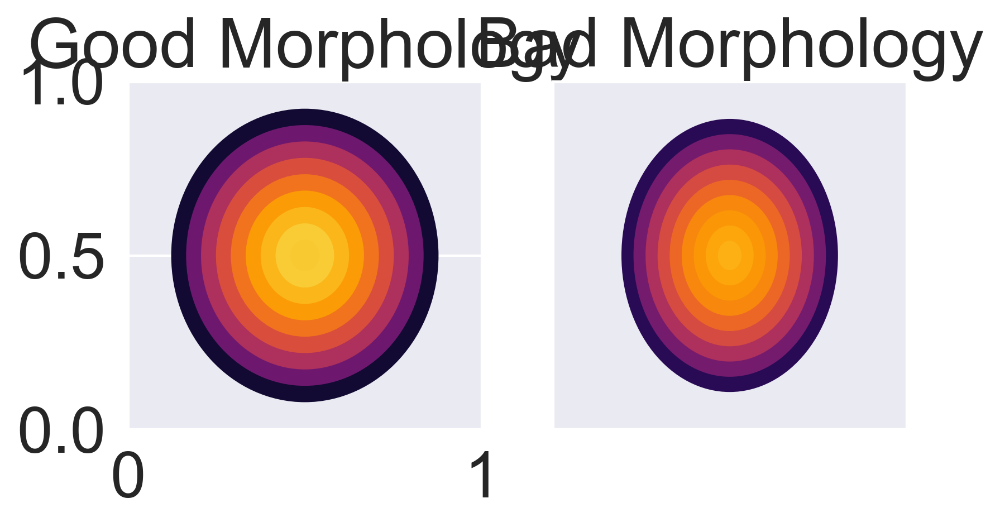

In [106]:
import matplotlib.pyplot as plt
from matplotlib import colormaps
from matplotlib.patches import Ellipse
import os


out = f"{home_directory}/Plots/PLSR Feature Plots/"
if not os.path.exists(out):
    os.mkdir(out)
    print(out)

cmap = colormaps["inferno"]


circles_good = [Ellipse((0.5, 0.5), width = rad[0], height = rad[1], color=cmap(val)) for val,rad in zip(np.flip(means_good),radii_good)]

circles_bad = [Ellipse((0.5, 0.5), width = rad[0], height = rad[1], color=cmap(val)) for val,rad in zip(np.flip(means_bad),radii_bad)]

fig, ax = plt.subplots(1,2,figsize = (6,2.7)) # note we must use plt.subplots, not plt.subplot
# (or if you have an existing figure)
# fig = plt.gcf()
# ax = fig.gca()
for circle in circles_good:
    ax[0].add_patch(circle)
    ax[0].set_title("Good Morphology")
    #ax[0].set_xticks([])
    #ax[0].set_yticks([])
    
for circle in circles_bad:
    ax[1].add_patch(circle)
    ax[1].set_title("Bad Morphology")
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
plt.savefig(f"{out}BRA Mask Radial Dist Good v Bad.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


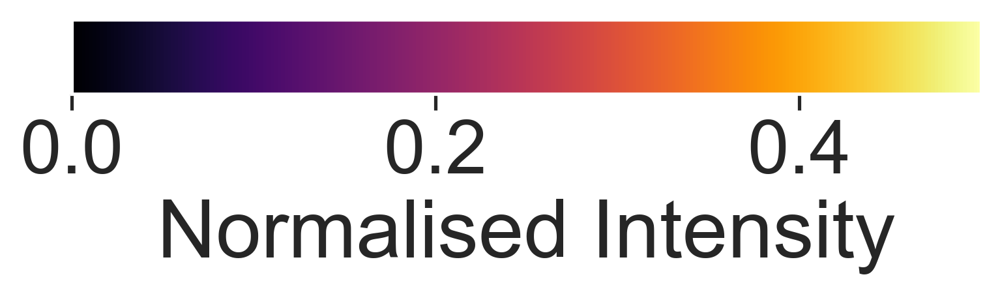

In [107]:
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

norm = mpl.colors.Normalize(vmin=0., vmax=0.5)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal')
cb1.set_label('Normalised Intensity')
fig.show()
plt.savefig(f"{out}BRA Mask Radial Dist colorbar.pdf", format="pdf", bbox_inches="tight")

In [108]:
frac_96_bra_single = mean_frac_feats_96_bra_scaled[mean_frac_feats_96_bra_scaled["Axes"]=="single"].merge(raw_data[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']+["Run","Plate","ID"]],on=["Run","Plate","ID"])
frac_96_bra_double = mean_frac_feats_96_bra_scaled[mean_frac_feats_96_bra_scaled["Axes"]=="double"].merge(raw_data[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']+["Run","Plate","ID"]],on=["Run","Plate","ID"])

means_single = frac_96_bra_single[[key for key in frac_96_bra_good.keys() if "Mean" in key]].median().to_numpy()/0.5
means_double = frac_96_bra_double[[key for key in frac_96_bra_bad.keys() if "Mean" in key]].median().to_numpy()/0.5
means_double

array([0.90218933, 0.89162406, 0.84654043, 0.77852532, 0.6927698 ,
       0.58937383, 0.46918201, 0.30898916, 0.09078683])

In [109]:
single_axis_lengths = frac_96_bra_single[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']].median().to_numpy()/420
double_axis_lengths = frac_96_bra_double[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']].median().to_numpy()/420
radii_single = [i*single_axis_lengths for i in np.flip(np.linspace(0.1,1,9,))]
radii_double = [i*double_axis_lengths for i in np.flip(np.linspace(0.1,1,9,))]

meta NOT subset; don't know how to subset; dropped


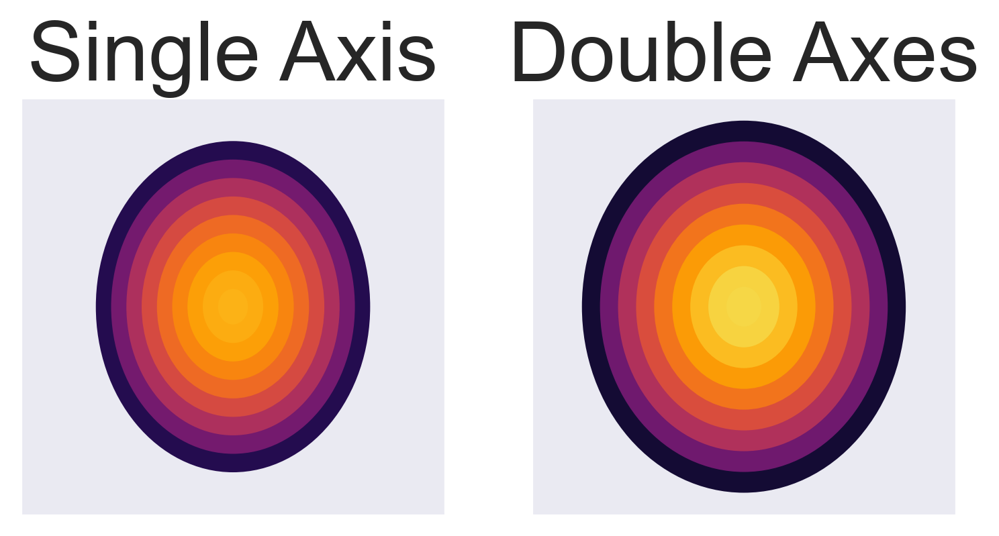

In [110]:
import matplotlib.pyplot as plt
from matplotlib import colormaps

cmap = colormaps["inferno"]
radii = np.flip(np.linspace(0.05,0.45,9,))

circles_good = [Ellipse((0.5, 0.5), width = rad[0], height = rad[1], color=cmap(val)) for val,rad in zip(np.flip(means_single),radii_single)]

circles_bad = [Ellipse((0.5, 0.5), width = rad[0], height = rad[1], color=cmap(val)) for val,rad in zip(np.flip(means_double),radii_double)]

fig, ax = plt.subplots(1,2,figsize = (6,2.7)) # note we must use plt.subplots, not plt.subplot
# (or if you have an existing figure)
# fig = plt.gcf()
# ax = fig.gca()
for circle in circles_good:
    ax[0].add_patch(circle)
    ax[0].set_title("Single Axis")
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    
for circle in circles_bad:
    ax[1].add_patch(circle)
    ax[1].set_title("Double Axes")
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
plt.savefig(f"{out}BRA Mask Radial Dist single v double.pdf", format="pdf", bbox_inches="tight")

In [111]:
mean_frac_feats_96_bf = raw_data[[key for key in raw_data.keys() if ("MeanFrac" in key and "96h" in key and "bf_mask" in key) or key in ["Run","Plate","ID"]]].dropna()
indexed = mean_frac_feats_96_bf.set_index(["Run","Plate","ID"])
grouped_hour = indexed.groupby(["Run","Plate"])

out = []
for group,idx in grouped_hour.groups.items():
    df = indexed.loc[idx]
    df_np = df.to_numpy()
    scaled =  (df_np - df_np.min()) / df_np.max()
    out.append(pd.DataFrame(scaled, columns = df.columns, index =df.index))

mean_frac_feats_96_bf_scaled = pd.concat(out,axis=0)
mean_frac_feats_96_bf_scaled = mean_frac_feats_96_bf_scaled.reset_index().merge(no_na_annot,on=["Run","Plate","ID"]).dropna()

frac_96_bf_good = mean_frac_feats_96_bf_scaled[mean_frac_feats_96_bf_scaled["Morph"]=="good"].merge(raw_data[['096h_str_BF_AreaShape_major_axis_length','096h_str_BF_AreaShape_minor_axis_length']+["Run","Plate","ID"]],on=["Run","Plate","ID"])
frac_96_bf_bad = mean_frac_feats_96_bf_scaled[mean_frac_feats_96_bf_scaled["Morph"]=="bad"].merge(raw_data[['096h_str_BF_AreaShape_major_axis_length','096h_str_BF_AreaShape_minor_axis_length']+["Run","Plate","ID"]],on=["Run","Plate","ID"])

means_good_bf = frac_96_bf_good[[key for key in frac_96_bf_good.keys() if "Mean" in key]].median().to_numpy()/0.55
means_bad_bf = frac_96_bf_bad[[key for key in frac_96_bf_bad.keys() if "Mean" in key]].median().to_numpy()/0.55
means_good_bf

array([0.92333818, 0.91182105, 0.87005717, 0.80454664, 0.71670039,
       0.60393326, 0.47788907, 0.30967014, 0.1068306 ])

In [112]:
means_bad_bf

array([0.95586223, 0.93255398, 0.89696553, 0.84035779, 0.73526439,
       0.60813218, 0.46450539, 0.28778278, 0.08818706])

In [113]:
g_axis_lengths = frac_96_bf_good[['096h_str_BF_AreaShape_major_axis_length','096h_str_BF_AreaShape_minor_axis_length']].median().to_numpy()/420
b_axis_lengths = frac_96_bf_bad[['096h_str_BF_AreaShape_major_axis_length','096h_str_BF_AreaShape_minor_axis_length']].median().to_numpy()/420
g_radii = [i*g_axis_lengths for i in np.flip(np.linspace(0.1,0.9,9,))]
b_radii = [i*b_axis_lengths for i in np.flip(np.linspace(0.1,0.9,9,))]
g_radii

[array([0.87842258, 0.70620057]),
 array([0.78082007, 0.62773384]),
 array([0.68321756, 0.54926711]),
 array([0.58561505, 0.47080038]),
 array([0.48801254, 0.39233365]),
 array([0.39041003, 0.31386692]),
 array([0.29280753, 0.23540019]),
 array([0.19520502, 0.15693346]),
 array([0.09760251, 0.07846673])]

# Distribution in Whole Structure

meta NOT subset; don't know how to subset; dropped


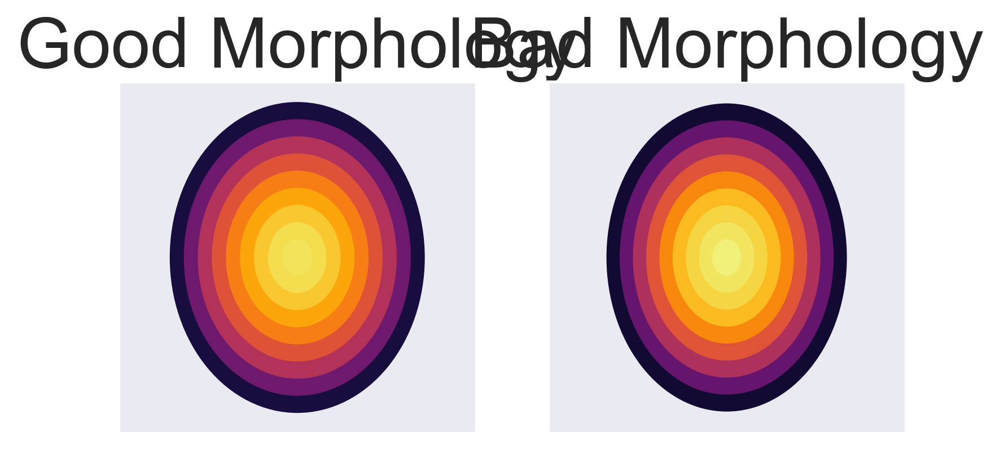

In [114]:
import matplotlib.pyplot as plt
from matplotlib import colormaps

out = f"{home_directory}/Plots/PLSR Feature Plots/"

cmap = colormaps["inferno"]
radii = np.flip(np.linspace(0.05,0.5,9,))

circles_good = [Ellipse((0.5, 0.5), width = rad[1], height = rad[0], color=cmap(val)) for val,rad in zip(np.flip(means_good_bf),g_radii)]

circles_bad = [Ellipse((0.5, 0.5), width = rad[1], height = rad[0], color=cmap(val)) for val,rad in zip(np.flip(means_bad_bf),b_radii)]

fig, ax = plt.subplots(1,2,figsize = (6,2.7)) # note we must use plt.subplots, not plt.subplot
# (or if you have an existing figure)
# fig = plt.gcf()
# ax = fig.gca()
for circle in circles_good:
    ax[0].add_patch(circle)
    ax[0].set_title("Good Morphology")
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    
for circle in circles_bad:
    ax[1].add_patch(circle)
    ax[1].set_title("Bad Morphology")
    ax[1].set_xticks([])
    ax[1].set_yticks([])
plt.savefig(f"{out}BF Mask Radial Dist Good v Bad.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


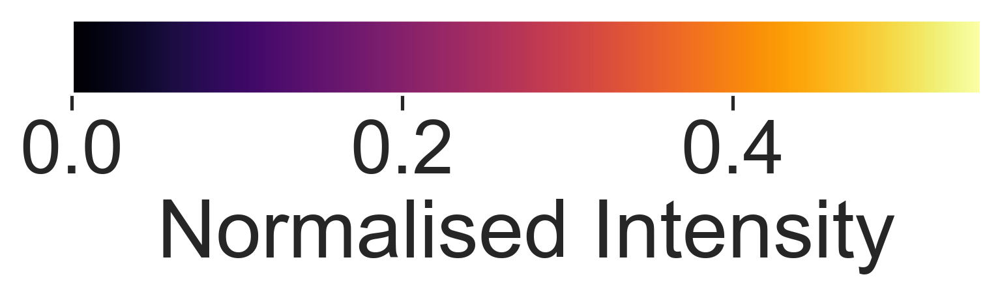

In [115]:
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

norm = mpl.colors.Normalize(vmin=0., vmax=0.55)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal')
cb1.set_label('Normalised Intensity')
fig.show()
plt.savefig(f"{out}BF Mask Radial Dist colorbar.pdf", format="pdf", bbox_inches="tight")

In [116]:
means_single_bf = mean_frac_feats_96_bf_scaled[mean_frac_feats_96_bf_scaled["Axes"]=="single"][[key for key in frac_96_bf_good.keys() if "Mean" in key]].median().to_numpy()/0.55
means_double_bf = mean_frac_feats_96_bf_scaled[mean_frac_feats_96_bf_scaled["Axes"]=="double"][[key for key in frac_96_bf_good.keys() if "Mean" in key]].median().to_numpy()/0.55

means_single_bf

array([0.92445285, 0.91688786, 0.88301108, 0.83004827, 0.72918651,
       0.60709138, 0.46637126, 0.29093455, 0.09594465])

In [117]:
g=mean_frac_feats_96_bf_scaled[mean_frac_feats_96_bf_scaled["Axes"]=="single"].merge(raw_data[['096h_str_BF_AreaShape_major_axis_length','096h_str_BF_AreaShape_minor_axis_length']+["Run","Plate","ID"]],on=["Run","Plate","ID"])
b=mean_frac_feats_96_bf_scaled[mean_frac_feats_96_bf_scaled["Axes"]=="double"].merge(raw_data[['096h_str_BF_AreaShape_major_axis_length','096h_str_BF_AreaShape_minor_axis_length']+["Run","Plate","ID"]],on=["Run","Plate","ID"])
g_axis_lengths = g[['096h_str_BF_AreaShape_major_axis_length','096h_str_BF_AreaShape_minor_axis_length']].median().to_numpy()/420
b_axis_lengths = b[['096h_str_BF_AreaShape_major_axis_length','096h_str_BF_AreaShape_minor_axis_length']].median().to_numpy()/420
g_radii = [i*g_axis_lengths for i in np.flip(np.linspace(0.1,0.9,9,))]
b_radii = [i*b_axis_lengths for i in np.flip(np.linspace(0.1,0.9,9,))]
b_radii

[array([0.85602388, 0.73035729]),
 array([0.76091012, 0.64920648]),
 array([0.66579635, 0.56805567]),
 array([0.57068259, 0.48690486]),
 array([0.47556882, 0.40575405]),
 array([0.38045506, 0.32460324]),
 array([0.28534129, 0.24345243]),
 array([0.19022753, 0.16230162]),
 array([0.09511376, 0.08115081])]

In [118]:
means_double_bf

array([0.92294107, 0.90963959, 0.86981278, 0.80077511, 0.7101983 ,
       0.60173677, 0.47739783, 0.31697255, 0.10841702])

meta NOT subset; don't know how to subset; dropped


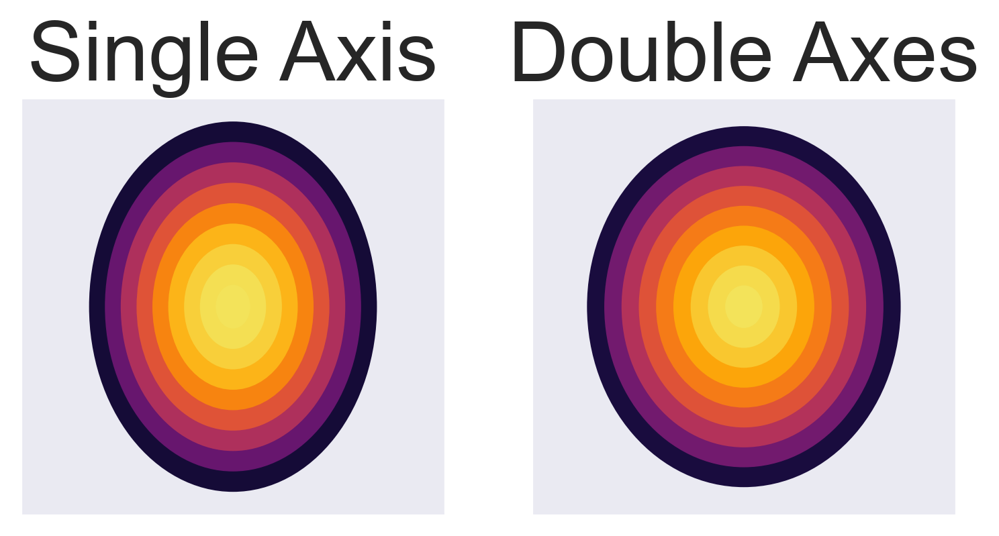

In [119]:
import matplotlib.pyplot as plt
from matplotlib import colormaps

cmap = colormaps["inferno"]
radii = np.flip(np.linspace(0.05,0.45,9,))

circles_good = [Ellipse((0.5, 0.5), width = rad[1], height = rad[0], color=cmap(val)) for val,rad in zip(np.flip(means_single_bf),g_radii)]

circles_bad = [Ellipse((0.5, 0.5), width = rad[1], height = rad[0], color=cmap(val)) for val,rad in zip(np.flip(means_double_bf),b_radii)]

fig, ax = plt.subplots(1,2,figsize = (6,2.7)) # note we must use plt.subplots, not plt.subplot
# (or if you have an existing figure)
# fig = plt.gcf()
# ax = fig.gca()
for circle in circles_good:
    ax[0].add_patch(circle)
    ax[0].set_title("Single Axis")
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    
for circle in circles_bad:
    ax[1].add_patch(circle)
    ax[1].set_title("Double Axes")
    ax[1].set_xticks([])
    ax[1].set_yticks([])
plt.savefig(f"{out}BF Mask Radial Dist Single v Double.pdf", format="pdf", bbox_inches="tight")

# Making Average Structure Images

In [120]:
normalised_keys = ['096h_raw_CH_bra_mask_Intensity_MeanIntensity']
raw_keys = [
    '096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation',
    '096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation',
    '096h_str_BF_AreaShape_major_axis_length',
    '096h_str_BF_AreaShape_minor_axis_length',
    '096h_raw_CH_bra_mask_AreaShape_MinorAxisLength',
    '096h_raw_CH_bra_mask_AreaShape_MajorAxisLength'
]

avg_shape_df = pd.concat([raw_data[["Run","Plate","ID"]+raw_keys],normalised_data[normalised_keys]],axis=1).merge(no_na_annot,on=["Run","Plate","ID"]).dropna()
avg_shape_df

,Run,Plate,ID,096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation,096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation,096h_str_BF_AreaShape_major_axis_length,096h_str_BF_AreaShape_minor_axis_length,096h_raw_CH_bra_mask_AreaShape_MinorAxisLength,096h_raw_CH_bra_mask_AreaShape_MajorAxisLength,096h_raw_CH_bra_mask_Intensity_MeanIntensity,Axes,Morph,Morph_Class
0,RR,1,A1,0.027743,0.018767,381.485738,373.430325,344.011036,363.209396,1.185069,single,good,single_good
1,RR,1,A2,0.013417,0.031259,385.157015,334.494138,299.728115,337.914872,0.392467,single,bad,single_bad
2,RR,1,A3,0.041057,0.014838,376.608790,349.736374,335.686745,340.056582,0.622074,single,bad,single_bad
3,RR,1,A4,0.053157,0.007887,436.494294,313.134779,322.009307,353.129195,1.492314,single,good,single_good
4,RR,1,A5,0.038555,0.006555,410.968782,283.242929,176.853205,253.190722,-1.733129,single,bad,single_bad
...,...,...,...,...,...,...,...,...,...,...,...,...,...
433,TR,2,H8,0.010821,0.026928,435.826496,344.275119,350.787345,384.749938,0.856444,unclassified,unclassified,unclassified_unclassified
434,TR,2,H9,0.035616,0.026081,468.535501,354.186991,346.205819,408.278311,0.699287,single,good,single_good
435,TR,2,H10,0.009338,0.004076,447.181922,372.702320,372.331691,422.856170,1.313529,double,unclassified,double_unclassified
436,TR,2,H11,0.012343,0.042325,506.264752,313.643540,318.527575,464.439956,0.702561,single,good,single_good


In [121]:
gt_keys = ["Run","Plate","ID","Axes","Morph","Morph_Class"]
avg_shape_g_v_b = [avg_shape_df[avg_shape_df["Morph"]==val].drop(gt_keys,axis=1).median() for val in ["good","bad"]]
avg_shape_g_v_b[0]

096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation      0.032064
096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation      0.010395
096h_str_BF_AreaShape_major_axis_length             409.930536
096h_str_BF_AreaShape_minor_axis_length             329.560267
096h_raw_CH_bra_mask_AreaShape_MinorAxisLength      314.356117
096h_raw_CH_bra_mask_AreaShape_MajorAxisLength      351.221391
096h_raw_CH_bra_mask_Intensity_MeanIntensity          0.355141
dtype: float64

meta NOT subset; don't know how to subset; dropped


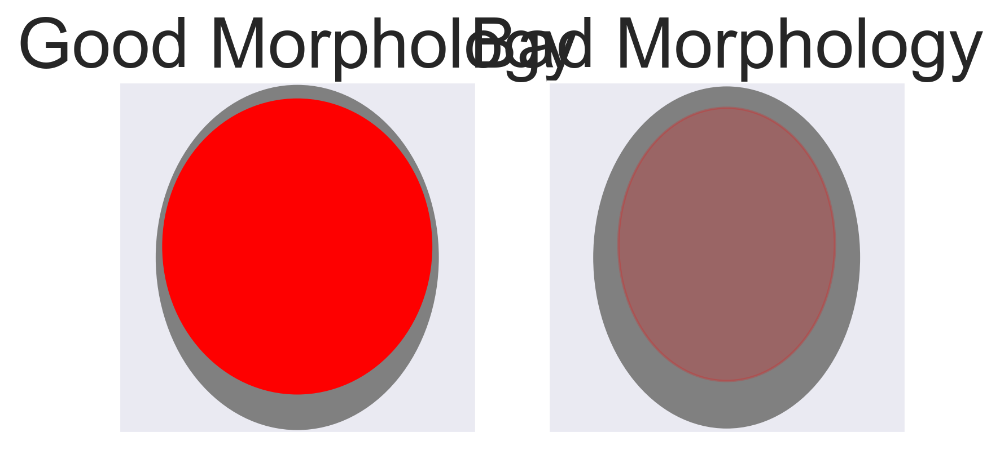

In [122]:
map_new = colormaps["YlOrRd"]

circles_outside = []
circles_inside = []
for df in avg_shape_g_v_b:
    mins = np.array([df["096h_str_BF_AreaShape_minor_axis_length"],df["096h_raw_CH_bra_mask_AreaShape_MinorAxisLength"]])/420
    majs = np.array([df["096h_str_BF_AreaShape_major_axis_length"],df["096h_raw_CH_bra_mask_AreaShape_MajorAxisLength"]])/420
    offset_height, offset_width = [
        (df["096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation"]*df["096h_str_BF_AreaShape_major_axis_length"])/420,
        (df["096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation"]*df["096h_str_BF_AreaShape_minor_axis_length"])/420,
    ]
    circles_outside.append(Ellipse((0.5, 0.5), width = mins[0], height = majs[0], color="grey"))
    circles_inside.append(Ellipse((0.5, 0.5+offset_height), width = mins[1], height = majs[1], color="red",alpha=df["096h_raw_CH_bra_mask_Intensity_MeanIntensity"]+.64))
    
fig, axs = plt.subplots(1,2,figsize = (6,2.7)) 

for ax,c_out,c_in in zip(axs,circles_outside,circles_inside):
    ax.add_patch(c_out)
    ax.add_patch(c_in)
    ax.set_xticks([])
    ax.set_yticks([])

axs[0].set_title("Good Morphology")
axs[1].set_title("Bad Morphology")
plt.savefig(f"{out}Average Shape Good v Bad.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


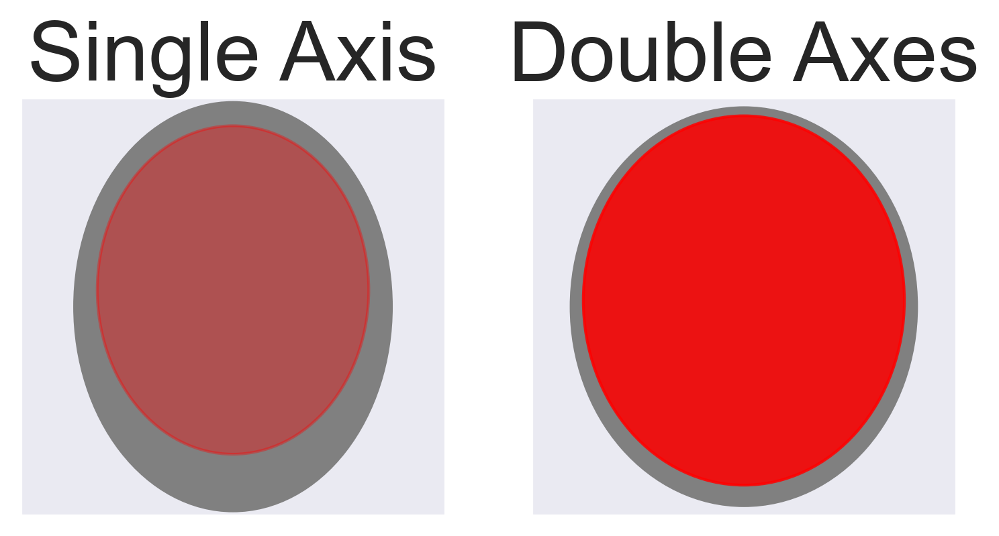

In [123]:
avg_shape_g_v_b = [avg_shape_df[avg_shape_df["Axes"]==val].drop(gt_keys,axis=1).median() for val in ["single","double"]]
avg_shape_g_v_b[0]

circles_outside = []
circles_inside = []
for df in avg_shape_g_v_b:
    mins = np.array([df["096h_str_BF_AreaShape_minor_axis_length"],df["096h_raw_CH_bra_mask_AreaShape_MinorAxisLength"]])/420
    majs = np.array([df["096h_str_BF_AreaShape_major_axis_length"],df["096h_raw_CH_bra_mask_AreaShape_MajorAxisLength"]])/420
    offset_height, offset_width = [
        (df["096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation"]*df["096h_str_BF_AreaShape_major_axis_length"])/420,
        (df["096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation"]*df["096h_str_BF_AreaShape_minor_axis_length"])/420,
    ]
    circles_outside.append(Ellipse((0.5, 0.5), width = mins[0], height = majs[0], color="grey"))
    circles_inside.append(Ellipse((0.5, 0.5+offset_height), width = mins[1], height = majs[1], color="red",alpha=df["096h_raw_CH_bra_mask_Intensity_MeanIntensity"]+.64))
    
fig, axs = plt.subplots(1,2,figsize = (6,2.7)) 

for ax,c_out,c_in in zip(axs,circles_outside,circles_inside):
    ax.add_patch(c_out)
    ax.add_patch(c_in)
    ax.set_xticks([])
    ax.set_yticks([])

axs[0].set_title("Single Axis")
axs[1].set_title("Double Axes")
plt.savefig(f"{out}Average Shape Single v Double.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


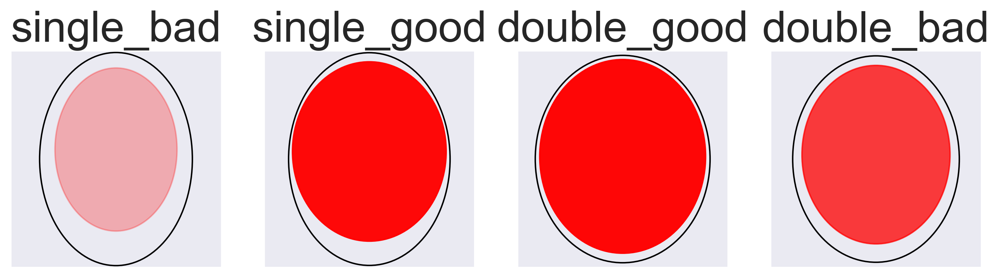

In [124]:
avg_shape_morph_class= [avg_shape_df[avg_shape_df["Morph_Class"]==val].drop(gt_keys,axis=1).median() for val in ["single_bad","single_good","double_good","double_bad"]]
avg_shape_morph_class[0]

circles_outside = []
circles_inside = []
for df in avg_shape_morph_class:
    mins = np.array([df["096h_str_BF_AreaShape_minor_axis_length"],df["096h_raw_CH_bra_mask_AreaShape_MinorAxisLength"]])/420
    majs = np.array([df["096h_str_BF_AreaShape_major_axis_length"],df["096h_raw_CH_bra_mask_AreaShape_MajorAxisLength"]])/420
    offset_height, offset_width = [
        (df["096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation"]*df["096h_str_BF_AreaShape_major_axis_length"])/420,
        (df["096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation"]*df["096h_str_BF_AreaShape_minor_axis_length"])/420,
    ]
    circles_outside.append(Ellipse((0.5, 0.5), width = mins[0], height = majs[0], fill = False,color="black",edgecolor = "black"))
    circles_inside.append(Ellipse((0.5, 0.5+offset_height), width = mins[1], height = majs[1], color="red",alpha=(df["096h_raw_CH_bra_mask_Intensity_MeanIntensity"]+1)/1.4))
    
fig, axs = plt.subplots(1,4,figsize = (12,2.7)) 

for ax,c_out,c_in,name in zip(axs,circles_outside,circles_inside,["single_bad","single_good","double_good","double_bad"]):
    ax.add_patch(c_out)
    ax.add_patch(c_in)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(name)

plt.savefig(f"{out}Average Shape Morph Class.pdf", format="pdf", bbox_inches="tight")

In [125]:
master_df = avg_shape_df.merge(mean_frac_feats_96_bra_scaled.drop(["Axes","Morph","Morph_Class"],axis=1),on=["Run","Plate","ID"])
master_df.keys()

Index(['Run', 'Plate', 'ID',
       '096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation',
       '096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation',
       '096h_str_BF_AreaShape_major_axis_length',
       '096h_str_BF_AreaShape_minor_axis_length',
       '096h_raw_CH_bra_mask_AreaShape_MinorAxisLength',
       '096h_raw_CH_bra_mask_AreaShape_MajorAxisLength',
       '096h_raw_CH_bra_mask_Intensity_MeanIntensity', 'Axes', 'Morph',
       'Morph_Class', '096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_1of9',
       '096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_2of9',
       '096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_3of9',
       '096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_4of9',
       '096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_5of9',
       '096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_6of9',
       '096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_7of9',
       '096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_8of9',
       '096h_raw_CH_bra_mask_RadialDistr

meta NOT subset; don't know how to subset; dropped


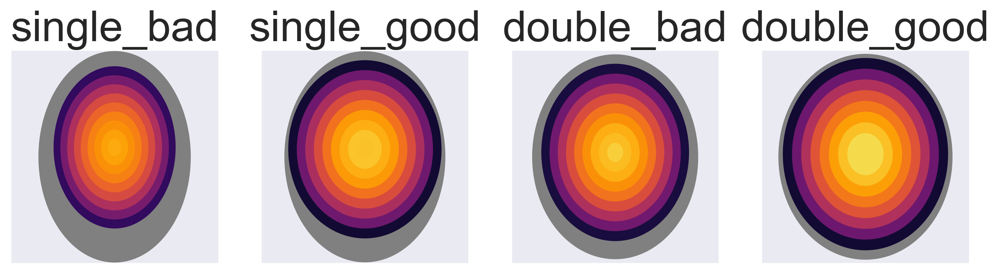

In [126]:
def make_radial_dist_patches(df,dist_keys,factorintensity = 0.5, factor_axes= 420):
    df = df.median()
    
    dist_vals = df[dist_keys].to_numpy()/factorintensity
    in_ax_length = df[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']].to_numpy()/factor_axes
    inside_axis_concentric = [i*in_ax_length for i in np.flip(np.linspace(0.1,1,9,))]
    
    out_axes = np.array([df["096h_str_BF_AreaShape_major_axis_length"],df["096h_str_BF_AreaShape_minor_axis_length"]])/420
    
    offset_height = (
        df["096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation"]*df["096h_str_BF_AreaShape_major_axis_length"]
    )/factor_axes
    
    c_out = Ellipse((0.5, 0.5), width = out_axes[1], height = out_axes[0], color="grey")
    circles_bra = [Ellipse((0.5, 0.5+offset_height), width = rad[0], height = rad[1], color=cmap(val)) for val,rad in zip(np.flip(dist_vals),inside_axis_concentric)]
    
    return [c_out] + circles_bra

fig, axs = plt.subplots(1,4,figsize = (12,2.7))

for ax,subset in zip(axs,["single_bad","single_good","double_bad","double_good"]):
    ellipses = make_radial_dist_patches(
        master_df[master_df["Morph_Class"]==subset].drop(gt_keys,axis=1),
        [key for key in master_df.keys() if "Radial" in key]
    )

    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)

plt.savefig(f"{out}Average Shape Axes x Morph.pdf", format="pdf", bbox_inches="tight")

In [127]:
make_radial_dist_patches(master_df[master_df["Morph"]=="good"].drop(gt_keys,axis=1),[key for key in master_df.keys() if "Radial" in key])

meta NOT subset; don't know how to subset; dropped


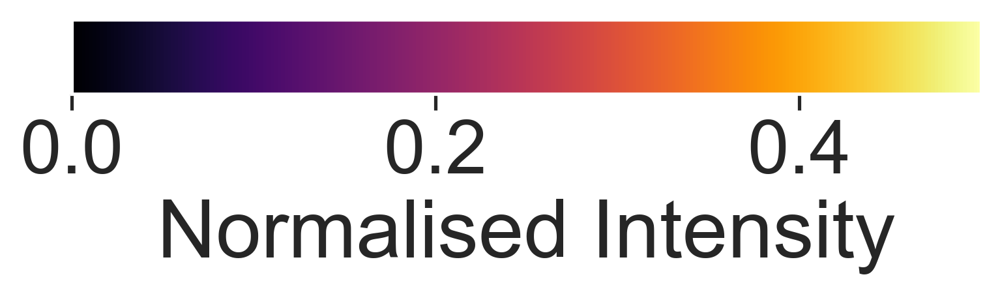

In [128]:
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

norm = mpl.colors.Normalize(vmin=0., vmax=0.5)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal')
cb1.set_label('Normalised Intensity')
fig.show()
plt.savefig(f"{out}Average Shape Axes x Morph colorbar.pdf", format="pdf", bbox_inches="tight")

Morph
bad             183
good            129
unclassified    126
Name: Run, dtype: int64


meta NOT subset; don't know how to subset; dropped


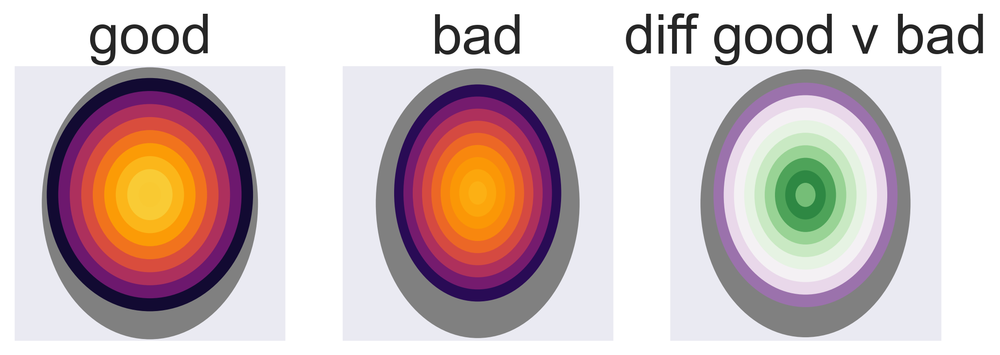

In [129]:
def make_radial_dist_difference(
    df,
    dist_keys,
    annotation,
    annotation_values,
    factorintensity = 0.5, 
    factor_axes= 420,
    cmap = "PRGn", 
    data_bounds = (-0.2,0,0.2),
    gt_keys= ["Run","Plate","ID","Axes","Morph","Morph_Class"],
):
    df_1 = df[df[annotation]==annotation_values[0]].drop(gt_keys,axis=1).median()
    df_2 = df[df[annotation]==annotation_values[1]].drop(gt_keys,axis=1).median()
    
                                
    df = df.drop(gt_keys,axis=1).median()
    cmap_now = colormaps[cmap]
    
    dist_vals = df_1[dist_keys].to_numpy()/factorintensity - df_2[dist_keys].to_numpy()/factorintensity
    
    in_ax_length = df[['096h_raw_CH_bra_mask_AreaShape_MinorAxisLength','096h_raw_CH_bra_mask_AreaShape_MajorAxisLength']].to_numpy()/factor_axes
    inside_axis_concentric = [i*in_ax_length for i in np.flip(np.linspace(0.1,1,9,))]
    
    out_axes = np.array([df["096h_str_BF_AreaShape_major_axis_length"],df["096h_str_BF_AreaShape_minor_axis_length"]])/420
    
    offset_height = (
        df["096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation"]*df["096h_str_BF_AreaShape_major_axis_length"]
    )/factor_axes
    
    c_out = Ellipse((0.5, 0.5), width = out_axes[1], height = out_axes[0], color="grey")
    
    circles_bra = [
        Ellipse((0.5, 0.5+offset_height), width = rad[0], height = rad[1], color=cmap_now(np.interp(val,data_bounds,(0,0.5,1)))) 
        for val,rad in zip(np.flip(dist_vals),inside_axis_concentric)
    ]
    
    return [c_out] + circles_bra

counts = master_df.dropna().groupby("Morph")["Run"].count()
print(counts)


fig, axs = plt.subplots(1,3,figsize = (9,2.7))

for ax,subset in zip(axs,["good","bad","diff good v bad"]):
    if subset != "diff good v bad":
        ellipses = make_radial_dist_patches(
            master_df[master_df["Morph"]==subset].drop(gt_keys,axis=1),
            [key for key in master_df.keys() if "Radial" in key]
        )
    else:
        ellipses = make_radial_dist_difference(
        master_df,
        [key for key in master_df.keys() if "Radial" in key],
        factorintensity = 0.5, 
        factor_axes= 420,
        annotation= "Morph",
        annotation_values=["good","bad"],
        cmap = "PRGn", 
        data_bounds = (-0.1,0,0.1)
    )
    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)

plt.savefig(f"{out}Average Shape good bad and Diff.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


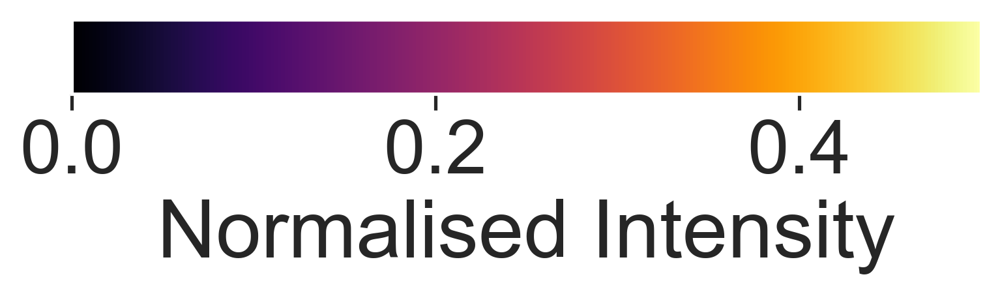

In [130]:
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

norm = mpl.colors.Normalize(vmin=0., vmax=0.5)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal')
cb1.set_label('Normalised Intensity')
fig.show()
plt.savefig(f"{out}Average Shape Single Double and Diff colorbar 1.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


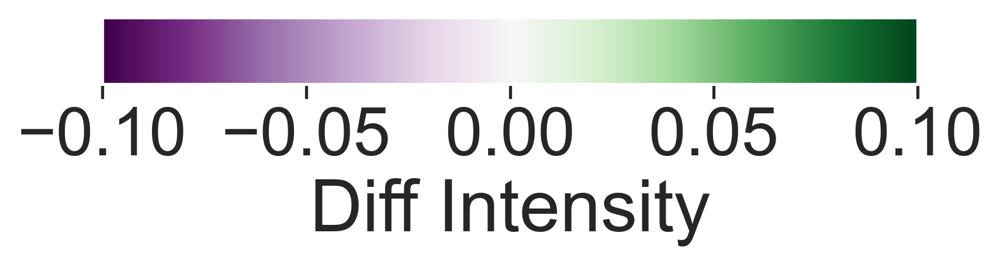

In [131]:
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

cmap_diff = colormaps["PRGn"]
norm = mpl.colors.Normalize(vmin=-0.1, vmax=0.1)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap_diff,
                                norm=norm,
                                orientation='horizontal')
cb1.set_label('Diff Intensity')
fig.show()
plt.savefig(f"{out}Average Shape Single Double and Diff colorbar 2.pdf", format="pdf", bbox_inches="tight")

Axes
double          136
single          257
unclassified     45
Name: Run, dtype: int64


meta NOT subset; don't know how to subset; dropped


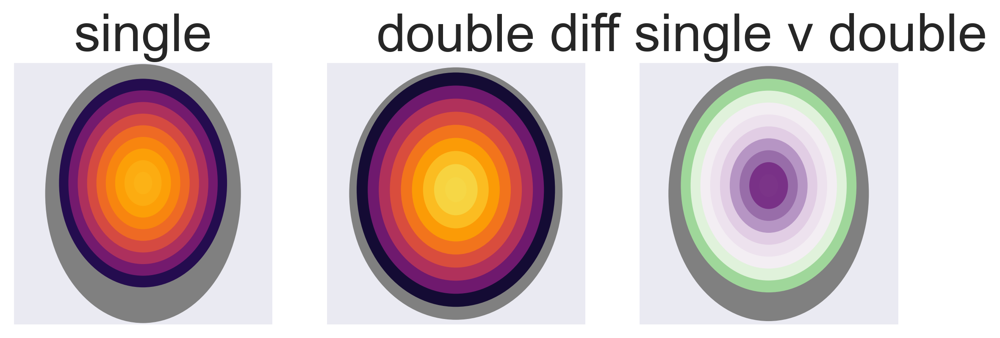

In [132]:
counts = master_df.dropna().groupby("Axes")["Run"].count()
print(counts)

fig, axs = plt.subplots(1,3,figsize = (9,2.7))

for ax,subset in zip(axs,["single","double","diff single v double"]):
    if subset != "diff single v double":
        ellipses = make_radial_dist_patches(
            master_df[master_df["Axes"]==subset].drop(gt_keys,axis=1),
            [key for key in master_df.keys() if "Radial" in key]
        )
    else:
        ellipses = make_radial_dist_difference(
        master_df,
        [key for key in master_df.keys() if "Radial" in key],
        factorintensity = 0.5, 
        factor_axes= 420,
        annotation= "Axes",
        annotation_values=["single","double"],
        cmap = "PRGn", 
        data_bounds = (-0.1,0,0.1)
    )
    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)
    
plt.savefig(f"{out}Average Shape Single Double and Diff.pdf", format="pdf", bbox_inches="tight")

Morph_Class
double_bad                    55
double_good                   34
double_unclassified           47
single_bad                   128
single_good                   95
single_unclassified           34
unclassified_unclassified     45
Name: Run, dtype: int64


meta NOT subset; don't know how to subset; dropped


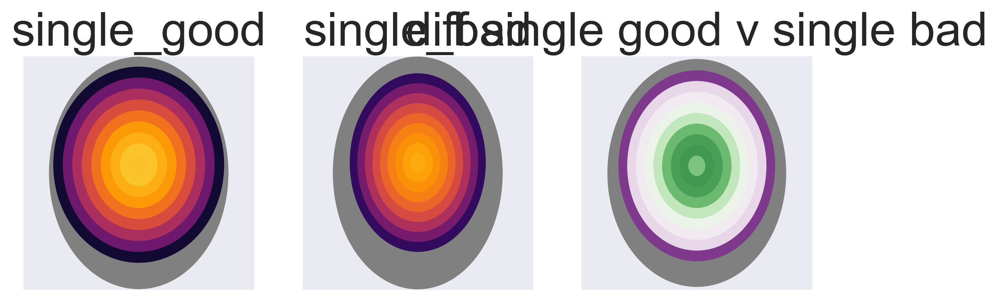

In [133]:
counts = master_df.groupby("Morph_Class")["Run"].count()
print(counts)

fig, axs = plt.subplots(1,3,figsize = (9,2.7))

for ax,subset in zip(axs,["single_good","single_bad","diff single good v single bad"]):
    if subset != "diff single good v single bad":
        ellipses = make_radial_dist_patches(
            master_df[master_df["Morph_Class"]==subset].drop(gt_keys,axis=1),
            [key for key in master_df.keys() if "Radial" in key]
        )
    else:
        ellipses = make_radial_dist_difference(
            master_df,
            [key for key in master_df.keys() if "Radial" in key],
            factorintensity = 0.5, 
            factor_axes= 420,
            annotation= "Morph_Class",
            annotation_values=["single_good","single_bad"],
            cmap = "PRGn", 
            data_bounds = (-0.1,0,0.1)
        )
    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)
    
plt.savefig(f"{out}Average Shape Single good bad and Diff.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


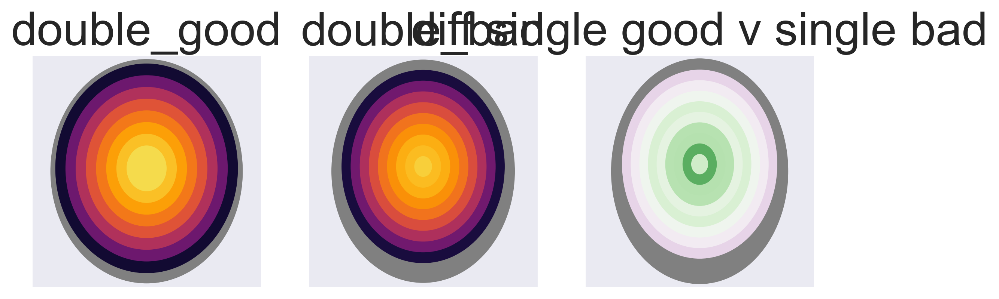

In [134]:
fig, axs = plt.subplots(1,3,figsize = (9,2.7))

for ax,subset in zip(axs,["double_good","double_bad","diff single good v single bad"]):
    if subset != "diff single good v single bad":
        ellipses = make_radial_dist_patches(
            master_df[master_df["Morph_Class"]==subset].drop(gt_keys,axis=1),
            [key for key in master_df.keys() if "Radial" in key]
        )
    else:
        ellipses = make_radial_dist_difference(
            master_df,
            [key for key in master_df.keys() if "Radial" in key],
            factorintensity = 0.5, 
            factor_axes= 420,
            annotation= "Morph_Class",
            annotation_values=["double_good","double_bad"],
            cmap = "PRGn", 
            data_bounds = (-0.1,0,0.1)
        )
    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)
    
plt.savefig(f"{out}Average Shape double good bad and Diff.pdf", format="pdf", bbox_inches="tight")

In [135]:
normalised_keys_72 = ['072h_raw_CH__bf_mask_Intensity_MeanIntensity']
raw_keys_72 = [
    '072h_str_BF_AreaShape_major_axis_length',
    '072h_str_BF_AreaShape_minor_axis_length',
]

avg_shape_72_df = pd.concat([raw_data[["Run","Plate","ID"]+raw_keys_72],normalised_data[normalised_keys_72]],axis=1).merge(no_na_annot,on=["Run","Plate","ID"]).dropna()
avg_shape_72_df

,Run,Plate,ID,072h_str_BF_AreaShape_major_axis_length,072h_str_BF_AreaShape_minor_axis_length,072h_raw_CH__bf_mask_Intensity_MeanIntensity,Axes,Morph,Morph_Class
0,RR,1,A1,316.736311,302.738257,0.943515,single,good,single_good
1,RR,1,A2,285.740970,269.907051,0.527798,single,bad,single_bad
2,RR,1,A3,325.070651,291.744464,0.261319,single,bad,single_bad
3,RR,1,A4,293.688669,271.731034,0.909369,single,good,single_good
4,RR,1,A5,311.943008,280.204426,-1.477364,single,bad,single_bad
...,...,...,...,...,...,...,...,...,...
433,TR,2,H8,297.895025,281.965729,0.377432,unclassified,unclassified,unclassified_unclassified
434,TR,2,H9,275.680963,272.682362,0.710768,single,good,single_good
435,TR,2,H10,297.178010,286.336853,1.105847,double,unclassified,double_unclassified
436,TR,2,H11,262.421572,253.833479,2.496344,single,good,single_good


In [136]:
mean_frac_feats_72_bf = raw_data[[key for key in raw_data.keys() if ("MeanFrac" in key and "72h" in key and "bf_mask" in key) or key in ["Run","Plate","ID"]]].dropna()
indexed = mean_frac_feats_72_bf.set_index(["Run","Plate","ID"])
grouped_hour = indexed.groupby(["Run","Plate"])

out = []
for group,idx in grouped_hour.groups.items():
    df = indexed.loc[idx]
    df_np = df.to_numpy()
    scaled =  (df_np - df_np.min()) / df_np.max()
    out.append(pd.DataFrame(scaled, columns = df.columns, index =df.index))

mean_frac_feats_72_bf_scaled = pd.concat(out,axis=0)
mean_frac_feats_72_bf_scaled

072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_1of9  \
Run Plate ID                                                           
RR  1     A1                                            0.236724       
          A2                                            0.209976       
          A3                                            0.277924       
          A4                                            0.242122       
          A5                                            0.260200       
...                                                          ...       
TR  2     H8                                            0.374557       
          H9                                            0.320693       
          H10                                           0.299060       
          H11                                           0.296859       
          H12                                           0.237544       

               072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_2of9  \
Run Plate ID                                                           
RR  1     A1                                            0.233380       
          A2                                            0.260036       
          A3                                            0.293730       
          A4                                            0.249212       
          A5                                            0.258279       
...                                                          ...       
TR  2     H8                                            0.358744       
          H9                                            0.345670       
          H10                                           0.293954       
          H11                                           0.336258       
          H12                                           0.262318       

               072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_3of9  \
Run Plate ID                                                           
RR  1     A1                                            0.263078       
          A2                                            0.275723       
          A3                                            0.300412       
          A4                                            0.261332       
          A5                                            0.264901       
...                                                          ...       
TR  2     H8                                            0.378261       
          H9                                            0.375747       
          H10                                           0.321390       
          H11                                           0.379020       
          H12                                           0.289917       

               072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_4of9  \
Run Plate ID                                                           
RR  1     A1                                            0.272760       
          A2                                            0.277580       
          A3                                            0.286373       
          A4                                            0.290266       
          A5                                            0.284667       
...                                                          ...       
TR  2     H8                                            0.375202       
          H9                                            0.384343       
          H10                                           0.341267       
          H11                                           0.398408       
          H12                                           0.327789       

               072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_5of9  \
Run Plate ID                                                           
RR  1     A1                                            0.294001       
          A2                                       

In [137]:
master_df_72 = avg_shape_72_df.merge(mean_frac_feats_72_bf_scaled,on=["Run","Plate","ID"])
master_df_72

,Run,Plate,ID,072h_str_BF_AreaShape_major_axis_length,072h_str_BF_AreaShape_minor_axis_length,072h_raw_CH__bf_mask_Intensity_MeanIntensity,Axes,Morph,Morph_Class,072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_1of9,072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_2of9,072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_3of9,072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_4of9,072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_5of9,072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_6of9,072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_7of9,072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_8of9,072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_9of9
0,RR,1,A1,316.736311,302.738257,0.943515,single,good,single_good,0.236724,0.233380,0.263078,0.272760,0.294001,0.306762,0.300306,0.221612,0.045643
1,RR,1,A2,285.740970,269.907051,0.527798,single,bad,single_bad,0.209976,0.260036,0.275723,0.277580,0.285637,0.291830,0.278941,0.211325,0.076335
2,RR,1,A3,325.070651,291.744464,0.261319,single,bad,single_bad,0.277924,0.293730,0.300412,0.286373,0.288859,0.277753,0.276253,0.218315,0.065579
3,RR,1,A4,293.688669,271.731034,0.909369,single,good,single_good,0.242122,0.249212,0.261332,0.290266,0.298299,0.297141,0.289517,0.220377,0.051694
4,RR,1,A5,311.943008,280.204426,-1.477364,single,bad,single_bad,0.260200,0.258279,0.264901,0.284667,0.289726,0.286539,0.265971,0.204720,0.092613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
433,TR,2,H8,297.895025,281.965729,0.377432,unclassified,unclassified,unclassified_unclassified,0.374557,0.358744,0.378261,0.375202,0.384705,0.389532,0.373494,0.293267,0.126486
434,TR,2,H9,275.680963,272.682362,0.710768,single,good,single_good,0.320693,0.345670,0.375747,0.384343,0.370733,0.389047,0.371612,0.293475,0.135523
435,TR,2,H10,297.178010,286.336853,1.105847,double,unclassified,double_unclassified,0.299060,0.293954,0.321390,0.341267,0.352193,0.372651,0.373383,0.329013,0.165169
436,TR,2,H11,262.421572,253.833479,2.496344,single,good,single_good,0.296859,0.336258,0.379020,0.398408,0.397244,0.407122,0.379395,0.285599,0.107324


meta NOT subset; don't know how to subset; dropped


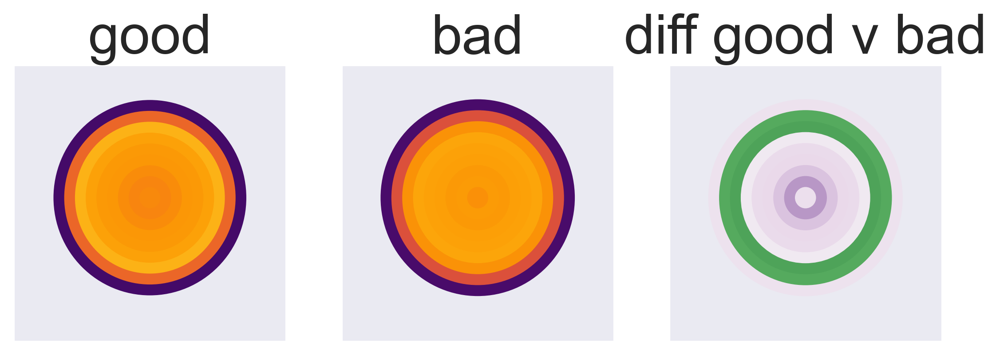

In [138]:
def make_radial_dist_patches_72(df,dist_keys,factorintensity = 0.3, factor_axes= 420):
    df = df.median()
    
    dist_vals = df[dist_keys].to_numpy()/factorintensity
    in_ax_length = df[['072h_str_BF_AreaShape_major_axis_length','072h_str_BF_AreaShape_major_axis_length']].to_numpy()/factor_axes
    inside_axis_concentric = [i*in_ax_length for i in np.flip(np.linspace(0.1,1,9,))]
    
    circles_bra = [Ellipse((0.5, 0.5+offset_height), width = rad[0], height = rad[1], color=cmap(val)) for val,rad in zip(np.flip(dist_vals),inside_axis_concentric)]
    
    return circles_bra

def make_radial_dist_difference_72(
    df,
    dist_keys,
    annotation,
    annotation_values,
    factorintensity = 0.3, 
    factor_axes= 420,
    cmap = "PRGn", 
    data_bounds = (-0.2,0,0.2),
    gt_keys= ["Run","Plate","ID","Axes","Morph","Morph_Class"],
):
    df_1 = df[df[annotation]==annotation_values[0]].drop(gt_keys,axis=1).median()
    df_2 = df[df[annotation]==annotation_values[1]].drop(gt_keys,axis=1).median()
                                
    df = df.drop(gt_keys,axis=1).median()
    cmap_now = colormaps[cmap]
    
    dist_vals = df_1[dist_keys].to_numpy()/factorintensity - df_2[dist_keys].to_numpy()/factorintensity
    
    in_ax_length = df[['072h_str_BF_AreaShape_major_axis_length','072h_str_BF_AreaShape_major_axis_length']].to_numpy()/factor_axes
    inside_axis_concentric = [i*in_ax_length for i in np.flip(np.linspace(0.1,1,9,))]
    
    circles_bra = [
        Ellipse((0.5, 0.5+offset_height), width = rad[0], height = rad[1], color=cmap_now(np.interp(val,data_bounds,(0,0.5,1)))) 
        for val,rad in zip(np.flip(dist_vals),inside_axis_concentric)
    ]
    
    return circles_bra

fig, axs = plt.subplots(1,3,figsize = (9,2.7))

for ax,subset in zip(axs,["good","bad","diff good v bad"]):
    if subset != "diff good v bad":
        ellipses = make_radial_dist_patches_72(
            master_df_72[master_df_72["Morph"]==subset].drop(gt_keys,axis=1),
            [key for key in master_df_72.keys() if "Radial" in key]
        )
    else:
        ellipses = make_radial_dist_difference_72(
            master_df_72,
            [key for key in master_df_72.keys() if "Radial" in key],
            factor_axes= 420,
            annotation= "Morph",
            annotation_values=["good","bad"],
            cmap = "PRGn", 
            data_bounds = (-0.1,0,0.1)
        )
    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)

out = f"{home_directory}/Plots/PLSR Feature Plots/"
plt.savefig(f"{out}72h Average Shape good bad and Diff.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


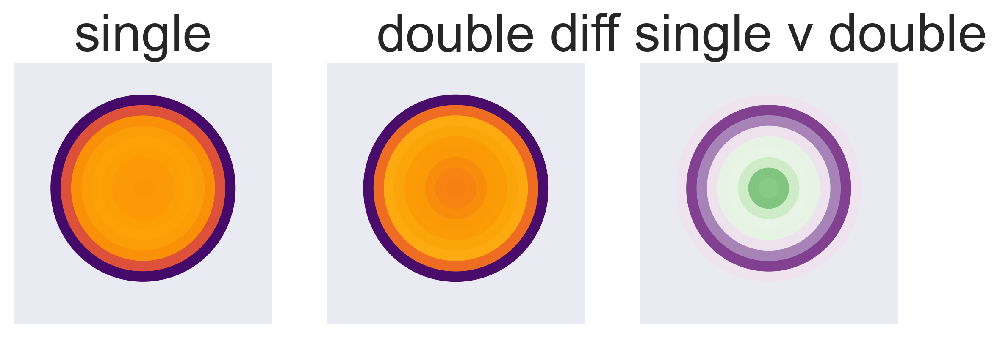

In [139]:
fig, axs = plt.subplots(1,3,figsize = (9,2.7))

for ax,subset in zip(axs,["single","double","diff single v double"]):
    if subset != "diff single v double":
        ellipses = make_radial_dist_patches_72(
            master_df_72[master_df_72["Axes"]==subset].drop(gt_keys,axis=1),
            [key for key in master_df_72.keys() if "Radial" in key]
        )
    else:
        ellipses = make_radial_dist_difference_72(
            master_df_72,
            [key for key in master_df_72.keys() if "Radial" in key],
            factor_axes= 420,
            annotation= "Axes",
            annotation_values= ["single","double"],
            cmap = "PRGn", 
            data_bounds = (-0.1,0,0.1)
        )
    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)

out = f"{home_directory}/Plots/PLSR Feature Plots/"
plt.savefig(f"{out}72h Average Shape single double and Diff.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


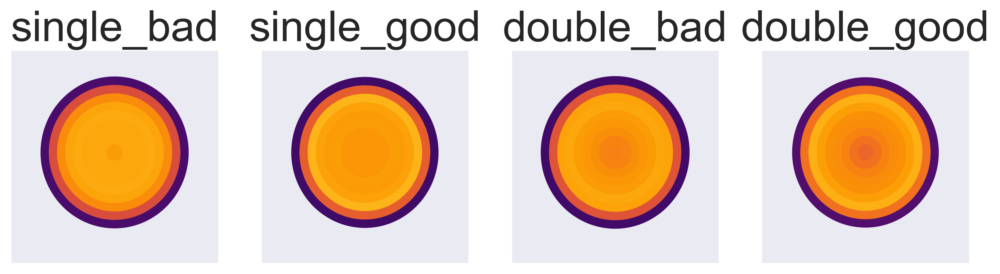

In [140]:
fig, axs = plt.subplots(1,4,figsize = (12,2.7))

for ax,subset in zip(axs,["single_bad","single_good","double_bad","double_good"]):
    ellipses = make_radial_dist_patches_72(
        master_df_72[master_df_72["Morph_Class"]==subset].drop(gt_keys,axis=1),
        [key for key in master_df_72.keys() if "Radial" in key]
    )

    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)

plt.savefig(f"{out}72h Average Shape Axes x Morph.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


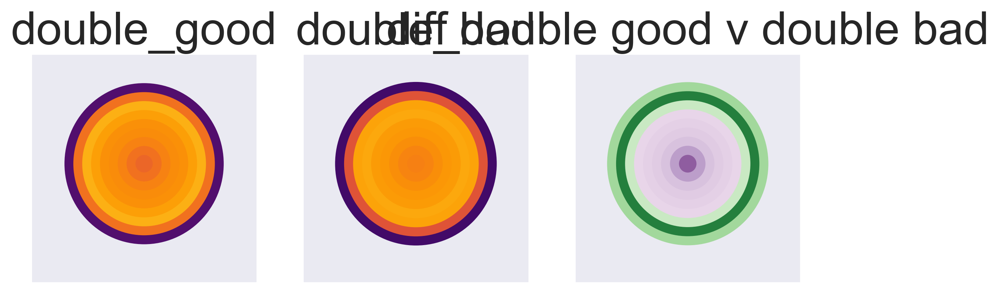

In [141]:
fig, axs = plt.subplots(1,3,figsize = (9,2.7))

for ax,subset in zip(axs,["double_good","double_bad","diff double good v double bad"]):
    if subset != "diff double good v double bad":
        ellipses = make_radial_dist_patches_72(
            master_df_72[master_df_72["Morph_Class"]==subset].drop(gt_keys,axis=1),
            [key for key in master_df_72.keys() if "Radial" in key]
        )
    else:
        ellipses = make_radial_dist_difference_72(
            master_df_72,
            [key for key in master_df_72.keys() if "Radial" in key],
            factorintensity = 0.3, 
            factor_axes= 420,
            annotation= "Morph_Class",
            annotation_values=["double_good","double_bad"],
            cmap = "PRGn", 
            data_bounds = (-0.1,0,0.1)
        )
    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)
    
plt.savefig(f"{out}72 Average Shape double good bad and Diff.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


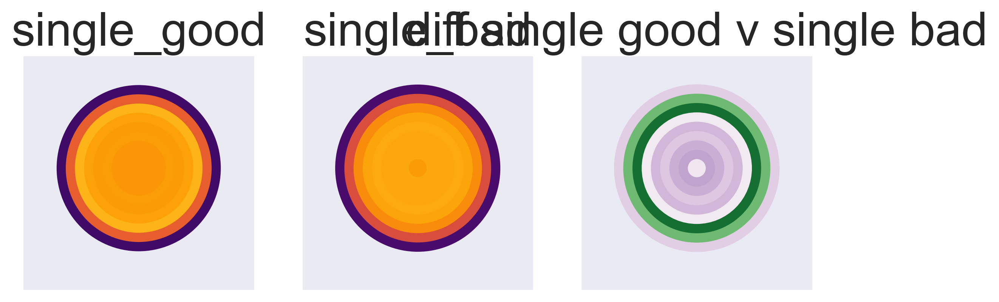

In [142]:

fig, axs = plt.subplots(1,3,figsize = (9,2.7))

for ax,subset in zip(axs,["single_good","single_bad","diff single good v single bad"]):
    if subset != "diff single good v single bad":
        ellipses = make_radial_dist_patches_72(
            master_df_72[master_df_72["Morph_Class"]==subset].drop(gt_keys,axis=1),
            [key for key in master_df_72.keys() if "Radial" in key]
        )
    else:
        ellipses = make_radial_dist_difference_72(
            master_df_72,
            [key for key in master_df_72.keys() if "Radial" in key],
            factorintensity = 0.3, 
            factor_axes= 420,
            annotation= "Morph_Class",
            annotation_values=["single_good","single_bad",],
            cmap = "PRGn", 
            data_bounds = (-0.1,0,0.1)
        )
    for circle in ellipses:
        ax.add_patch(circle)
        ax.set_xticks([])
        ax.set_yticks([])

    ax.set_title(subset)
    
plt.savefig(f"{out}72 Average Shape single good bad and Diff.pdf", format="pdf", bbox_inches="tight")

meta NOT subset; don't know how to subset; dropped


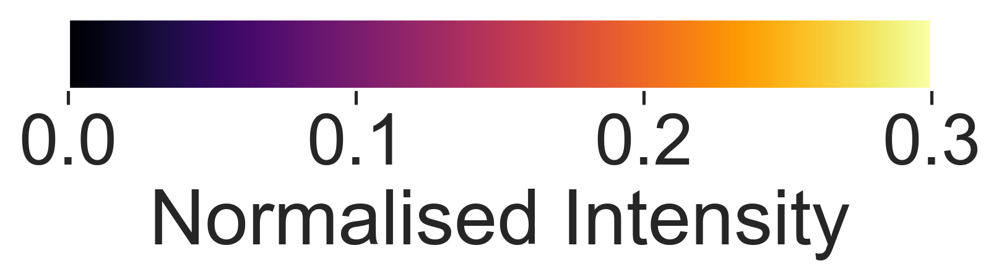

In [143]:
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

norm = mpl.colors.Normalize(vmin=0., vmax=0.3)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='horizontal')
cb1.set_label('Normalised Intensity')
fig.show()
plt.savefig(f"{out}intensity colorbar 72h.pdf", format="pdf", bbox_inches="tight")

# Looking at individual features

In [144]:
annotated_normalised = normalised_data.merge(no_na_annot,on=["Run","Plate","ID"])
annotated_normalised

,Run,Plate,ID,048h_raw_BF_AreaShape_area,048h_raw_BF_AreaShape_aspect_ratio,048h_raw_BF_AreaShape_axis_major_length,048h_raw_BF_AreaShape_axis_minor_length,048h_raw_BF_AreaShape_eccentricity,048h_raw_BF_AreaShape_feret_diameter_max,048h_raw_BF_AreaShape_perimeter,...,096h_str_BF_AreaShape_moments_hu_4,096h_str_BF_AreaShape_moments_hu_5,096h_str_BF_AreaShape_moments_hu_6,096h_str_BF_AreaShape_orientation,096h_str_BF_AreaShape_perimeter,096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation,096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation,Axes,Morph,Morph_Class
0,RR,1,A1,0.754091,-0.889636,0.132588,1.204628,-1.000051,0.007074,0.615519,...,-0.081040,-0.108285,-0.018937,0.218694,0.485603,-0.237483,0.204173,single,good,single_good
1,RR,1,A2,-0.783470,-1.252670,-1.238409,0.003129,-1.752936,-1.131530,-0.724230,...,-0.080919,-0.108023,0.017986,-1.310831,-0.276812,-0.930821,1.071650,single,bad,single_bad
2,RR,1,A3,1.636441,-0.184192,1.186196,1.565451,-0.008740,1.127225,1.795347,...,-0.081045,-0.108504,-0.019001,-0.638784,0.014028,0.406917,-0.068697,single,bad,single_bad
3,RR,1,A4,-0.525754,-0.513477,-0.672134,-0.202863,-0.422446,-0.849309,-0.402853,...,-0.073034,-0.013521,0.038021,0.362758,0.652506,0.992505,-0.551399,single,good,single_good
4,RR,1,A5,0.537872,-0.248943,0.294790,0.612413,-0.084969,0.059492,0.498737,...,-0.081127,-0.113141,-0.013480,-0.324894,-1.090064,0.285818,-0.643907,single,bad,single_bad
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
433,TR,2,H8,-0.342295,-0.103644,-0.319022,-0.266071,0.083062,-0.511010,-0.233997,...,-0.076766,-0.095753,0.232280,-0.531978,0.936472,-1.056426,0.770934,unclassified,unclassified,unclassified_unclassified
434,TR,2,H9,-0.925432,1.281638,-0.116354,-1.536867,1.304509,-0.330223,-1.009869,...,-0.084586,-0.137911,0.247706,0.371618,1.965908,0.143556,0.712064,single,good,single_good
435,TR,2,H10,-1.873304,-1.279234,-2.131125,-1.049808,-1.821515,-2.016265,-1.929328,...,-0.082320,-0.115499,0.052699,0.177291,1.923294,-1.128242,-0.816051,double,unclassified,double_unclassified
436,TR,2,H11,-2.408392,-0.915375,-2.411391,-1.803167,-1.045366,-2.414625,-2.306480,...,-0.101456,-0.309307,0.338411,-0.341009,1.652660,-0.982778,1.840169,single,good,single_good


<Axes: xlabel='hour', ylabel='raw_CH__bf_mask_Intensity_MeanIntensity'>

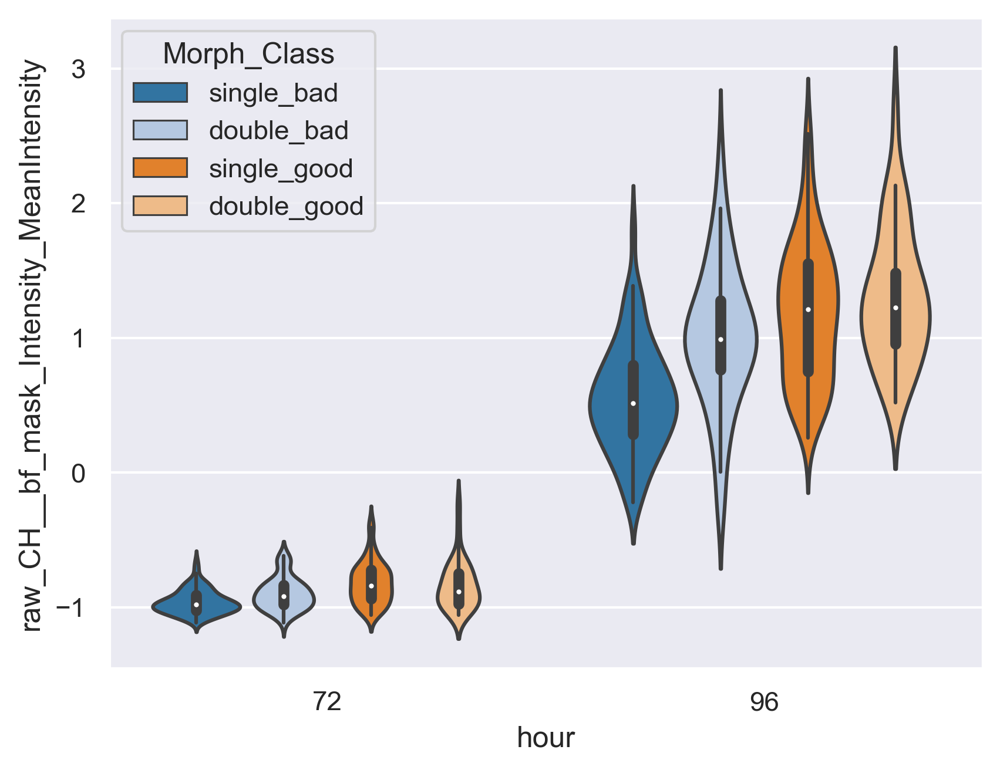

In [145]:
sns.set()
time_series_data = pd.read_csv(f"{table_location}/All_Samples_Feature_Space_All_Features_48h,72h,96h_Normalised_across_Timepoints.csv").merge(no_na_annot,on=["Run","Plate","ID"])

data = time_series_data[time_series_data["Morph_Class"]!="unclassified"][["raw_CH__bf_mask_Intensity_MeanIntensity","hour"]+gt_keys].dropna()
sns.violinplot(data = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")],y = "raw_CH__bf_mask_Intensity_MeanIntensity",x="hour",hue = "Morph_Class", palette="tab20",hue_order=["single_bad","double_bad","single_good","double_good"])

<Axes: xlabel='Morph_Class', ylabel='096h_raw_CH__bf_mask_Intensity_MeanIntensity'>

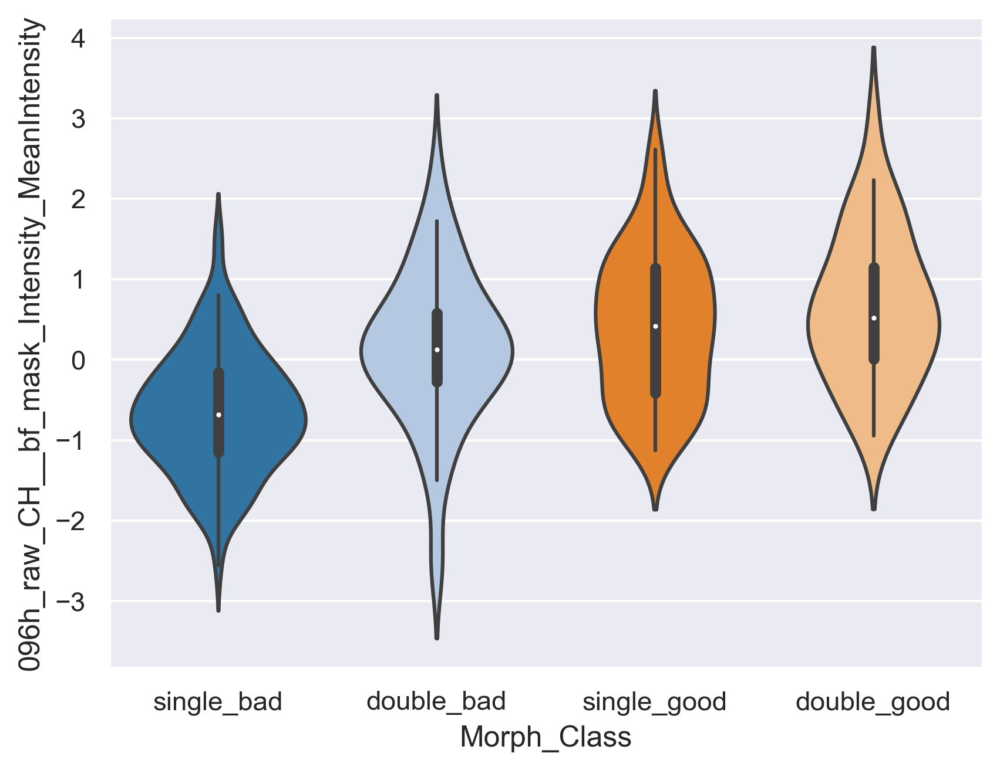

In [146]:
data = annotated_normalised
sns.violinplot(data = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")],y = "096h_raw_CH__bf_mask_Intensity_MeanIntensity",x="Morph_Class", palette="tab20",order=["single_bad","double_bad","single_good","double_good"])

<Axes: xlabel='Morph_Class', ylabel='096h_raw_CH_bra_mask_Intensity_MeanIntensity'>

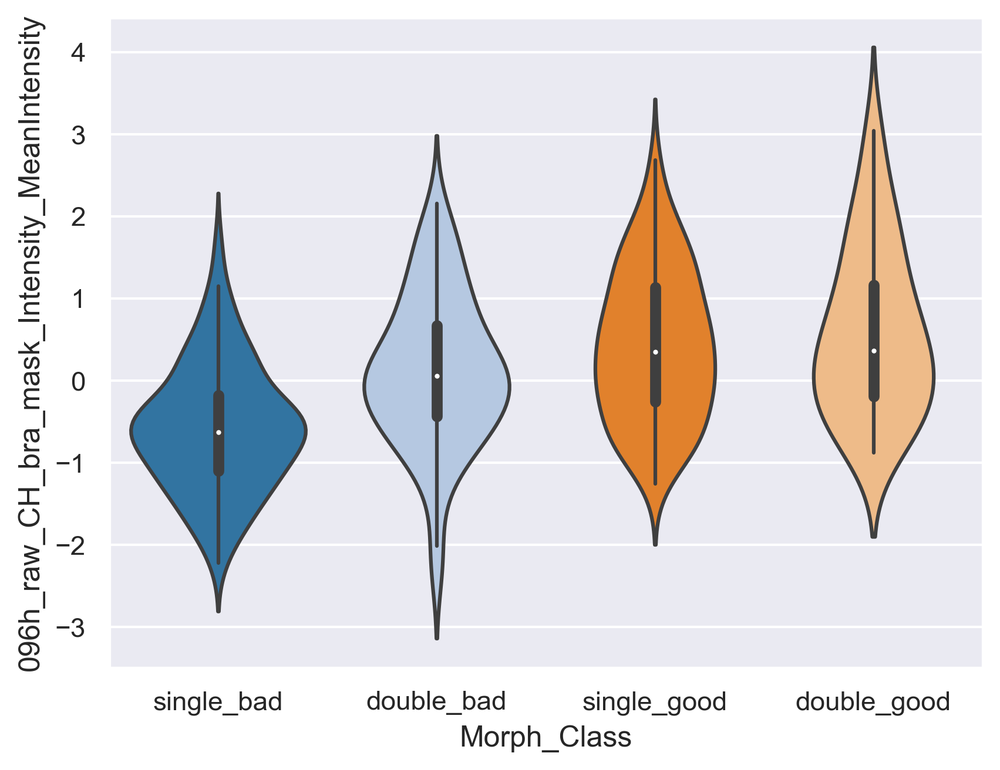

In [147]:
data = annotated_normalised
sns.violinplot(data = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")],y = "096h_raw_CH_bra_mask_Intensity_MeanIntensity",x="Morph_Class", palette="tab20",order=["single_bad","double_bad","single_good","double_good"])

<Axes: xlabel='Morph_Class', ylabel='072h_raw_CH__bf_mask_Intensity_MeanIntensity'>

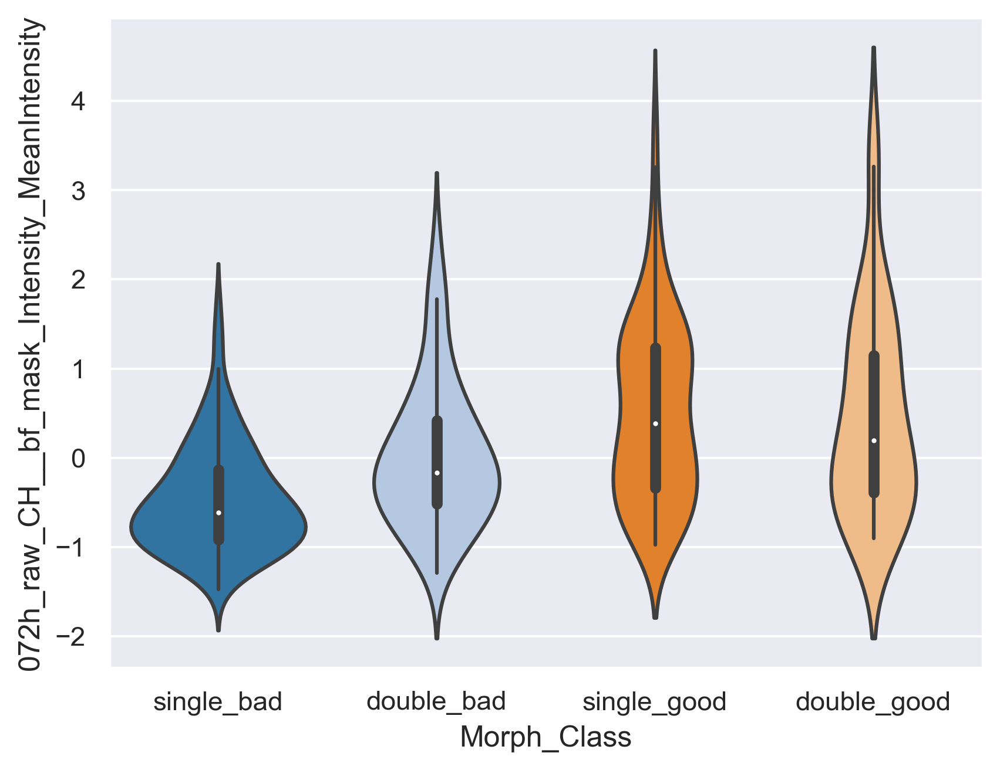

In [148]:
data = annotated_normalised
sns.violinplot(data = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")],y = "072h_raw_CH__bf_mask_Intensity_MeanIntensity",x="Morph_Class", palette="tab20",order=["single_bad","double_bad","single_good","double_good"])

<Axes: xlabel='Morph_Class', ylabel='096h_str_BF_AreaShape_aspect_ratio'>

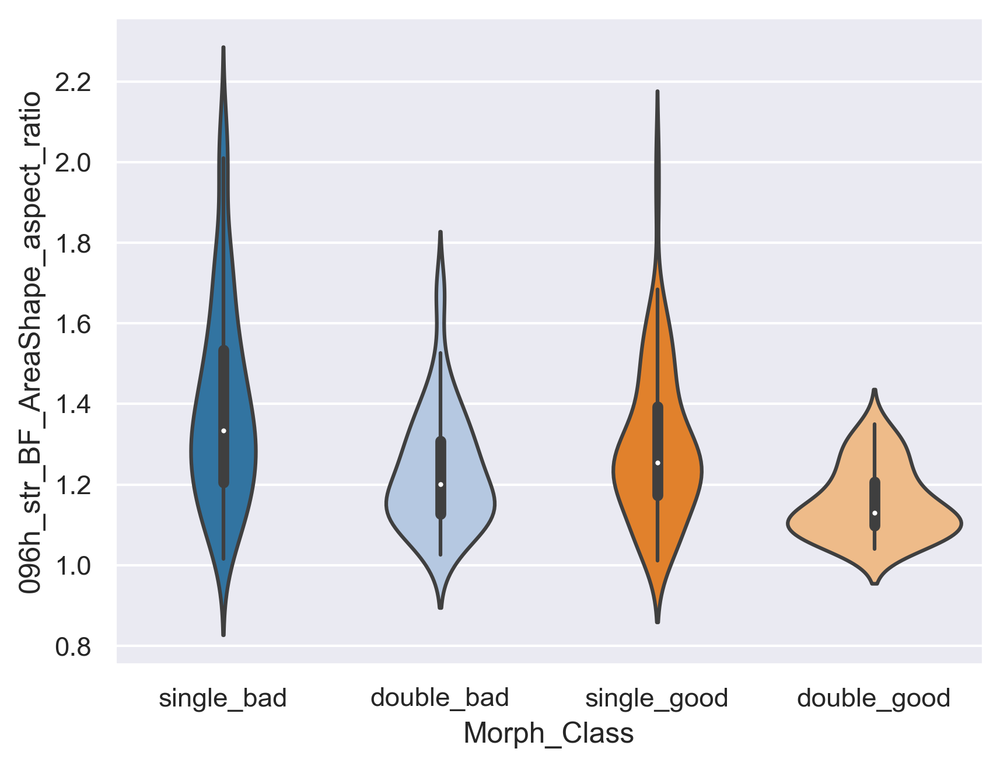

In [149]:
data = raw_data.merge(no_na_annot,on=["Run","Plate","ID"])
sns.violinplot(data = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")],y = "096h_str_BF_AreaShape_aspect_ratio",x="Morph_Class", palette="tab20",order=["single_bad","double_bad","single_good","double_good"])

<Axes: xlabel='Morph_Class', ylabel='096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation'>

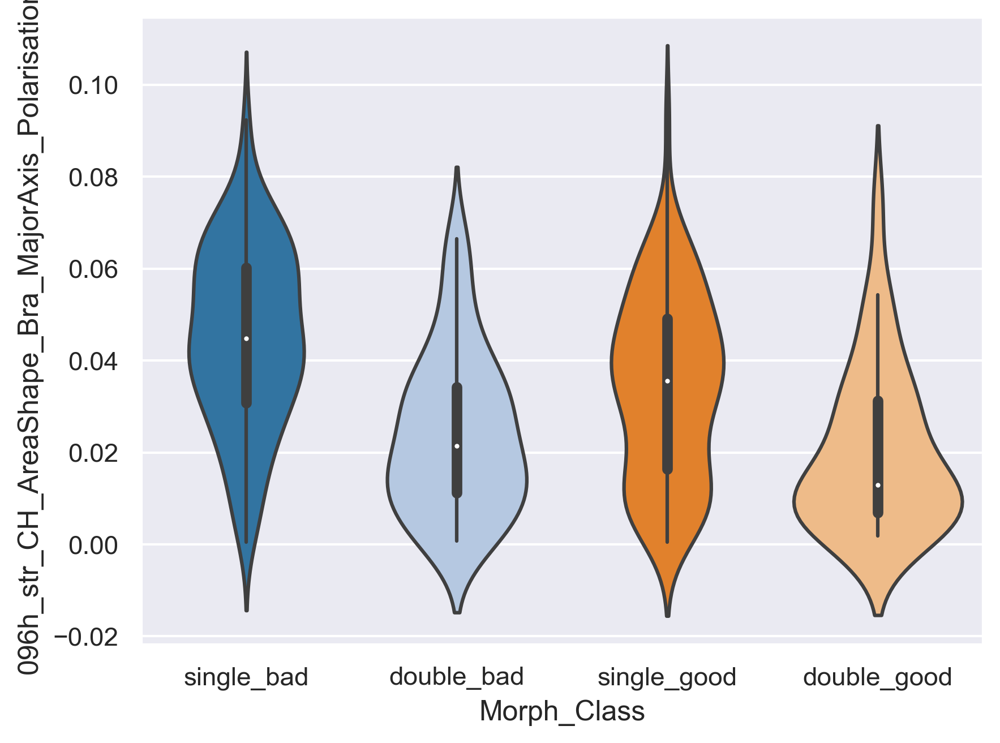

In [150]:
data = raw_data.merge(no_na_annot,on=["Run","Plate","ID"])
sns.violinplot(data = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")],y = '096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation',x="Morph_Class", palette="tab20",order=["single_bad","double_bad","single_good","double_good"])

<Axes: xlabel='Morph_Class', ylabel='096h_raw_CH_AreaShape_Bra_AreaFraction'>

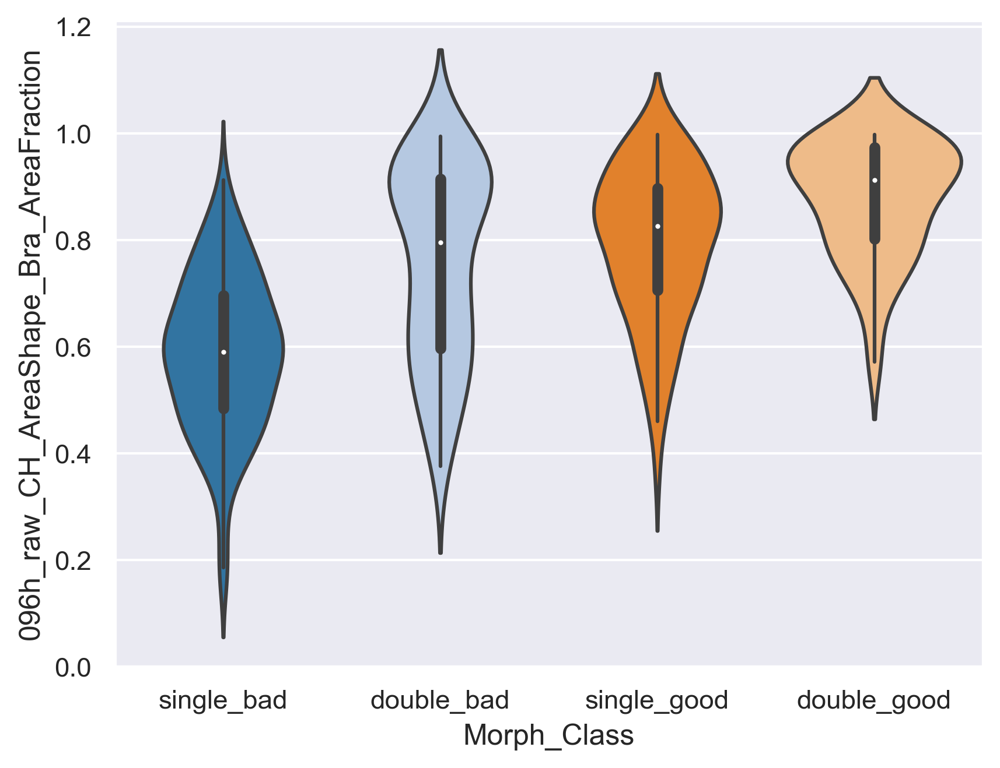

In [151]:
data = raw_data.merge(no_na_annot,on=["Run","Plate","ID"])
sns.violinplot(data = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")],y = '096h_raw_CH_AreaShape_Bra_AreaFraction',x="Morph_Class", palette="tab20",order=["single_bad","double_bad","single_good","double_good"])

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 096h_raw_CH_AreaShape_Bra_AreaFraction, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:5.114e-11
double_bad vs. single_good: Custom statistical test, P_val:5.140e-01
single_good vs. double_good: Custom statistical test, P_val:2.017e-02
single_bad vs. single_good: Custom statistical test, P_val:8.049e-14
double_bad vs. double_good: Custom statistical test, P_val:1.270e-03
single_bad vs. double_good: Custom statistical test, P_val:8.049e-14


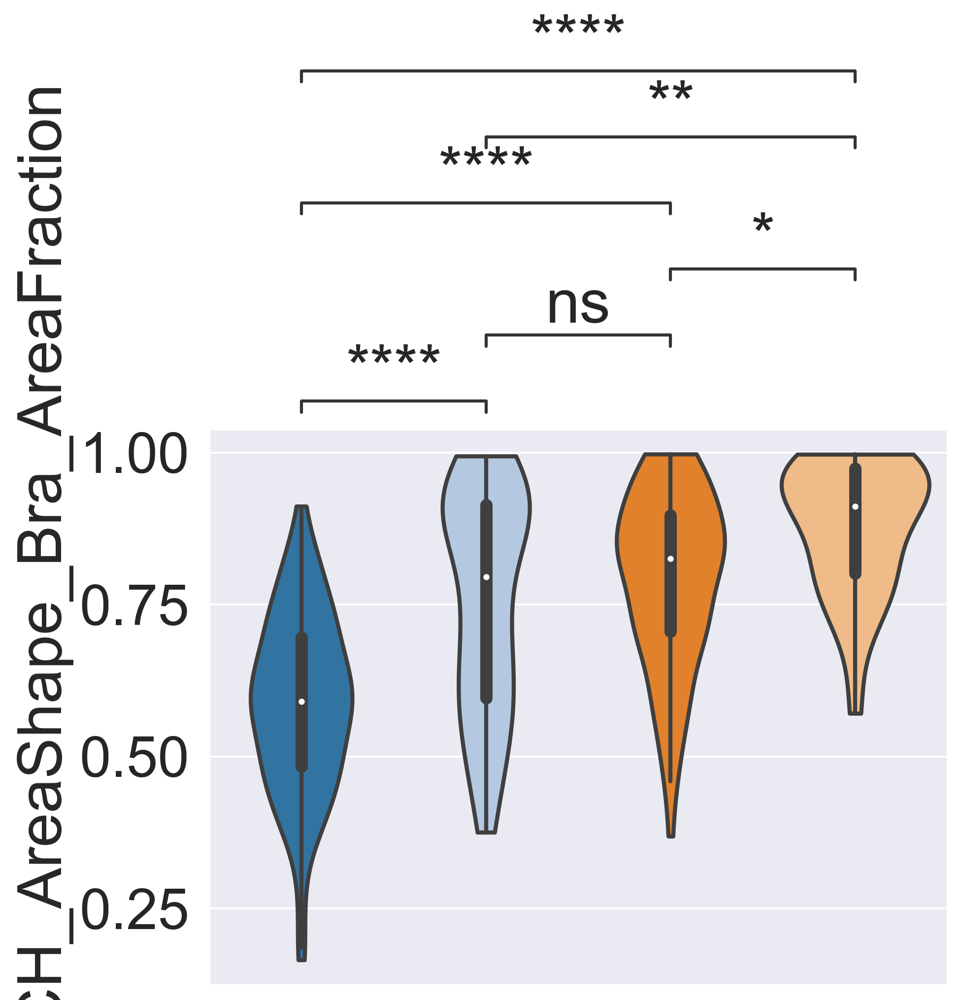

In [152]:
from itertools import combinations
from statannotations.Annotator import Annotator
from scipy.stats import tukey_hsd

data = raw_data.merge(no_na_annot,on=["Run","Plate","ID"])

annotations = ["single_bad","double_bad","single_good","double_good"]
pairs = list(combinations(annotations, r=2))
pairs_indices = list(combinations(range(len(annotations)),r=2))

hue = "Morph_Class"

feature = '096h_raw_CH_AreaShape_Bra_AreaFraction'
df = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")]

counts = df.groupby(hue)[feature].count()
print(counts)

sns.set(font_scale=2.5)
fig,ax = plt.subplots(figsize = (7,10))
g = sns.violinplot(
    data = df,
    y = feature,
    x=hue, 
    palette="tab20",
    order=annotations,
    linewidth=2,
    cut=0,
    ax=ax,
    #kind="violin",
)

values_by_hue = [df.groupby(by=hue)[feature].get_group(group) for group in annotations]
p_vals = tukey_hsd(*values_by_hue).pvalue
tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices]

annotator = Annotator(ax, pairs, data=df, x=hue, y=feature, order=annotations)
annotator.configure(loc="outside",text_offset = 0)
annotator.set_pvalues(tukey_p_vals)
annotator.annotate()

ax.set_xlabel("")
ax.set_xticks([])
plt.tight_layout()



In [153]:
pairs_indices = list(combinations(range(len(annotations)),r=2))
pairs_indices

[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]

In [154]:
tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices]
tukey_p_vals

[5.113942602719135e-11,
 8.049116928532385e-14,
 8.049116928532385e-14,
 0.5140102003231952,
 0.001270026023371007,
 0.020174409677489735]

In [155]:
mapping_df = pd.read_csv("translation_dataframe_timepoints.csv")
mapping_names = {k:v for k,v in mapping_df[["original_names","plot_names"]].to_numpy()}

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 096h-[Mean Intensity]-TmCH(BF), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:1.649e-07
double_bad vs. single_good: Custom statistical test, P_val:2.260e-01
single_good vs. double_good: Custom statistical test, P_val:5.003e-01
single_bad vs. single_good: Custom statistical test, P_val:8.049e-14
double_bad vs. double_good: Custom statistical test, P_val:3.051e-02
single_bad vs. double_good: Custom statistical test, P_val:3.931e-13


meta NOT subset; don't know how to subset; dropped


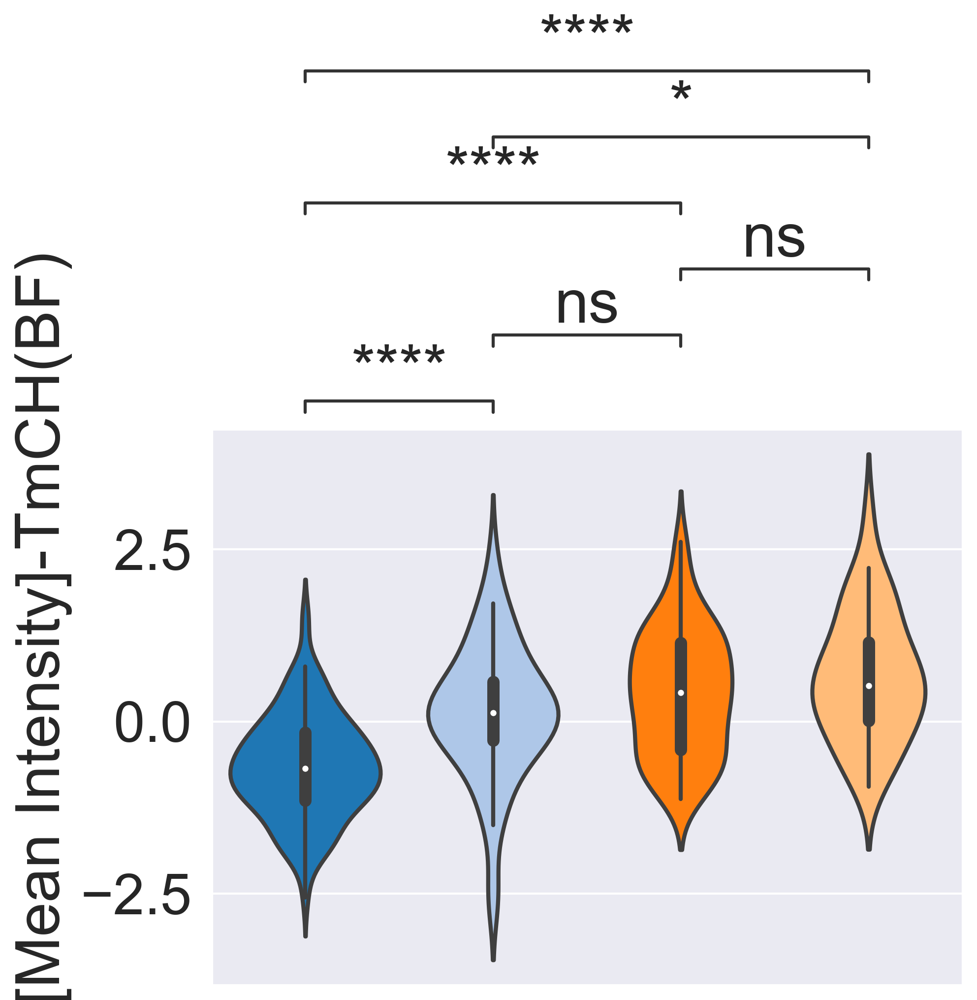

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 096h-[Mean Intensity]-TmCH(mCH), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:9.753e-06
double_bad vs. single_good: Custom statistical test, P_val:1.478e-01
single_good vs. double_good: Custom statistical test, P_val:7.911e-01
single_bad vs. single_good: Custom statistical test, P_val:8.615e-14
double_bad vs. double_good: Custom statistical test, P_val:6.224e-02
single_bad vs. double_good: Custom statistical test, P_val:1.686e-10


meta NOT subset; don't know how to subset; dropped


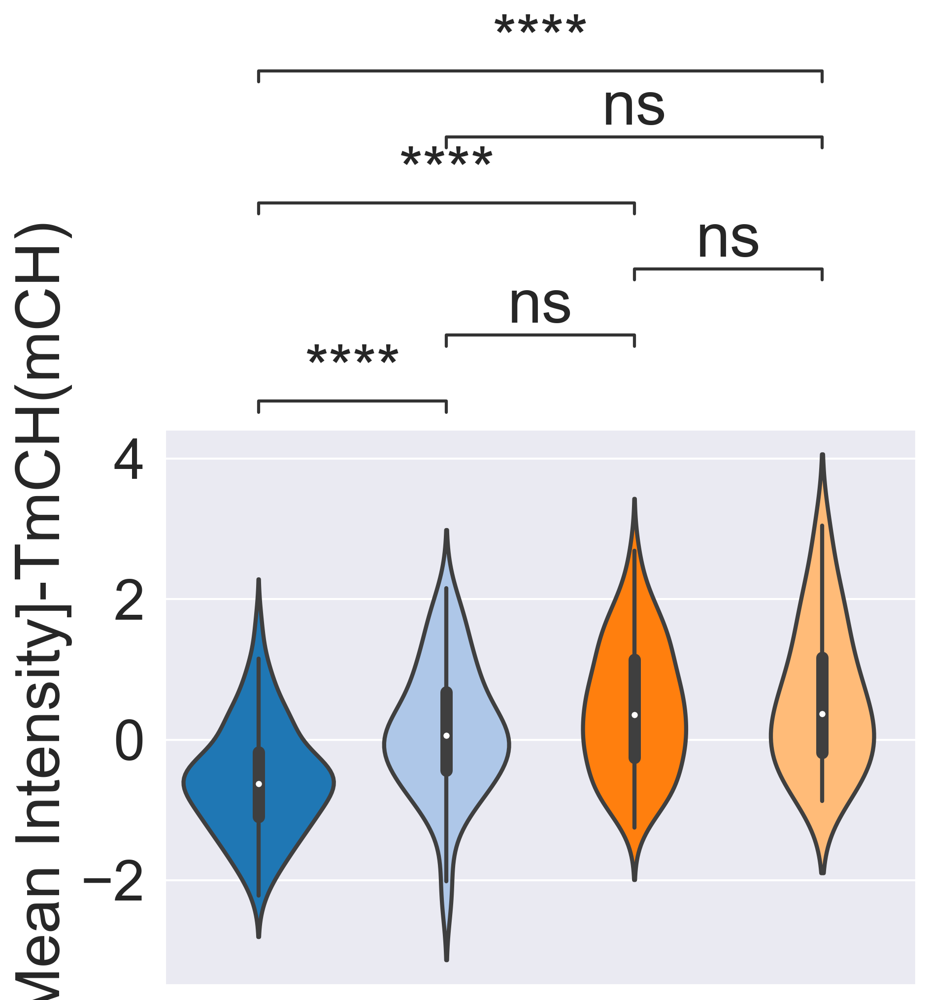

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 072h-[Mean Intensity]-TmCH(BF), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:1.910e-03
double_bad vs. single_good: Custom statistical test, P_val:4.794e-03
single_good vs. double_good: Custom statistical test, P_val:9.938e-01
single_bad vs. single_good: Custom statistical test, P_val:8.482e-14
double_bad vs. double_good: Custom statistical test, P_val:8.456e-02
single_bad vs. double_good: Custom statistical test, P_val:1.574e-07


meta NOT subset; don't know how to subset; dropped


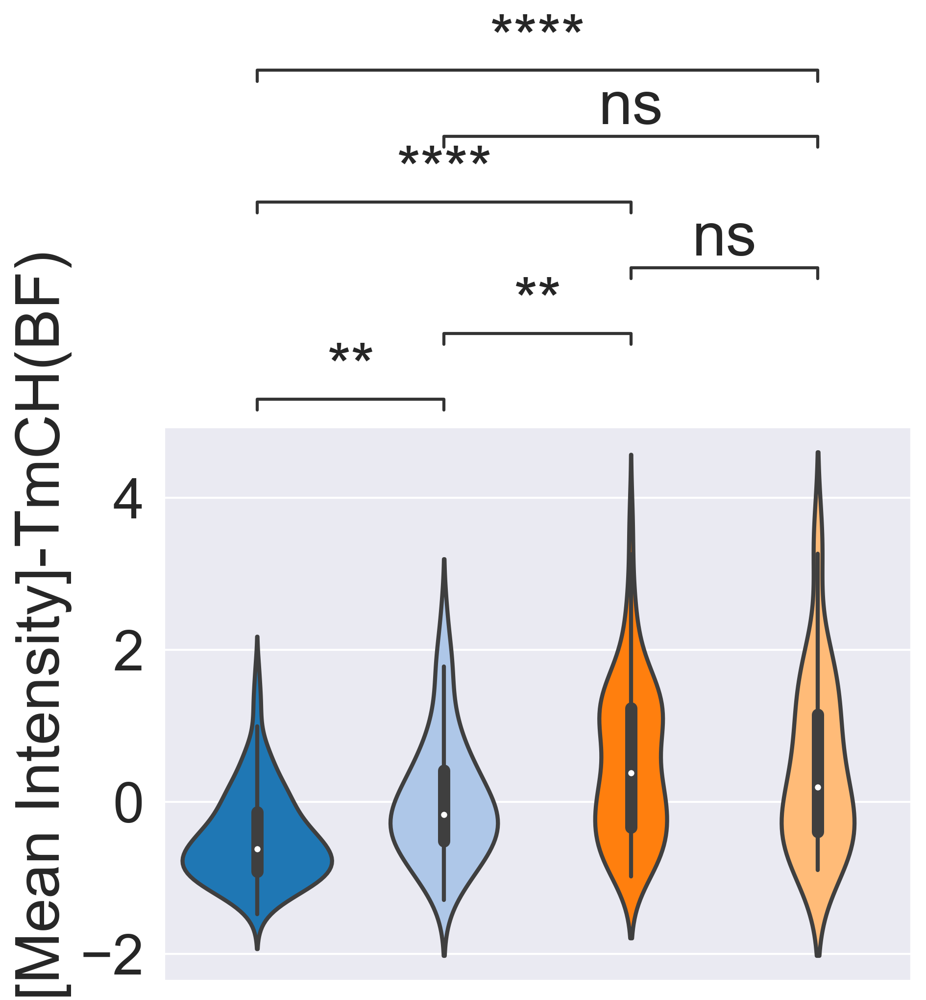

In [156]:
data_filt = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")]
features_norm = [
    "096h_raw_CH__bf_mask_Intensity_MeanIntensity",
    "096h_raw_CH_bra_mask_Intensity_MeanIntensity",
    "072h_raw_CH__bf_mask_Intensity_MeanIntensity",
]

features_raw = [
    "072h_raw_BF_AreaShape_area",
    '096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation',
    "096h_str_BF_AreaShape_aspect_ratio",
    "096h_str_BF_AreaShape_minor_axis_length",
    "096h_str_BF_AreaShape_major_axis_length",
    '096h_raw_CH_AreaShape_Bra_AreaFraction',
    '096h_raw_CH_bra_mask_AreaShape_Area',
]

data_renamed = annotated_normalised[(annotated_normalised["Morph"]!="unclassified")&(annotated_normalised["Axes"]!="unclassified")].rename(columns=mapping_names)

for feat in features_norm:
    feature = mapping_names[feat]
    sns.set(font_scale=2.5)
    fig,ax = plt.subplots(figsize = (7,10))
    counts = data_renamed.groupby(hue)[feature].count()
    print(counts)
    g = sns.violinplot(
        data = data_renamed,
        saturation=1,
        y = feature,
        x=hue, 
        palette="tab20",
        order=annotations,
        linewidth=2,
        #cut=0,
        ax=ax,
        #kind="violin",
    )
    ax.set_xlabel("")
    ax.set_xticks([])
    
    values_by_hue = [data_renamed.groupby(by=hue)[feature].get_group(group) for group in annotations]
    p_vals = tukey_hsd(*values_by_hue).pvalue
    tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices]

    annotator = Annotator(ax, pairs, data=data_renamed, x=hue, y=feature, order=annotations)
    annotator.configure(loc="outside",text_offset = 0)
    annotator.set_pvalues(tukey_p_vals)
    annotator.annotate()
    
    plt.tight_layout()
    plt.savefig(f"{out}/Feature Plots Morph Class{feature}.pdf", format="pdf", bbox_inches="tight")
    plt.show()

Morph
bad     183
good    129
Name: 096h-[Mean Intensity]-TmCH(BF), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


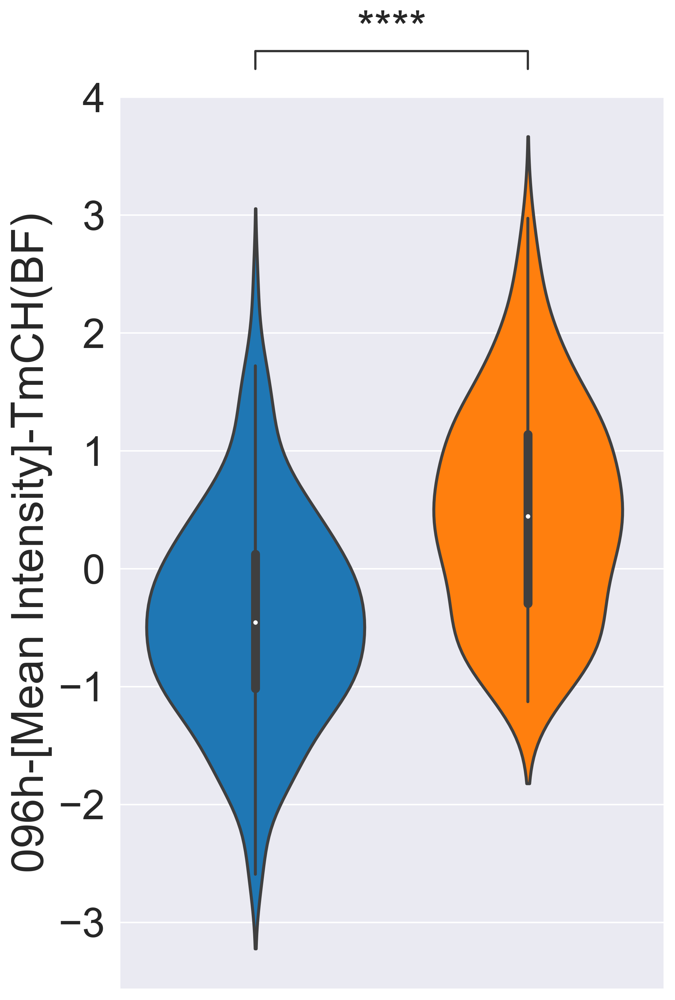

Morph
bad     183
good    129
Name: 096h-[Mean Intensity]-TmCH(mCH), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


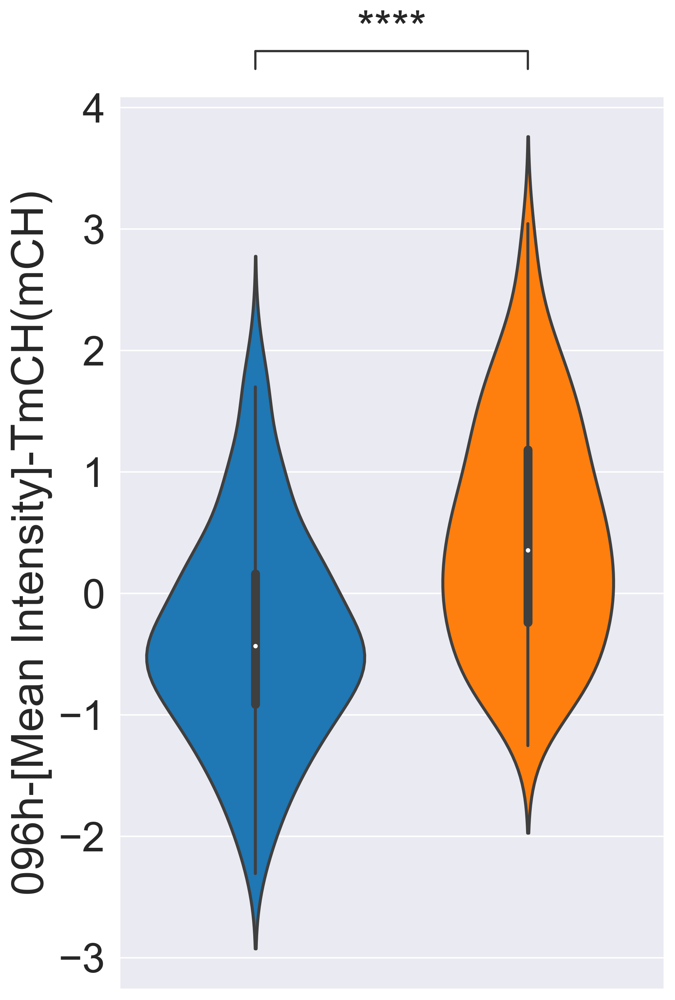

Morph
bad     183
good    129
Name: 072h-[Mean Intensity]-TmCH(BF), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


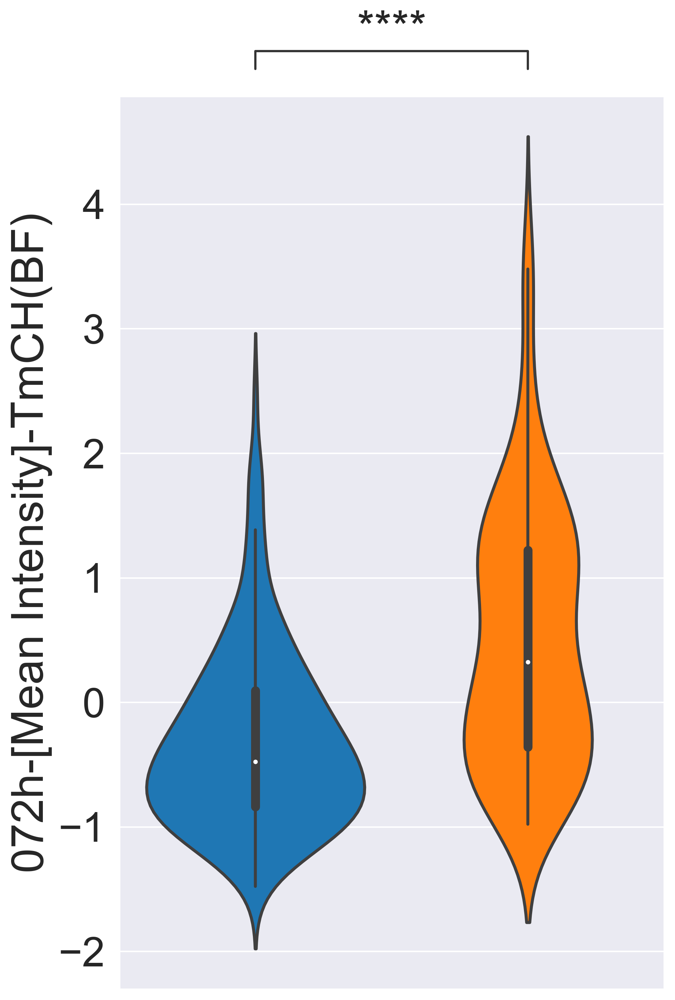

In [157]:
data_renamed_morph = annotated_normalised[annotated_normalised["Morph"]!="unclassified"].rename(columns=mapping_names)
annotations_morph = ["bad","good"]
pairs_morph = list(combinations(annotations_morph, r=2))
pairs_indices_morph = list(combinations(range(len(annotations_morph)),r=2))
hue_2="Morph"
for feat in features_norm:
    feature = mapping_names[feat]
    sns.set(font_scale=2.5)
    fig,ax = plt.subplots(figsize = (7,10))
    counts = data_renamed_morph.groupby(hue_2)[feature].count()
    print(counts)
    g = sns.violinplot(
        data = data_renamed_morph,
        saturation=1,
        y = feature,
        x=hue_2, 
        palette="tab10",
        order=annotations_morph,
        linewidth=2,
        #cut=0,
        ax=ax,
        #kind="violin",
    )
    ax.set_xlabel("")
    ax.set_xticks([])
    
    values_by_hue = [data_renamed_morph.groupby(by=hue_2)[feature].get_group(group) for group in annotations_morph]
    p_vals = tukey_hsd(*values_by_hue).pvalue
    tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices_morph]

    annotator = Annotator(ax, pairs_morph, data=data_renamed_morph, x=hue_2, y=feature, order=annotations_morph)
    annotator.configure(loc="outside",text_offset = 0)
    annotator.set_pvalues(tukey_p_vals)
    annotator.annotate()
    
    plt.tight_layout()
    plt.savefig(f"{out}/Feature Plots Morph {feature}.pdf", format="pdf", bbox_inches="tight")
    plt.show()

Axes
double    136
single    257
Name: 096h-[Mean Intensity]-TmCH(BF), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:2.185e-08


meta NOT subset; don't know how to subset; dropped


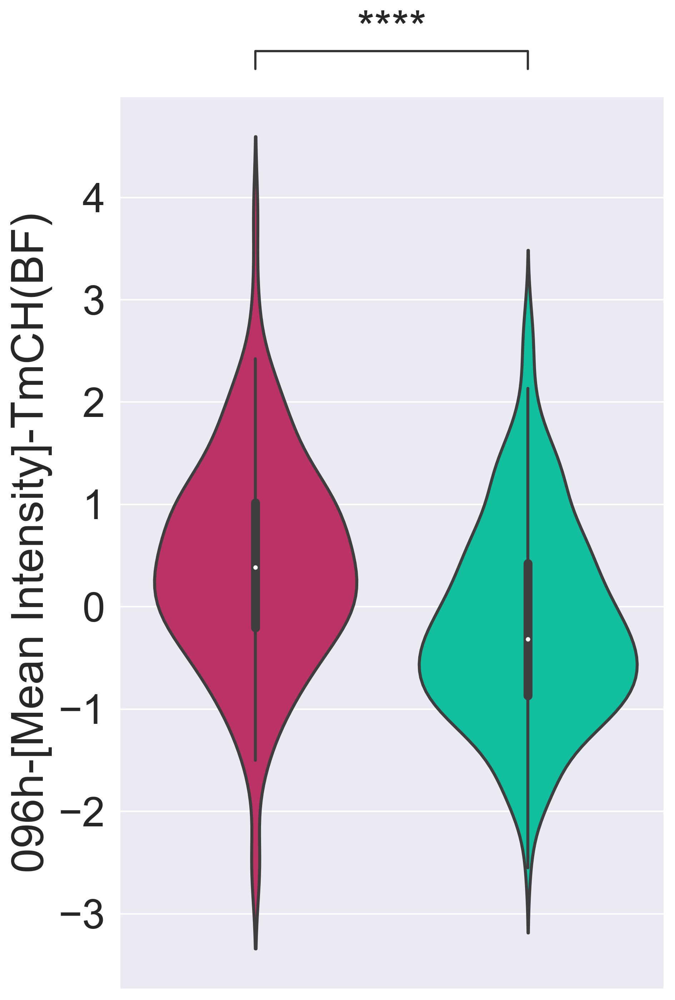

Axes
double    136
single    257
Name: 096h-[Mean Intensity]-TmCH(mCH), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:3.932e-06


meta NOT subset; don't know how to subset; dropped


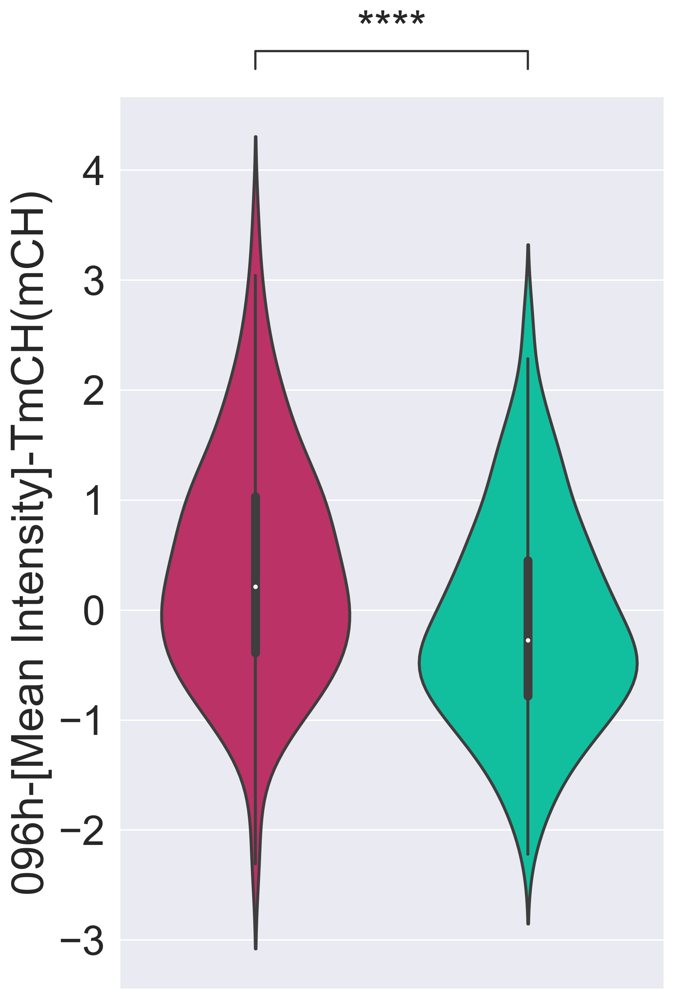

Axes
double    136
single    257
Name: 072h-[Mean Intensity]-TmCH(BF), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:1.252e-02


meta NOT subset; don't know how to subset; dropped


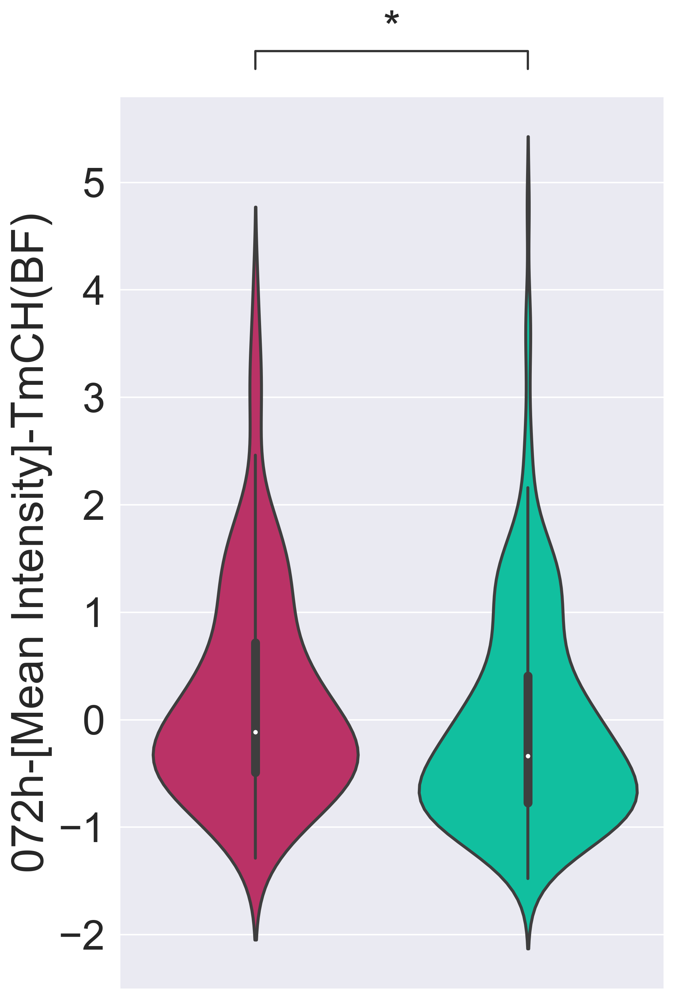

In [165]:
hue_2="Axes"

from matplotlib.colors import ListedColormap
cmap_hex = np.load("custom_colormap(blur,orange,red,ice).npy")
cmap = sns.palettes.color_palette(cmap_hex[2:])

data_renamed_morph = annotated_normalised[annotated_normalised[hue_2]!="unclassified"].rename(columns=mapping_names)
annotations_morph = ["double","single"]
pairs_morph = list(combinations(annotations_morph, r=2))
pairs_indices_morph = list(combinations(range(len(annotations_morph)),r=2))

for feat in features_norm:
    feature = mapping_names[feat]
    sns.set(font_scale=2.5)
    fig,ax = plt.subplots(figsize = (7,10))
    counts = data_renamed_morph.groupby(hue_2)[feature].count()
    print(counts)
    g = sns.violinplot(
        data = data_renamed_morph,
        saturation=1,
        y = feature,
        x=hue_2, 
        palette=cmap,
        order=annotations_morph,
        linewidth=2,
        #cut=0,
        ax=ax,
        #kind="violin",
    )
    ax.set_xlabel("")
    ax.set_xticks([])
    
    values_by_hue = [data_renamed_morph.groupby(by=hue_2)[feature].get_group(group) for group in annotations_morph]
    p_vals = tukey_hsd(*values_by_hue).pvalue
    tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices_morph]

    annotator = Annotator(ax, pairs_morph, data=data_renamed_morph, x=hue_2, y=feature, order=annotations_morph)
    annotator.configure(loc="outside",text_offset = 0)
    annotator.set_pvalues(tukey_p_vals)
    annotator.annotate()
    
    plt.tight_layout()
    plt.savefig(f"{out}/Feature Plots Axes {feature}.pdf", format="pdf", bbox_inches="tight")
    plt.show()

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 072h-[Area]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:9.596e-01
double_bad vs. single_good: Custom statistical test, P_val:2.470e-01
single_good vs. double_good: Custom statistical test, P_val:7.428e-01
single_bad vs. single_good: Custom statistical test, P_val:3.066e-01
double_bad vs. double_good: Custom statistical test, P_val:9.545e-01
single_bad vs. double_good: Custom statistical test, P_val:9.982e-01


meta NOT subset; don't know how to subset; dropped


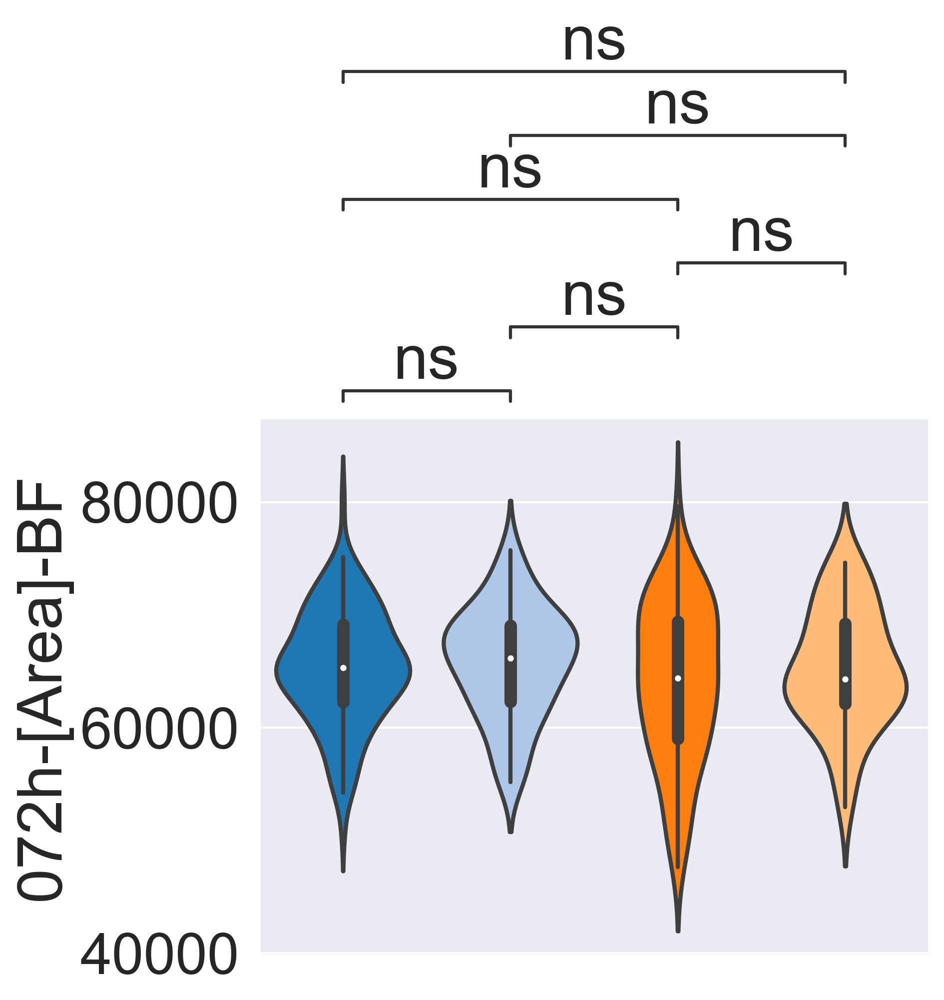

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 096h-[str Major Axis Polarisation]-TmCH, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:2.598e-10
double_bad vs. single_good: Custom statistical test, P_val:8.807e-03
single_good vs. double_good: Custom statistical test, P_val:1.549e-03
single_bad vs. single_good: Custom statistical test, P_val:2.372e-04
double_bad vs. double_good: Custom statistical test, P_val:8.026e-01
single_bad vs. double_good: Custom statistical test, P_val:4.780e-10


meta NOT subset; don't know how to subset; dropped


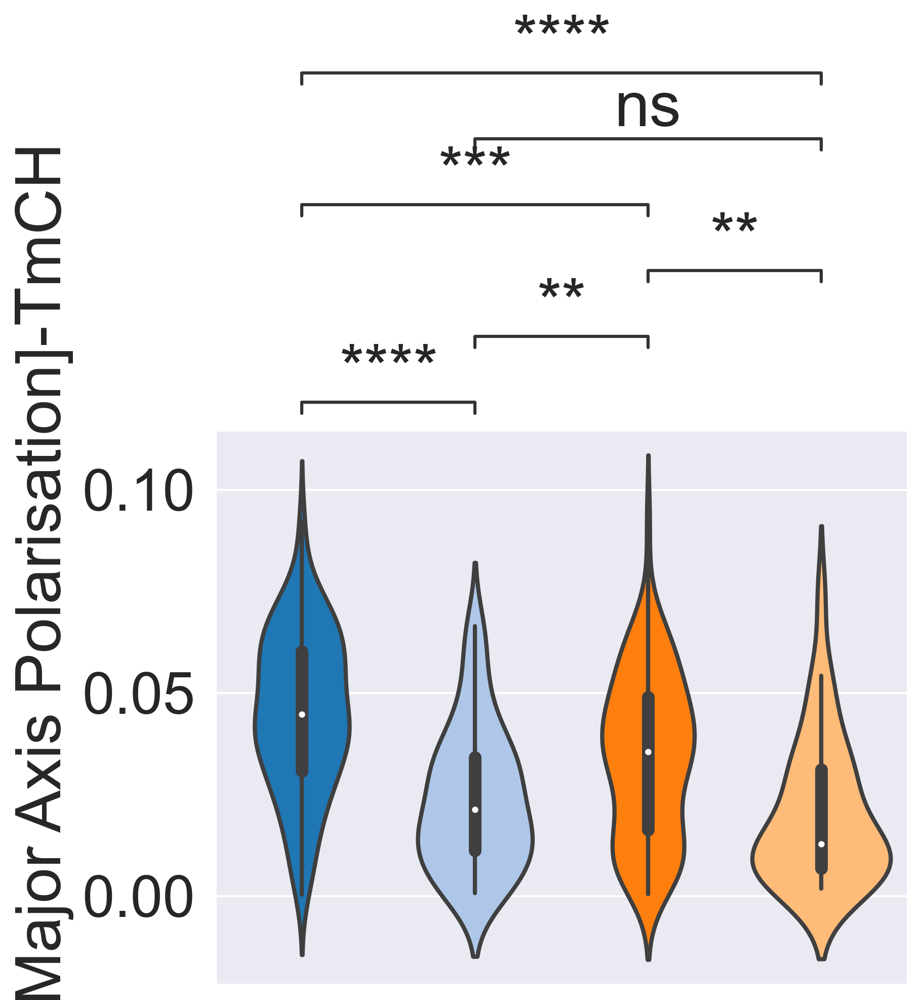

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 096h-[str Aspect Ratio]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:5.890e-06
double_bad vs. single_good: Custom statistical test, P_val:2.702e-01
single_good vs. double_good: Custom statistical test, P_val:3.127e-03
single_bad vs. single_good: Custom statistical test, P_val:1.558e-03
double_bad vs. double_good: Custom statistical test, P_val:2.812e-01
single_bad vs. double_good: Custom statistical test, P_val:1.116e-08


meta NOT subset; don't know how to subset; dropped


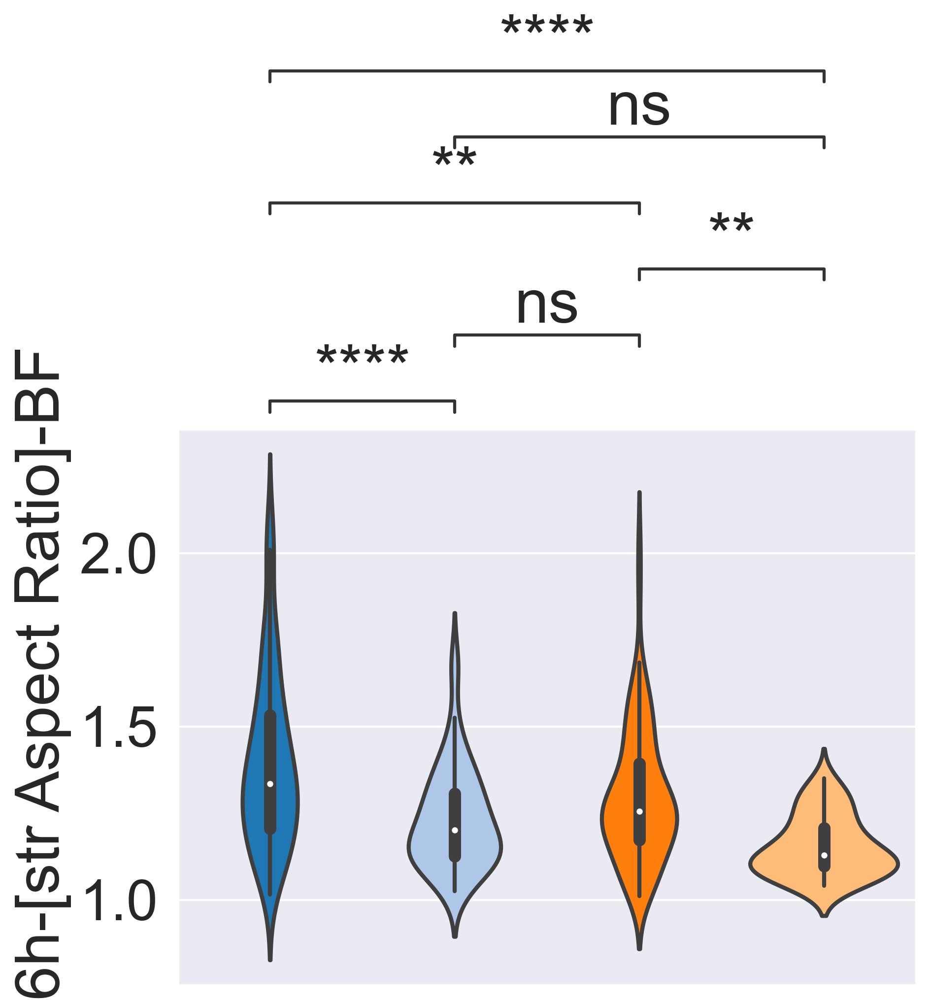

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 096h-[str Minor Axis Length]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:1.157e-08
double_bad vs. single_good: Custom statistical test, P_val:7.171e-01
single_good vs. double_good: Custom statistical test, P_val:2.302e-05
single_bad vs. single_good: Custom statistical test, P_val:2.540e-08
double_bad vs. double_good: Custom statistical test, P_val:3.113e-03
single_bad vs. double_good: Custom statistical test, P_val:8.049e-14


meta NOT subset; don't know how to subset; dropped


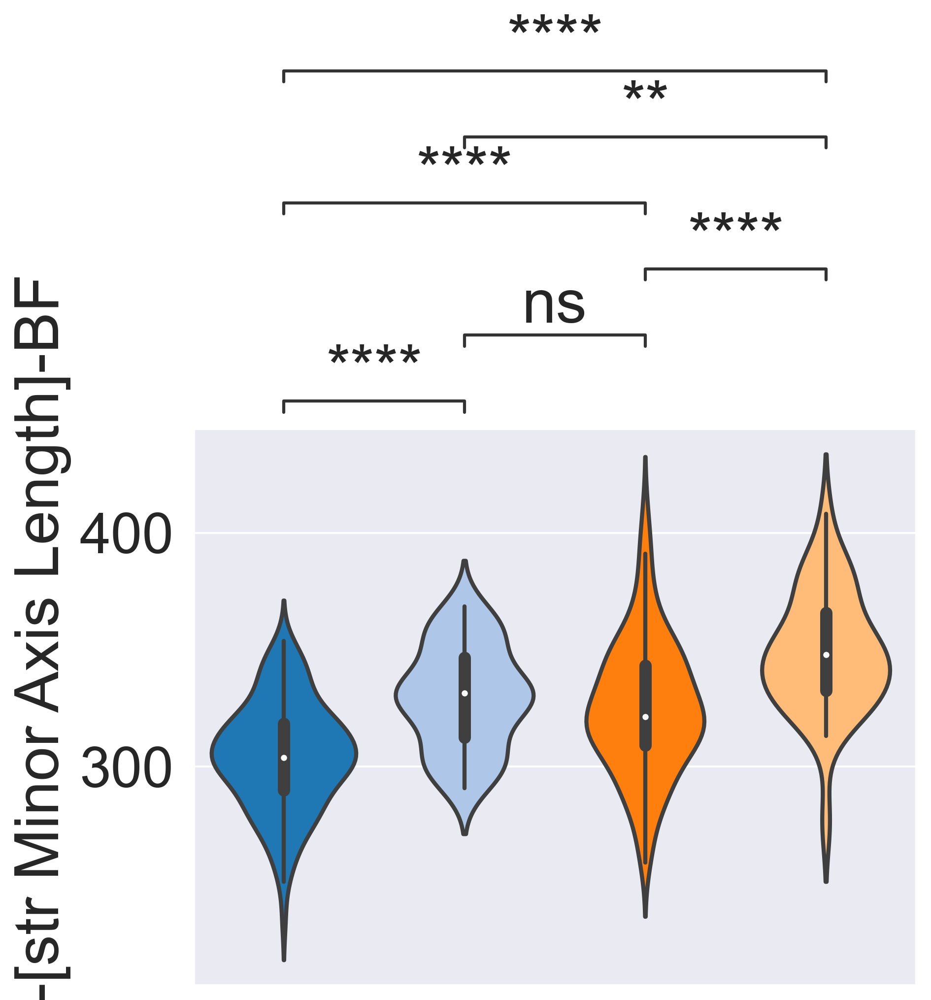

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 096h-[str Major Axis Length]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:7.996e-02
double_bad vs. single_good: Custom statistical test, P_val:3.351e-01
single_good vs. double_good: Custom statistical test, P_val:2.846e-01
single_bad vs. single_good: Custom statistical test, P_val:8.772e-01
double_bad vs. double_good: Custom statistical test, P_val:9.881e-01
single_bad vs. double_good: Custom statistical test, P_val:8.512e-02


meta NOT subset; don't know how to subset; dropped


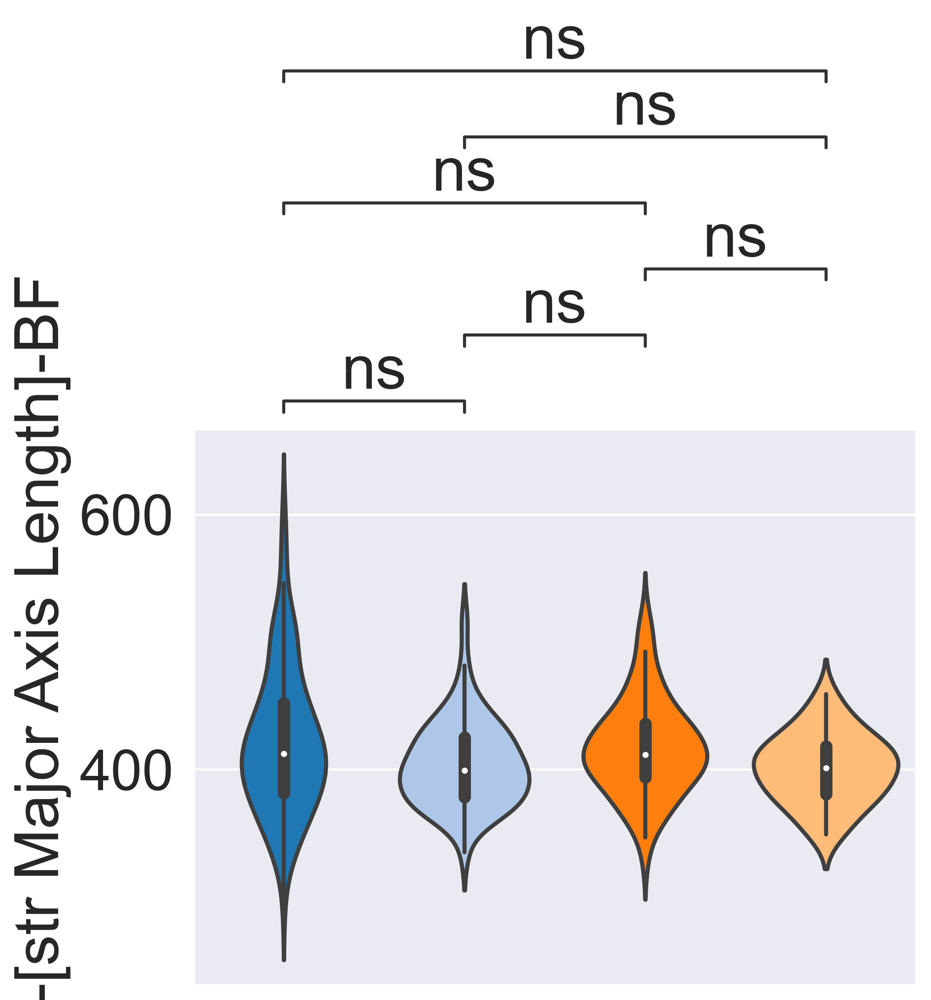

{'cut': 0}
Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 096h-[Area Fraction]-TmCH, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:5.114e-11
double_bad vs. single_good: Custom statistical test, P_val:5.140e-01
single_good vs. double_good: Custom statistical test, P_val:2.017e-02
single_bad vs. single_good: Custom statistical test, P_val:8.049e-14
double_bad vs. double_good: Custom statistical test, P_val:1.270e-03
single_bad vs. double_good: Custom statistical test, P_val:8.049e-14


meta NOT subset; don't know how to subset; dropped


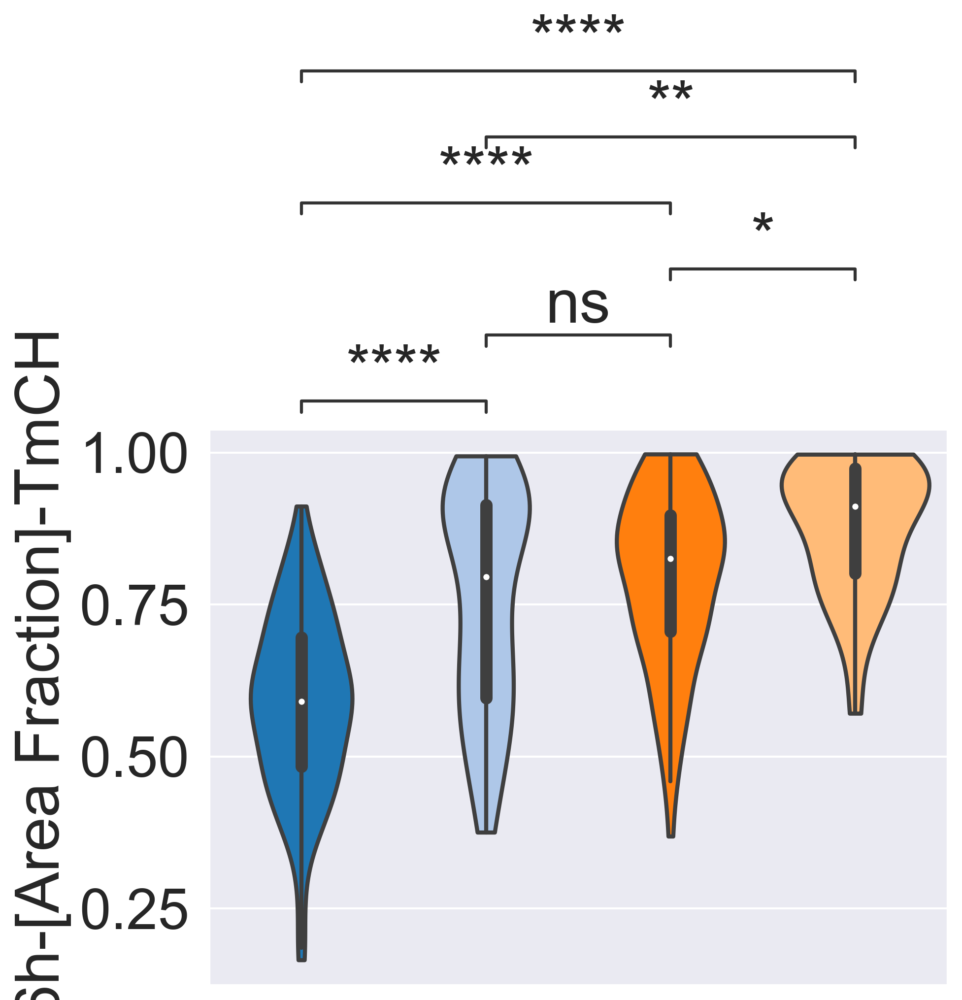

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 096h-[Area]-TmCH, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:1.909e-08
double_bad vs. single_good: Custom statistical test, P_val:3.553e-01
single_good vs. double_good: Custom statistical test, P_val:8.861e-03
single_bad vs. single_good: Custom statistical test, P_val:8.049e-14
double_bad vs. double_good: Custom statistical test, P_val:2.152e-04
single_bad vs. double_good: Custom statistical test, P_val:8.049e-14


meta NOT subset; don't know how to subset; dropped


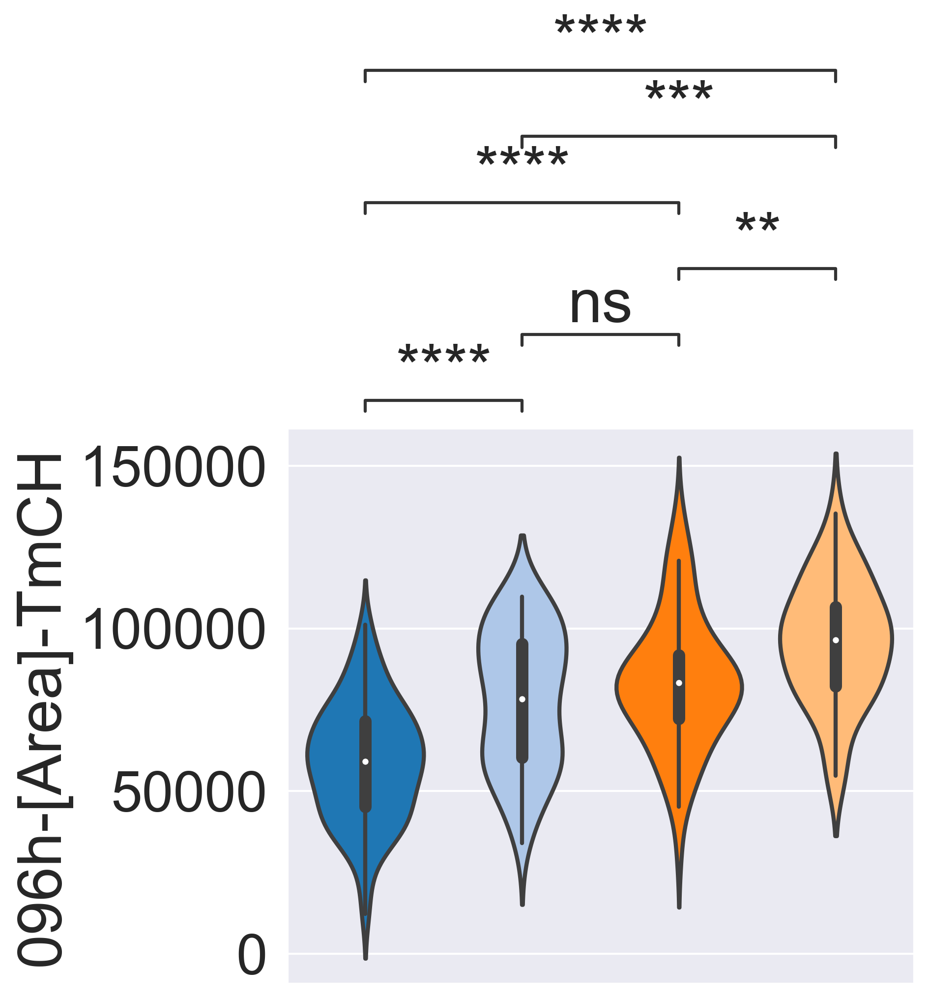

In [159]:
data_renamed = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")].rename(columns=mapping_names)

for feat in features_raw:
    kwargs = {}
    if feat == '096h_raw_CH_AreaShape_Bra_AreaFraction':
        kwargs["cut"]=0
        print(kwargs)
        
    feature = mapping_names[feat]
    sns.set(font_scale=2.5,)
    fig,ax = plt.subplots(figsize = (7,10))
    counts = data_renamed.groupby(hue)[feature].count()
    print(counts)
    g = sns.violinplot(
        data = data_renamed,
        y = feature,
        x="Morph_Class", 
        palette="tab20",
        order=["single_bad","double_bad","single_good","double_good"],
        linewidth=2,
        saturation=1,
        ax=ax,
        **kwargs,
    )
    ax.set_xlabel("")
    ax.set_xticks([])
    
    values_by_hue = [data_renamed.groupby(by=hue)[feature].get_group(group) for group in annotations]
    
    p_vals = tukey_hsd(*values_by_hue).pvalue
    tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices]

    annotator = Annotator(ax, pairs, data=data_renamed, x=hue, y=feature, order=annotations)
    annotator.configure(loc="outside",text_offset = 0)
    annotator.set_pvalues(tukey_p_vals)
    annotator.annotate()
    
    plt.tight_layout()
    plt.savefig(f"{out}/Feature Plots Morph Class{feature}.pdf", format="pdf", bbox_inches="tight")
    plt.show()

In [160]:
data_renamed_morph

,Run,Plate,ID,048h-[Area]-BF,048h-[Aspect Ratio]-BF,048h-[Axis Major Length]-BF,048h-[Axis Minor Length]-BF,048h-[Eccentricity]-BF,048h-[Feret Diameter Max]-BF,048h-[Perimeter]-BF,...,096h-[str Moments Hu 4]-BF,096h-[str Moments Hu 5]-BF,096h-[str Moments Hu 6]-BF,096h-[str Orientation]-BF,096h-[str Perimeter]-BF,096h-[str Major Axis Polarisation]-TmCH,096h-[str Minor Axis Polarisation]-TmCH,Axes,Morph,Morph_Class
0,RR,1,A1,0.754091,-0.889636,0.132588,1.204628,-1.000051,0.007074,0.615519,...,-0.081040,-0.108285,-0.018937,0.218694,0.485603,-0.237483,0.204173,single,good,single_good
1,RR,1,A2,-0.783470,-1.252670,-1.238409,0.003129,-1.752936,-1.131530,-0.724230,...,-0.080919,-0.108023,0.017986,-1.310831,-0.276812,-0.930821,1.071650,single,bad,single_bad
2,RR,1,A3,1.636441,-0.184192,1.186196,1.565451,-0.008740,1.127225,1.795347,...,-0.081045,-0.108504,-0.019001,-0.638784,0.014028,0.406917,-0.068697,single,bad,single_bad
3,RR,1,A4,-0.525754,-0.513477,-0.672134,-0.202863,-0.422446,-0.849309,-0.402853,...,-0.073034,-0.013521,0.038021,0.362758,0.652506,0.992505,-0.551399,single,good,single_good
4,RR,1,A5,0.537872,-0.248943,0.294790,0.612413,-0.084969,0.059492,0.498737,...,-0.081127,-0.113141,-0.013480,-0.324894,-1.090064,0.285818,-0.643907,single,bad,single_bad
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431,TR,2,H6,-0.425288,-0.307064,-0.483649,-0.222631,-0.155368,-0.286443,-0.402853,...,-0.080284,-0.104770,-0.006234,0.057295,1.987318,-1.297863,-1.038224,double,unclassified,double_unclassified
434,TR,2,H9,-0.925432,1.281638,-0.116354,-1.536867,1.304509,-0.330223,-1.009869,...,-0.084586,-0.137911,0.247706,0.371618,1.965908,0.143556,0.712064,single,good,single_good
435,TR,2,H10,-1.873304,-1.279234,-2.131125,-1.049808,-1.821515,-2.016265,-1.929328,...,-0.082320,-0.115499,0.052699,0.177291,1.923294,-1.128242,-0.816051,double,unclassified,double_unclassified
436,TR,2,H11,-2.408392,-0.915375,-2.411391,-1.803167,-1.045366,-2.414625,-2.306480,...,-0.101456,-0.309307,0.338411,-0.341009,1.652660,-0.982778,1.840169,single,good,single_good


Morph
bad     183
good    129
Name: 072h-[Area]-BF, dtype: int64
[1      60265.120357
2      75095.192618
4      66697.531924
7      64671.813592
8      68708.132954
           ...     
409    51141.829215
411    61542.532290
421    61262.862221
422    57007.341996
430    54754.864150
Name: 072h-[Area]-BF, Length: 183, dtype: float64, 0      74513.176530
3      63598.485223
12     64036.886951
13     68768.602158
19     65480.589195
           ...     
424    59652.869667
429    58246.960676
434    59085.970880
436    53175.106197
437    61550.090940
Name: 072h-[Area]-BF, Length: 129, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:7.380e-02


meta NOT subset; don't know how to subset; dropped


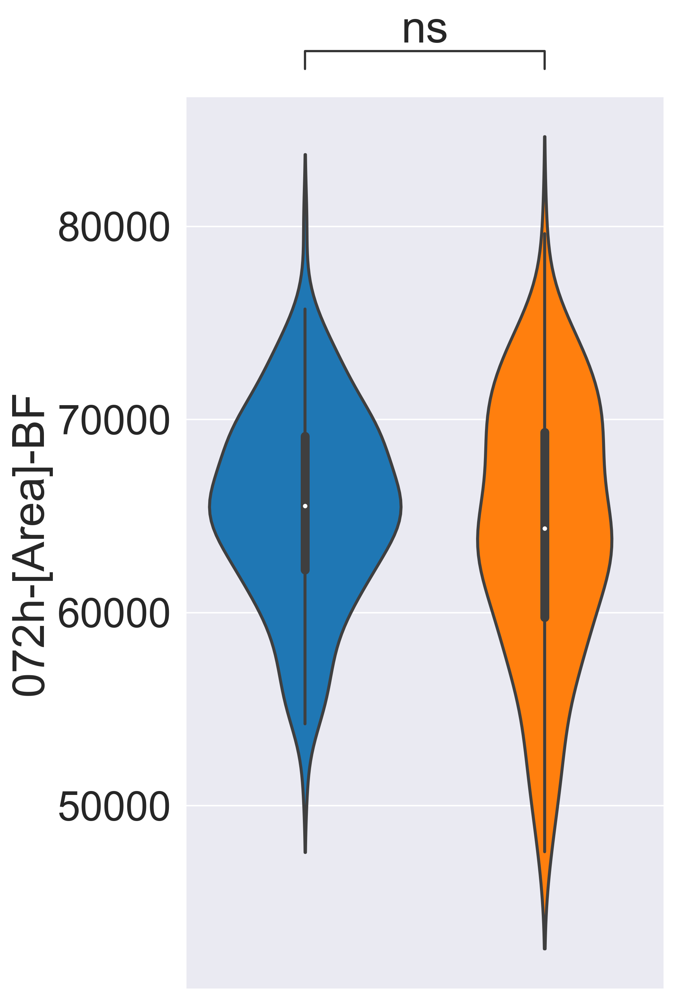

Morph
bad     183
good    129
Name: 096h-[str Major Axis Polarisation]-TmCH, dtype: int64
[1      0.013417
2      0.041057
4      0.038555
7      0.065994
8      0.034727
         ...   
409    0.030244
411    0.053992
421    0.001781
422    0.023108
430    0.059850
Name: 096h-[str Major Axis Polarisation]-TmCH, Length: 183, dtype: float64, 0      0.027743
3      0.053157
12     0.034856
13     0.033374
19     0.046778
         ...   
424    0.029830
429    0.019592
434    0.035616
436    0.012343
437    0.001894
Name: 096h-[str Major Axis Polarisation]-TmCH, Length: 129, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:7.534e-04


meta NOT subset; don't know how to subset; dropped


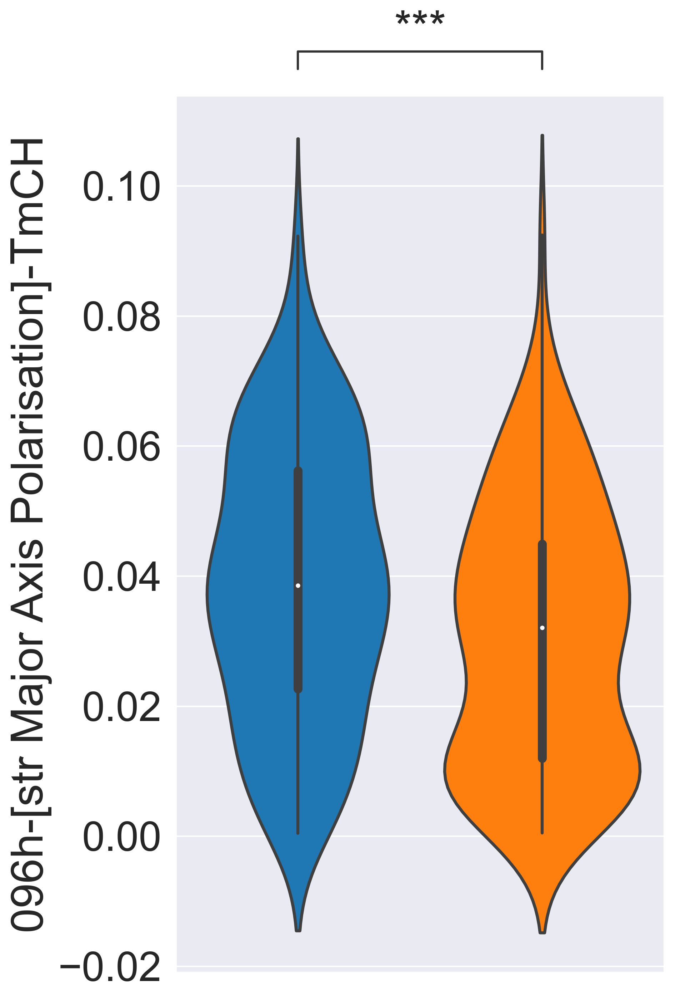

Morph
bad     183
good    129
Name: 096h-[str Aspect Ratio]-BF, dtype: int64
[1      1.151461
2      1.076836
4      1.450941
7      1.667882
8      1.201546
         ...   
409    1.246002
411    1.296598
421    1.156521
422    1.070097
430    1.578529
Name: 096h-[str Aspect Ratio]-BF, Length: 183, dtype: float64, 0      1.021571
3      1.393950
12     1.110560
13     1.052763
19     1.467178
         ...   
424    1.452692
429    1.222546
434    1.322848
436    1.614141
437    1.304818
Name: 096h-[str Aspect Ratio]-BF, Length: 129, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:3.338e-04


meta NOT subset; don't know how to subset; dropped


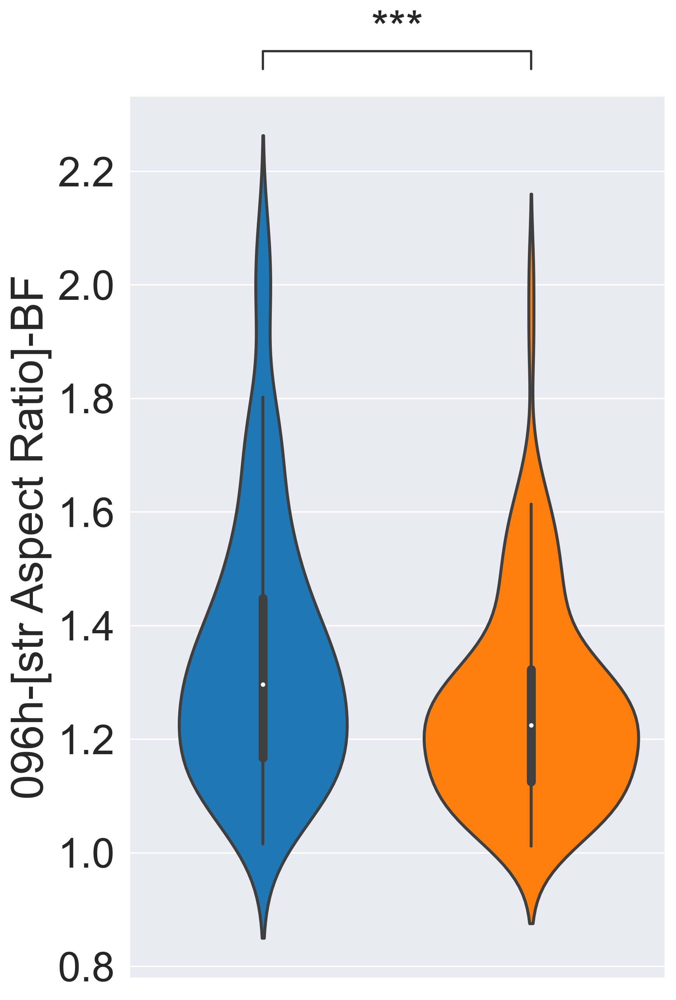

Morph
bad     183
good    129
Name: 096h-[str Minor Axis Length]-BF, dtype: int64
[1      334.494138
2      349.736374
4      283.242929
7      296.271708
8      325.754449
          ...    
409    300.016286
411    331.475718
421    360.739683
422    363.328589
430    321.968477
Name: 096h-[str Minor Axis Length]-BF, Length: 183, dtype: float64, 0      373.430325
3      313.134779
12     344.398095
13     329.322962
19     300.680070
          ...    
424    318.087116
429    360.625012
434    354.186991
436    313.643540
437    352.110634
Name: 096h-[str Minor Axis Length]-BF, Length: 129, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:2.843e-09


meta NOT subset; don't know how to subset; dropped


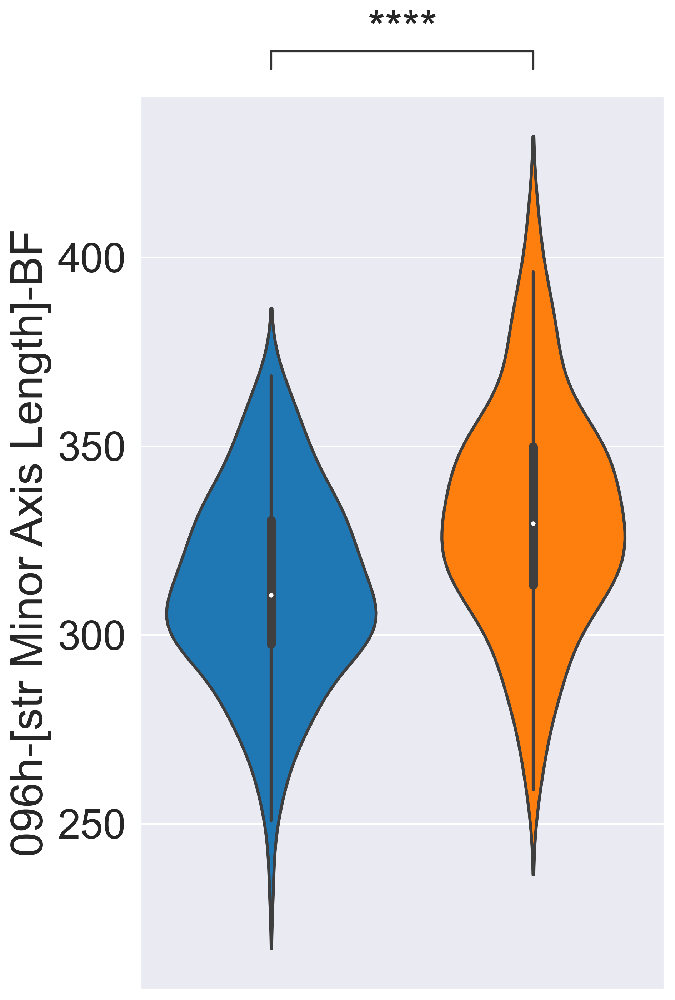

Morph
bad     183
good    129
Name: 096h-[str Major Axis Length]-BF, dtype: int64
[1      385.157015
2      376.608790
4      410.968782
7      494.146217
8      391.409079
          ...    
409    373.820942
411    429.790847
421    417.203035
422    388.796839
430    508.236553
Name: 096h-[str Major Axis Length]-BF, Length: 183, dtype: float64, 0      381.485738
3      436.494294
12     382.474621
13     346.699172
19     441.151072
          ...    
424    462.082624
429    440.880613
434    468.535501
436    506.264752
437    459.440398
Name: 096h-[str Major Axis Length]-BF, Length: 129, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:4.969e-01


meta NOT subset; don't know how to subset; dropped


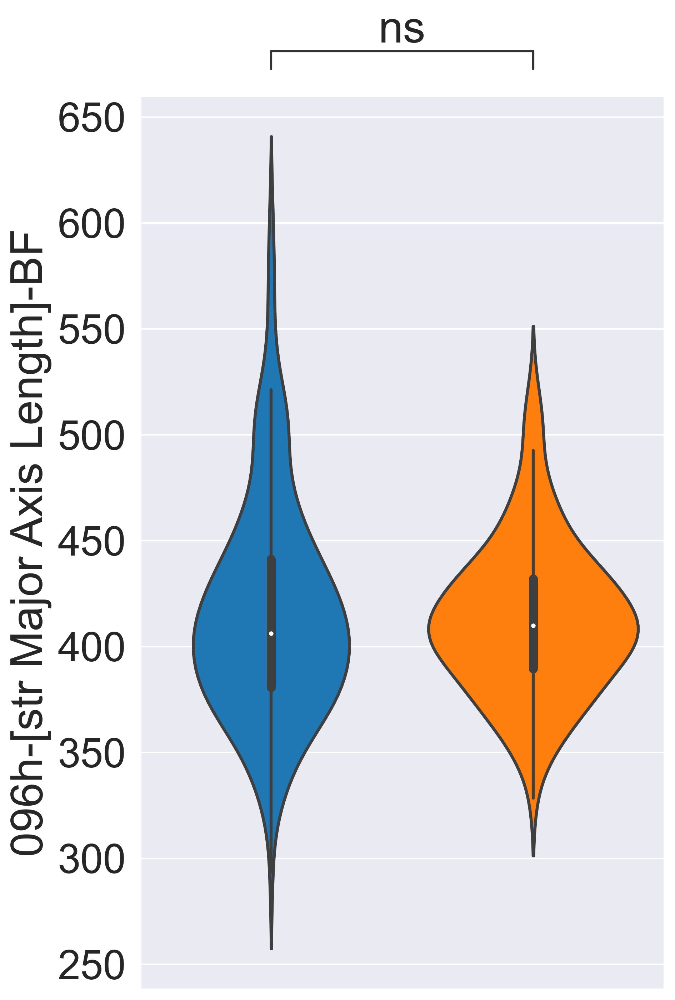

Morph
bad     183
good    129
Name: 096h-[Area Fraction]-TmCH, dtype: int64
[1      0.811699
2      0.854586
4      0.375567
7      0.614766
8      0.717814
         ...   
409    0.719303
411    0.708402
421    0.915825
422    0.946079
430    0.706228
Name: 096h-[Area Fraction]-TmCH, Length: 183, dtype: float64, 0      0.881780
3      0.835696
12     0.836880
13     0.844301
19     0.684603
         ...   
424    0.725330
429    0.933402
434    0.873950
436    0.958505
437    0.974992
Name: 096h-[Area Fraction]-TmCH, Length: 129, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


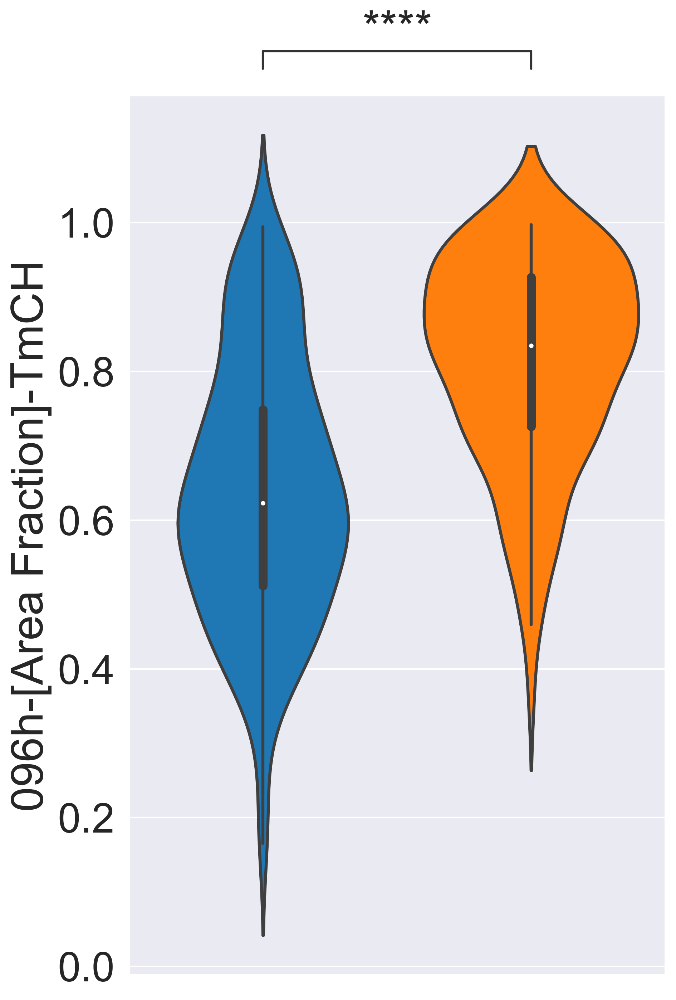

Morph
bad     183
good    129
Name: 096h-[Area]-TmCH, dtype: int64
[1       78980.338970
2       89154.282530
4       34437.211632
7       67657.480536
8       71391.453878
           ...      
409     63938.624495
411     77619.781882
421    104853.599597
422    104770.454442
430     88201.892568
Name: 096h-[Area]-TmCH, Length: 183, dtype: float64, 0       97929.875748
3       89116.489277
12      86206.408838
13      76032.465279
19      71451.923082
           ...      
424     75669.650055
429    116320.072391
434    109320.762037
436    114362.381914
437    120825.028083
Name: 096h-[Area]-TmCH, Length: 129, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

bad vs. good: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


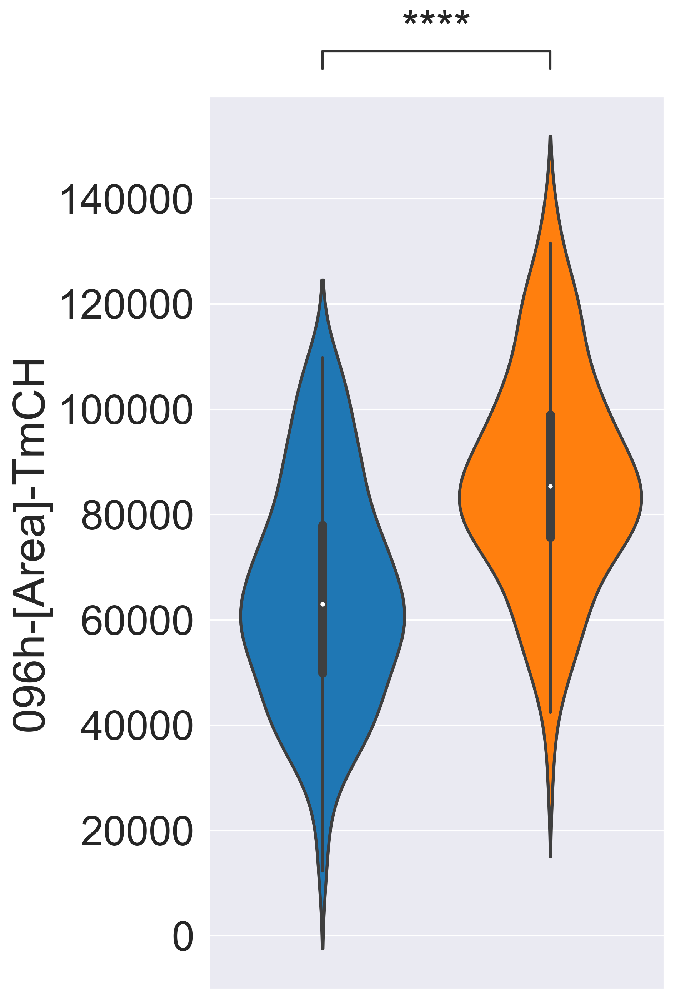

In [162]:
hue_2="Morph"

data_renamed_morph = data[data["Morph"]!="unclassified"].rename(columns=mapping_names)
annotations_morph = ["bad","good"]
pairs_morph = list(combinations(annotations_morph, r=2))
pairs_indices_morph = list(combinations(range(len(annotations_morph)),r=2))

for feat in features_raw:
    feature = mapping_names[feat]
    sns.set(font_scale=2.5)
    fig,ax = plt.subplots(figsize = (7,10))
    counts = data_renamed_morph.groupby(hue_2)[feature].count()
    print(counts)
    g = sns.violinplot(
        data = data_renamed_morph,
        saturation=1,
        y = feature,
        x=hue_2, 
        palette="tab10",
        order=annotations_morph,
        linewidth=2,
        #cut=0,
        ax=ax,
        #kind="violin",
    )
    ax.set_xlabel("")
    ax.set_xticks([])
    
    values_by_hue = [data_renamed_morph.groupby(by=hue_2)[feature].get_group(group) for group in annotations_morph]
    print(values_by_hue)
    
    p_vals = tukey_hsd(*values_by_hue).pvalue
    tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices_morph]
    
    annotator = Annotator(ax, pairs_morph, data=data_renamed_morph, x=hue_2, y=feature, order=annotations_morph)
    annotator.configure(loc="outside",text_offset = 0)
    annotator.set_pvalues(tukey_p_vals)
    annotator.annotate()
    
    plt.tight_layout()
    plt.savefig(f"{out}/Feature Plots Morph {feature}.pdf", format="pdf", bbox_inches="tight")
    plt.show()

Axes
double    136
single    257
Name: 072h-[Area]-BF, dtype: int64
[6      64271.205116
8      68708.132954
10     65185.801826
15     65435.237292
16     69123.858731
           ...     
427    61436.711183
428    63031.586436
431    68042.971711
435    67604.569983
437    61550.090940
Name: 072h-[Area]-BF, Length: 136, dtype: float64, 0      74513.176530
1      60265.120357
2      75095.192618
3      63598.485223
4      66697.531924
           ...     
424    59652.869667
429    58246.960676
430    54754.864150
434    59085.970880
436    53175.106197
Name: 072h-[Area]-BF, Length: 257, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:6.202e-01


meta NOT subset; don't know how to subset; dropped


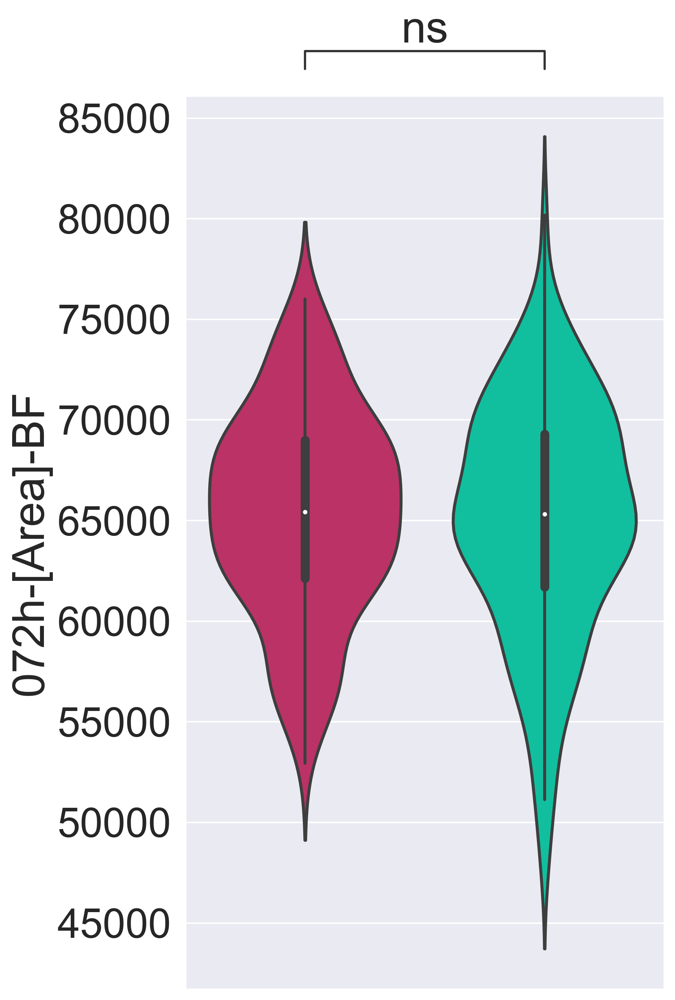

Axes
double    136
single    257
Name: 096h-[str Major Axis Polarisation]-TmCH, dtype: int64
[6      0.043144
8      0.034727
10     0.005568
15     0.003252
16     0.043040
         ...   
427    0.015538
428    0.015615
431    0.005833
435    0.009338
437    0.001894
Name: 096h-[str Major Axis Polarisation]-TmCH, Length: 136, dtype: float64, 0      0.027743
1      0.013417
2      0.041057
3      0.053157
4      0.038555
         ...   
424    0.029830
429    0.019592
430    0.059850
434    0.035616
436    0.012343
Name: 096h-[str Major Axis Polarisation]-TmCH, Length: 257, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


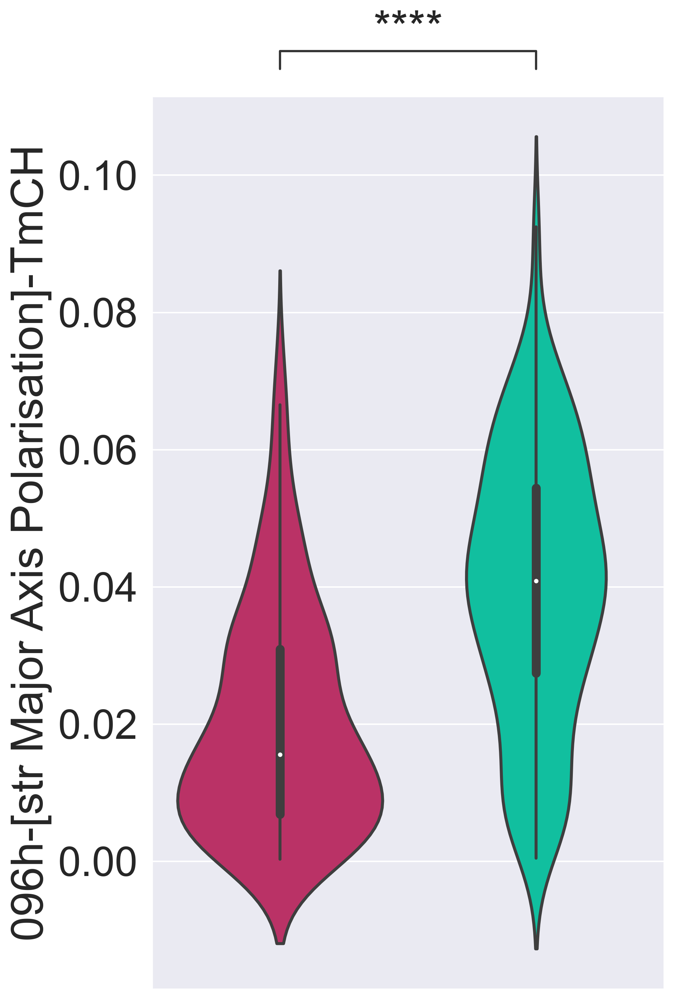

Axes
double    136
single    257
Name: 096h-[str Aspect Ratio]-BF, dtype: int64
[6      1.218827
8      1.201546
10     1.087558
15     1.152747
16     1.398953
         ...   
427    1.117568
428    1.051475
431    1.072767
435    1.199837
437    1.304818
Name: 096h-[str Aspect Ratio]-BF, Length: 136, dtype: float64, 0      1.021571
1      1.151461
2      1.076836
3      1.393950
4      1.450941
         ...   
424    1.452692
429    1.222546
430    1.578529
434    1.322848
436    1.614141
Name: 096h-[str Aspect Ratio]-BF, Length: 257, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


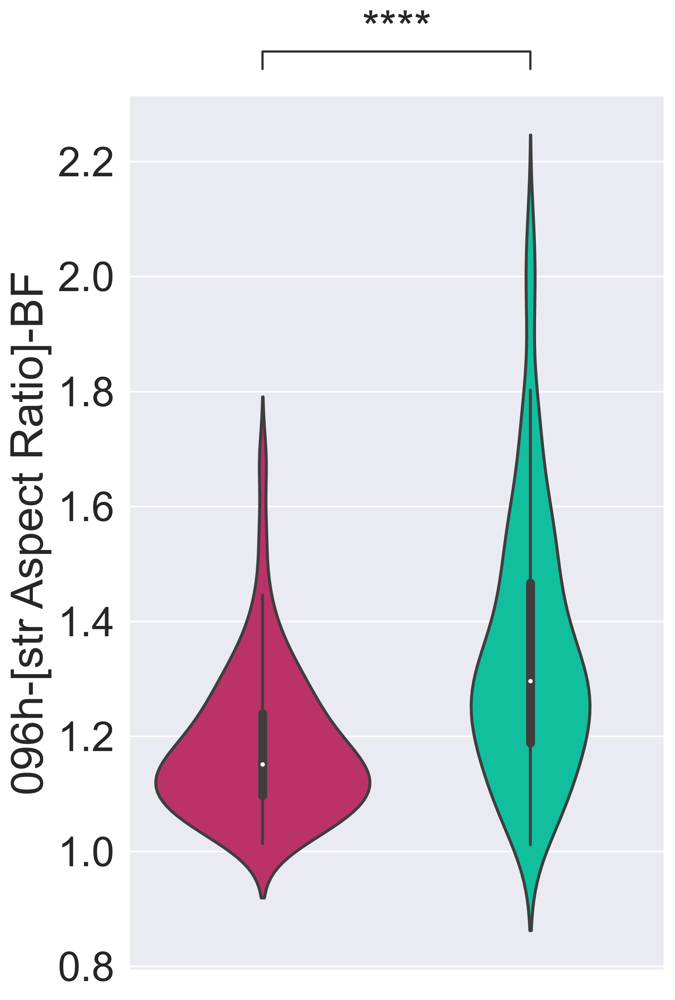

Axes
double    136
single    257
Name: 096h-[str Minor Axis Length]-BF, dtype: int64
[6      306.615308
8      325.754449
10     352.920155
15     313.935390
16     310.970173
          ...    
427    379.990066
428    366.039214
431    402.019056
435    372.702320
437    352.110634
Name: 096h-[str Minor Axis Length]-BF, Length: 136, dtype: float64, 0      373.430325
1      334.494138
2      349.736374
3      313.134779
4      283.242929
          ...    
424    318.087116
429    360.625012
430    321.968477
434    354.186991
436    313.643540
Name: 096h-[str Minor Axis Length]-BF, Length: 257, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


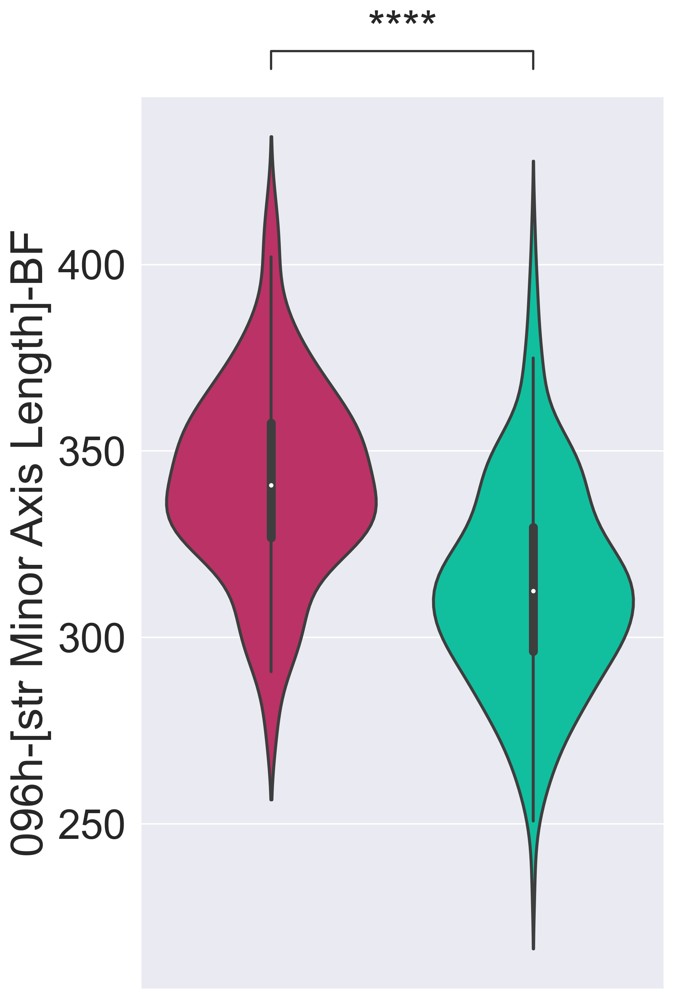

Axes
double    136
single    257
Name: 096h-[str Major Axis Length]-BF, dtype: int64
[6      373.710926
8      391.409079
10     383.821069
15     361.888230
16     435.032770
          ...    
427    424.664665
428    384.881092
431    431.272753
435    447.181922
437    459.440398
Name: 096h-[str Major Axis Length]-BF, Length: 136, dtype: float64, 0      381.485738
1      385.157015
2      376.608790
3      436.494294
4      410.968782
          ...    
424    462.082624
429    440.880613
430    508.236553
434    468.535501
436    506.264752
Name: 096h-[str Major Axis Length]-BF, Length: 257, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:4.316e-04


meta NOT subset; don't know how to subset; dropped


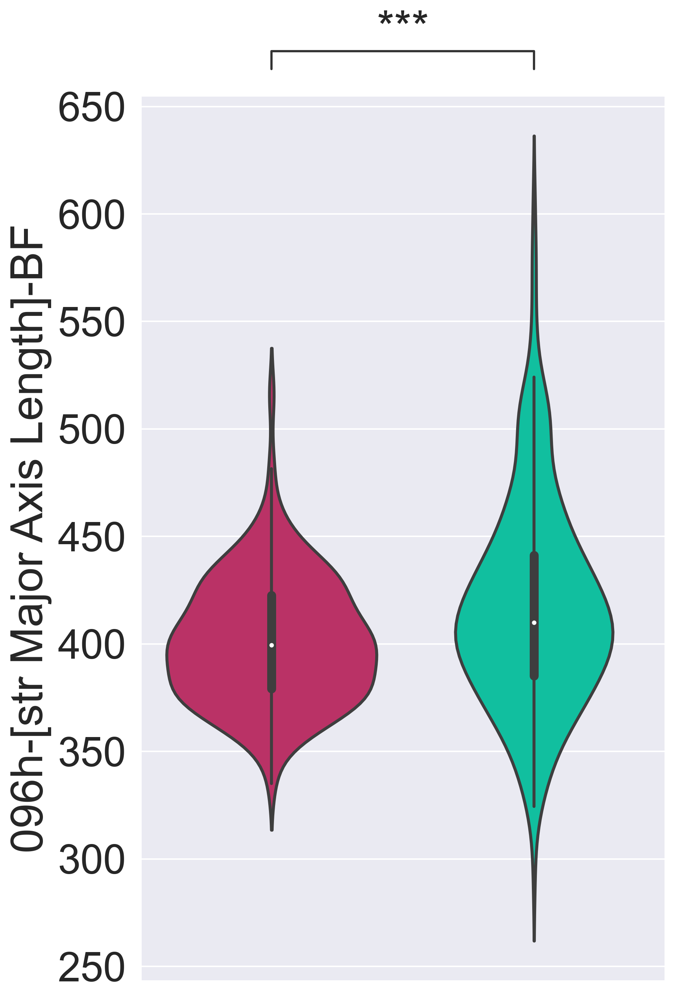

Axes
double    136
single    257
Name: 096h-[Area Fraction]-TmCH, dtype: int64
[6      0.740553
8      0.717814
10     0.946118
15     0.900883
16     0.731413
         ...   
427    0.956272
428    0.988843
431    0.956823
435    0.940728
437    0.974992
Name: 096h-[Area Fraction]-TmCH, Length: 136, dtype: float64, 0      0.881780
1      0.811699
2      0.854586
3      0.835696
4      0.375567
         ...   
424    0.725330
429    0.933402
430    0.706228
434    0.873950
436    0.958505
Name: 096h-[Area Fraction]-TmCH, Length: 257, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


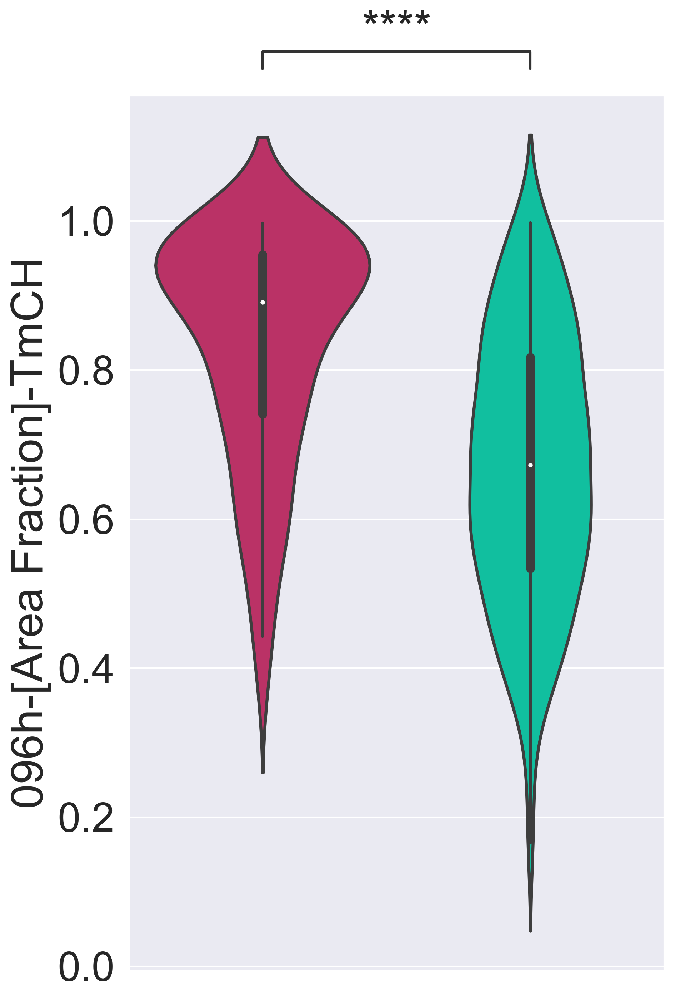

Axes
double    136
single    257
Name: 096h-[Area]-TmCH, dtype: int64
[6       65178.243175
8       71391.453878
10      97816.495991
15      80998.498651
16      78300.060426
           ...      
427    115707.821701
428    110537.704766
431    130651.273720
435    121165.167355
437    120825.028083
Name: 096h-[Area]-TmCH, Length: 136, dtype: float64, 0       97929.875748
1       78980.338970
2       89154.282530
3       89116.489277
4       34437.211632
           ...      
424     75669.650055
429    116320.072391
430     88201.892568
434    109320.762037
436    114362.381914
Name: 096h-[Area]-TmCH, Length: 257, dtype: float64]
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

double vs. single: Custom statistical test, P_val:0.000e+00


meta NOT subset; don't know how to subset; dropped


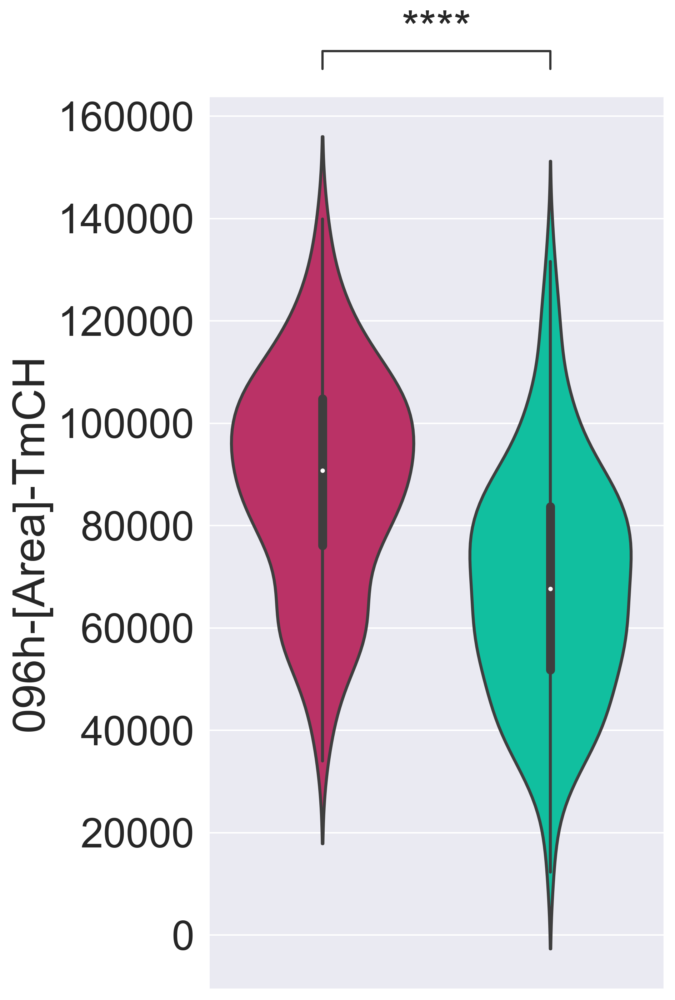

In [164]:
hue_2="Axes"

data_renamed_morph = data[data[hue_2]!="unclassified"].rename(columns=mapping_names)
annotations_morph = ["double","single"]
pairs_morph = list(combinations(annotations_morph, r=2))
pairs_indices_morph = list(combinations(range(len(annotations_morph)),r=2))

for feat in features_raw:
    feature = mapping_names[feat]
    sns.set(font_scale=2.5)
    fig,ax = plt.subplots(figsize = (7,10))
    counts = data_renamed_morph.groupby(hue_2)[feature].count()
    print(counts)
    g = sns.violinplot(
        data = data_renamed_morph,
        saturation=1,
        y = feature,
        x=hue_2, 
        palette=cmap,
        order=annotations_morph,
        linewidth=2,
        #cut=0,
        ax=ax,
        #kind="violin",
    )
    ax.set_xlabel("")
    ax.set_xticks([])
    
    values_by_hue = [data_renamed_morph.groupby(by=hue_2)[feature].get_group(group) for group in annotations_morph]
    print(values_by_hue)
    
    p_vals = tukey_hsd(*values_by_hue).pvalue
    tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices_morph]
    
    annotator = Annotator(ax, pairs_morph, data=data_renamed_morph, x=hue_2, y=feature, order=annotations_morph)
    annotator.configure(loc="outside",text_offset = 0)
    annotator.set_pvalues(tukey_p_vals)
    annotator.annotate()
    
    plt.tight_layout()
    plt.savefig(f"{out}/Feature Plots Axes {feature}.pdf", format="pdf", bbox_inches="tight")
    plt.show()

meta NOT subset; don't know how to subset; dropped


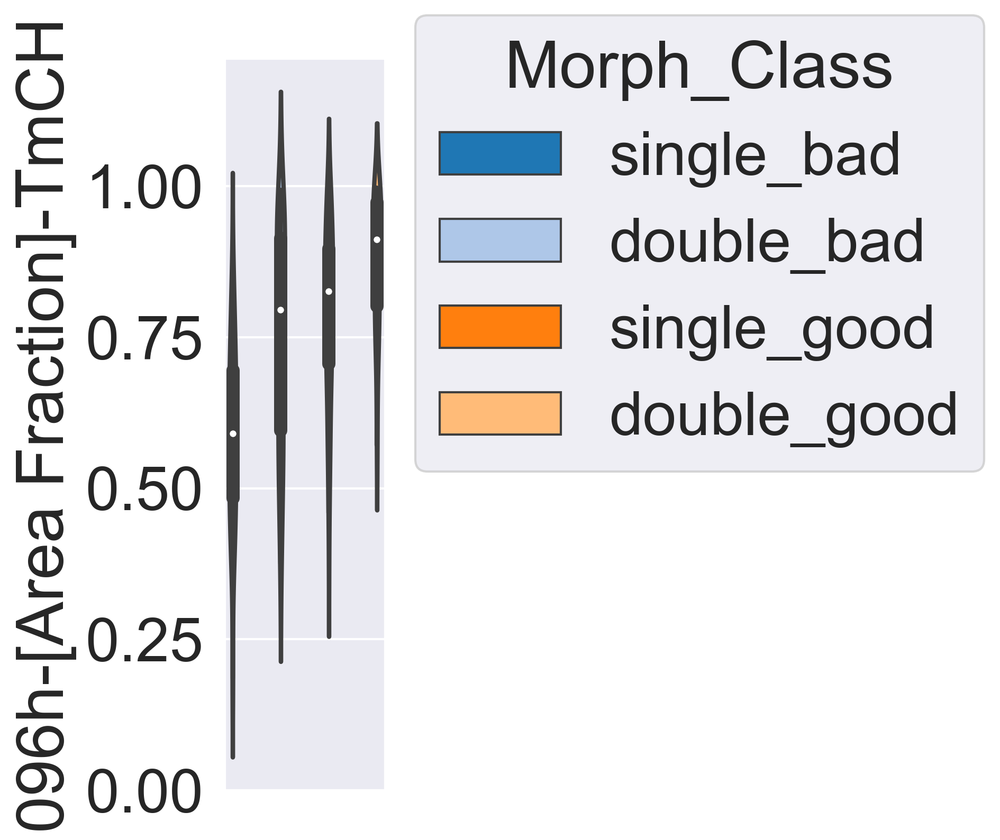

In [63]:
feat = '096h_raw_CH_AreaShape_Bra_AreaFraction'

feature = mapping_names[feat]
sns.set(font_scale=2.5,)
fig,ax = plt.subplots(figsize = (7,6))

g = sns.violinplot(
    data = data_renamed,
    y = feature,
    x="Morph_Class", 
    palette="tab20",
    hue="Morph_Class",
    order=["single_bad","double_bad","single_good","double_good"],
    hue_order=["single_bad","double_bad","single_good","double_good"],
    linewidth=2,
    saturation=1,
    ax=ax,
    **kwargs,
)
ax.set_xlabel("")
ax.set_xticks([])
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.1))
plt.tight_layout()
plt.savefig(f"{out}/plot for the legend.pdf", format="pdf", bbox_inches="tight")
plt.show()

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     94
Name: 048h-[str Area]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:9.999e-01
double_bad vs. single_good: Custom statistical test, P_val:2.833e-01
single_good vs. double_good: Custom statistical test, P_val:9.879e-01
single_bad vs. single_good: Custom statistical test, P_val:9.962e-02
double_bad vs. double_good: Custom statistical test, P_val:6.974e-01
single_bad vs. double_good: Custom statistical test, P_val:5.752e-01


meta NOT subset; don't know how to subset; dropped


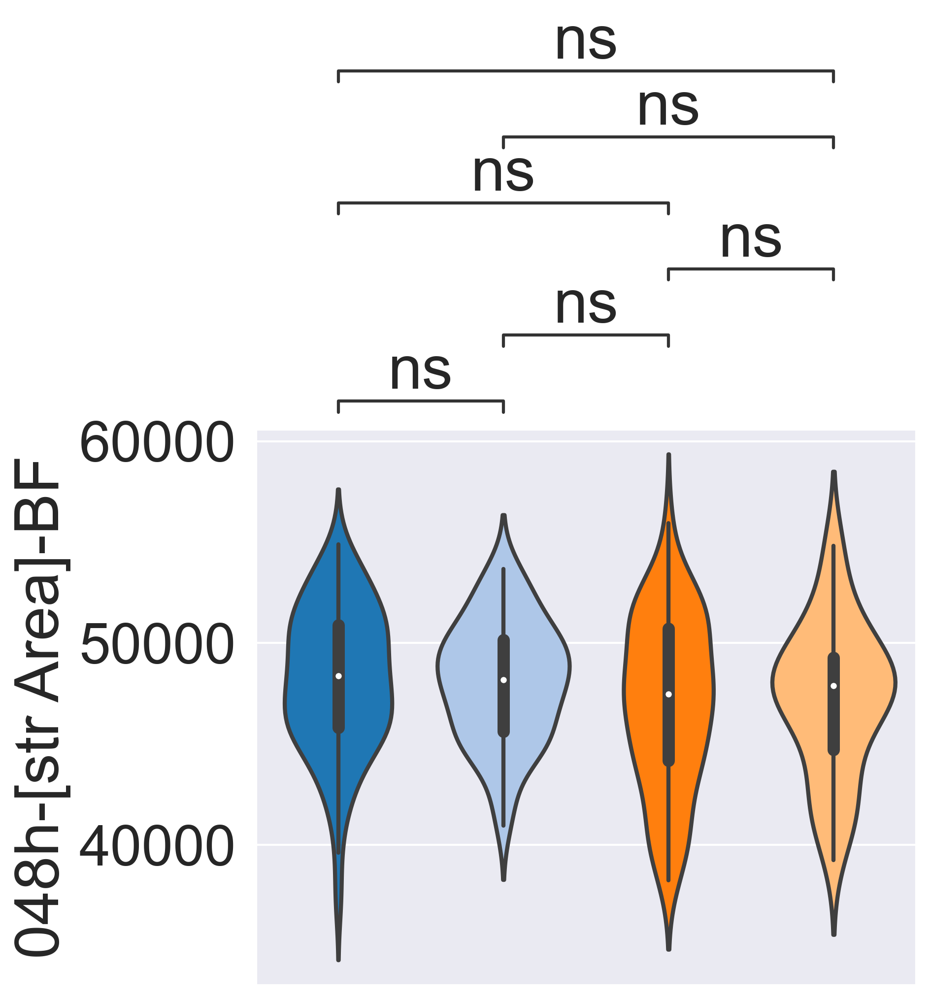

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     94
Name: 048h-[str Major Axis Length]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:5.464e-01
double_bad vs. single_good: Custom statistical test, P_val:9.114e-01
single_good vs. double_good: Custom statistical test, P_val:9.832e-01
single_bad vs. single_good: Custom statistical test, P_val:7.882e-02
double_bad vs. double_good: Custom statistical test, P_val:9.980e-01
single_bad vs. double_good: Custom statistical test, P_val:5.566e-01


meta NOT subset; don't know how to subset; dropped


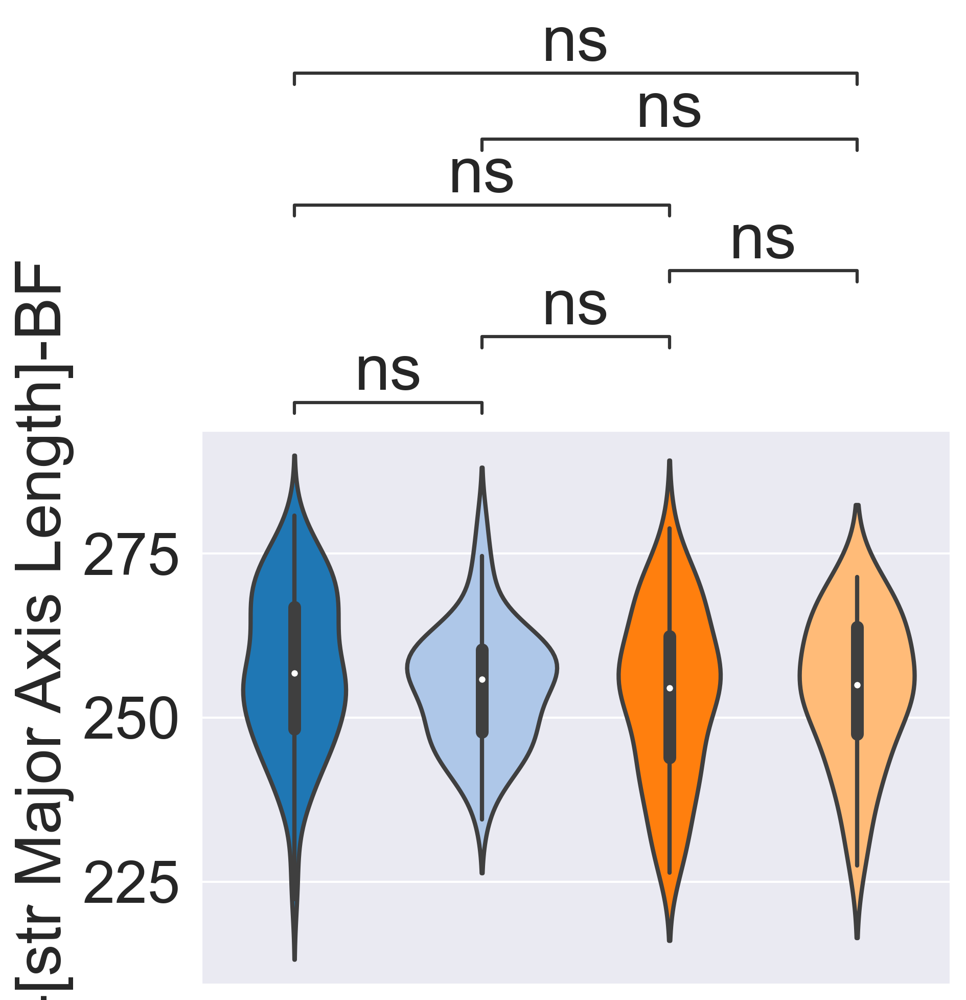

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     94
Name: 048h-[str Minor Axis Length]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:5.123e-01
double_bad vs. single_good: Custom statistical test, P_val:2.558e-02
single_good vs. double_good: Custom statistical test, P_val:9.931e-01
single_bad vs. single_good: Custom statistical test, P_val:2.321e-01
double_bad vs. double_good: Custom statistical test, P_val:2.082e-01
single_bad vs. double_good: Custom statistical test, P_val:7.173e-01


meta NOT subset; don't know how to subset; dropped


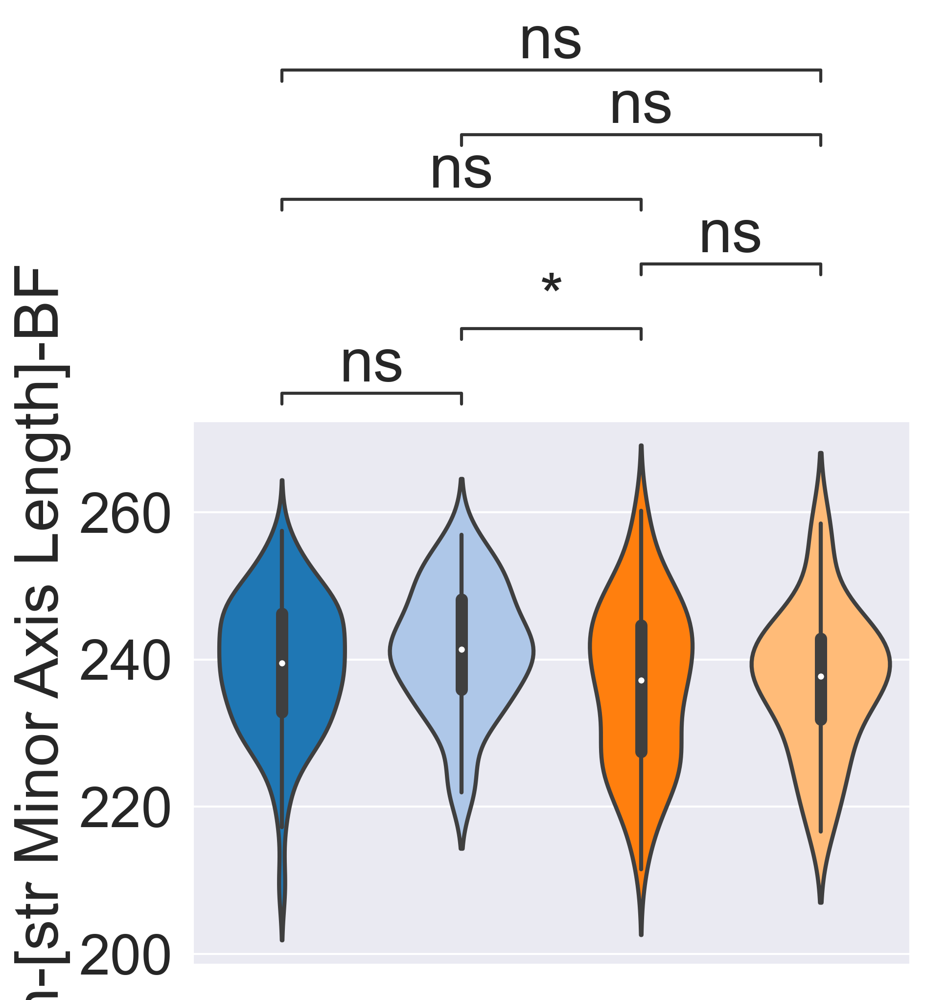

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 072h-[str Area]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:8.926e-01
double_bad vs. single_good: Custom statistical test, P_val:2.010e-01
single_good vs. double_good: Custom statistical test, P_val:6.907e-01
single_bad vs. single_good: Custom statistical test, P_val:3.687e-01
double_bad vs. double_good: Custom statistical test, P_val:9.530e-01
single_bad vs. double_good: Custom statistical test, P_val:1.000e+00


meta NOT subset; don't know how to subset; dropped


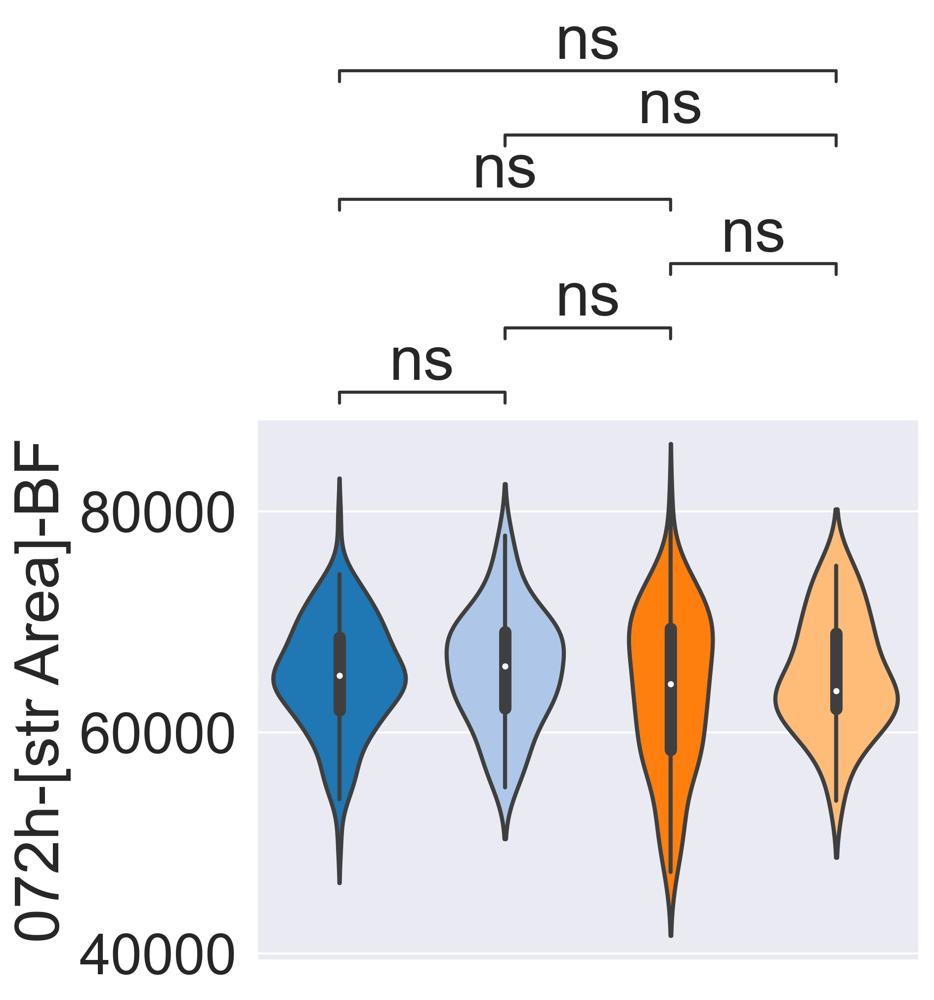

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 072h-[str Major Axis Length]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:8.138e-01
double_bad vs. single_good: Custom statistical test, P_val:1.021e-01
single_good vs. double_good: Custom statistical test, P_val:8.215e-01
single_bad vs. single_good: Custom statistical test, P_val:2.673e-01
double_bad vs. double_good: Custom statistical test, P_val:7.579e-01
single_bad vs. double_good: Custom statistical test, P_val:9.818e-01


meta NOT subset; don't know how to subset; dropped


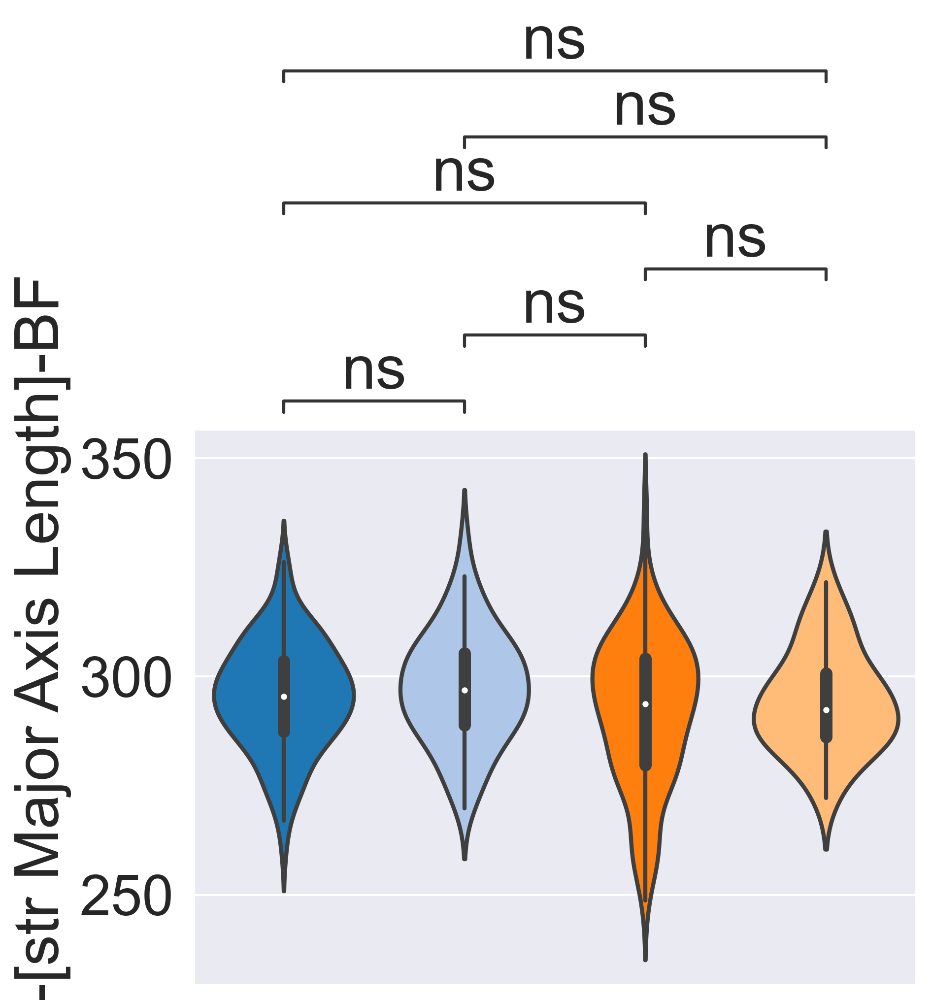

Morph_Class
double_bad      55
double_good     34
single_bad     128
single_good     95
Name: 072h-[str Minor Axis Length]-BF, dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:9.637e-01
double_bad vs. single_good: Custom statistical test, P_val:3.467e-01
single_good vs. double_good: Custom statistical test, P_val:4.911e-01
single_bad vs. single_good: Custom statistical test, P_val:4.347e-01
double_bad vs. double_good: Custom statistical test, P_val:1.000e+00
single_bad vs. double_good: Custom statistical test, P_val:9.771e-01


meta NOT subset; don't know how to subset; dropped


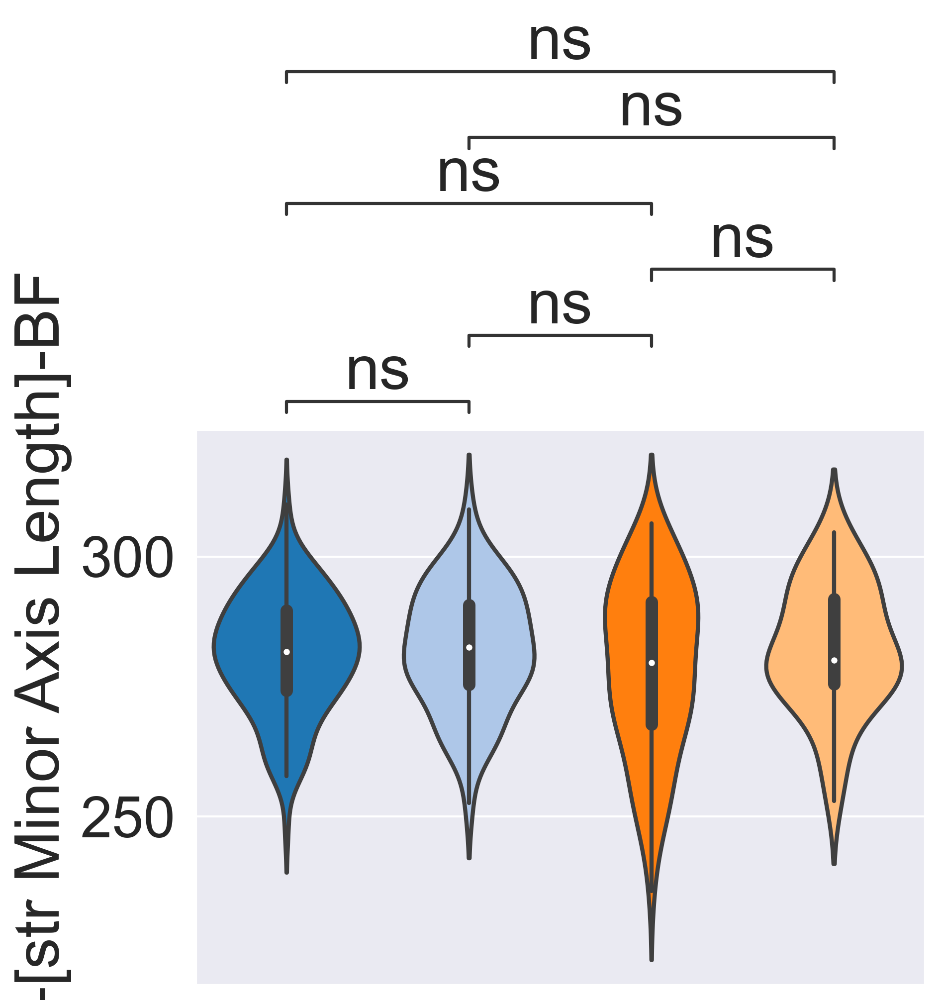

In [64]:
data_filt = data[(data["Morph"]!="unclassified")&(data["Axes"]!="unclassified")]

features_raw = [
    "048h_str_BF_AreaShape_area",
    '048h_str_BF_AreaShape_major_axis_length',
    '048h_str_BF_AreaShape_minor_axis_length',
    "072h_str_BF_AreaShape_area",
    '072h_str_BF_AreaShape_major_axis_length',
    '072h_str_BF_AreaShape_minor_axis_length',
]

data_renamed = data_filt.rename(columns=mapping_names)

for feat in features_raw:
    feature = mapping_names[feat]
    sns.set(font_scale=2.5)
    fig,ax = plt.subplots(figsize = (7,10))
    counts = data_renamed.groupby(hue)[feature].count()
    print(counts)
    g = sns.violinplot(
        data = data_renamed,
        saturation=1,
        y = feature,
        x="Morph_Class", 
        palette="tab20",
        order=["single_bad","double_bad","single_good","double_good"],
        linewidth=2,
        #cut=0,
        ax=ax,
        #kind="violin",
    )
    ax.set_xlabel("")
    ax.set_xticks([])
    
    values_by_hue = [data_renamed.groupby(by=hue)[feature].get_group(group).dropna() for group in annotations]
    p_vals = tukey_hsd(*values_by_hue).pvalue
    tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices]

    annotator = Annotator(ax, pairs, data=data_renamed, x=hue, y=feature, order=annotations)
    annotator.configure(loc="outside",text_offset = 0)
    annotator.set_pvalues(tukey_p_vals)
    annotator.annotate()
    
    plt.tight_layout()
    plt.savefig(f"{out}/72h Feature Plots Morph Class{feature}.pdf", format="pdf", bbox_inches="tight",)
    plt.show()

In [65]:
data_filt.rename(columns=mapping_names)

,Unnamed: 0,Run,Plate,ID,048h-[Area]-BF,048h-[Aspect Ratio]-BF,048h-[Axis Major Length]-BF,048h-[Axis Minor Length]-BF,048h-[Eccentricity]-BF,048h-[Feret Diameter Max]-BF,...,096h-[str Moments Hu 4]-BF,096h-[str Moments Hu 5]-BF,096h-[str Moments Hu 6]-BF,096h-[str Orientation]-BF,096h-[str Perimeter]-BF,096h-[str Major Axis Polarisation]-TmCH,096h-[str Minor Axis Polarisation]-TmCH,Axes,Morph,Morph_Class
0,0,RR,1,A1,51429.057934,1.036110,260.694837,251.609209,0.261703,266.724612,...,-1.412213e-15,-1.643041e-11,-3.074749e-16,0.052614,1338.362215,0.027743,0.018767,single,good,single_good
1,1,RR,1,A2,46107.767989,1.018480,244.753205,240.312256,0.189631,252.890770,...,2.059185e-12,8.695410e-10,2.075727e-11,-0.311135,1265.903481,0.013417,0.031259,single,bad,single_bad
2,2,RR,1,A3,54482.752732,1.070369,272.945953,255.001802,0.356599,280.334245,...,-8.891570e-14,-7.558533e-10,-3.658872e-14,-0.151310,1293.544459,0.041057,0.014838,single,bad,single_bad
3,3,RR,1,A4,46999.688747,1.054378,251.337713,238.375438,0.316996,256.319703,...,1.366487e-10,3.202327e-07,3.202046e-11,0.086875,1354.224446,0.053157,0.007887,single,good,single_good
4,4,RR,1,A5,50680.751535,1.067224,262.580886,246.040977,0.349302,267.361474,...,-1.487676e-12,-1.642923e-08,3.067576e-12,-0.076661,1188.613239,0.038555,0.006555,single,bad,single_bad
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,758,TR,2,H4,42585.436861,1.088522,243.120336,223.349028,0.395010,251.286622,...,-7.967288e-13,-3.174849e-09,-3.118593e-12,0.054905,1443.731616,0.019592,0.020046,single,good,single_good
430,759,TR,2,H5,42570.319560,1.085907,242.869403,223.655876,0.389824,249.702439,...,1.005330e-09,1.270496e-06,1.235697e-10,0.048906,1498.765025,0.059850,0.002584,single,bad,single_bad
434,763,TR,2,H9,45616.455707,1.141554,257.800200,225.832628,0.482314,262.626514,...,-6.053277e-11,-1.001351e-07,1.499027e-10,0.088982,1479.048220,0.035616,0.026081,single,good,single_good
436,765,TR,2,H11,40484.132024,1.034860,231.114030,223.328768,0.257365,237.301383,...,-3.484705e-10,-6.793602e-07,2.008960e-10,-0.080494,1449.277625,0.012343,0.042325,single,good,single_good


072h-[Radial Distribution Mean 3of9]-TmCH(BF)
Morph_Class
double_bad                    55
double_good                   34
double_unclassified           47
single_bad                   128
single_good                   95
single_unclassified           34
unclassified_unclassified     45
Name: 072h-[Radial Distribution Mean 3of9]-TmCH(BF), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:3.797e-02
double_bad vs. single_good: Custom statistical test, P_val:6.236e-01
single_good vs. double_good: Custom statistical test, P_val:1.296e-02
single_bad vs. single_good: Custom statistical test, P_val:3.309e-01
double_bad vs. double_good: Custom statistical test, P_val:2.462e-01
single_bad vs. double_good: Custom statistical test, P_val:1.080e-04


meta NOT subset; don't know how to subset; dropped


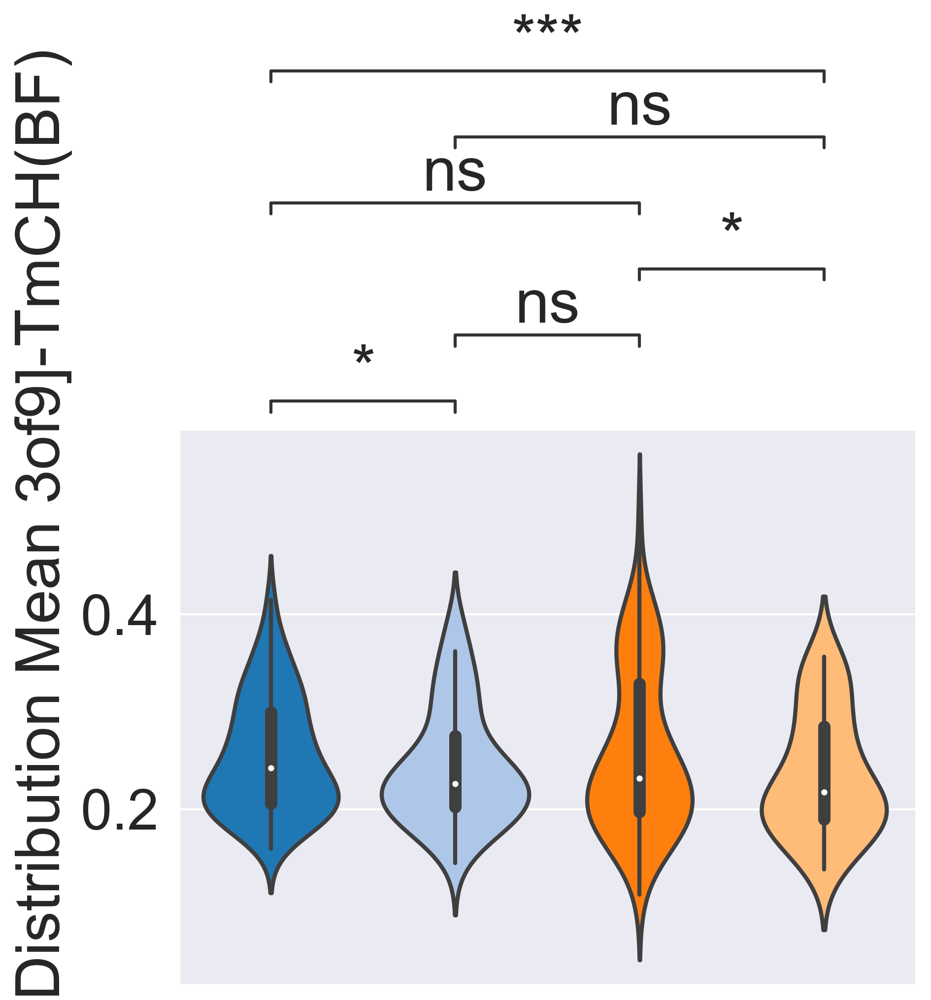

072h-[Radial Distribution Mean 8of9]-TmCH(BF)
Morph_Class
double_bad                    55
double_good                   34
double_unclassified           47
single_bad                   128
single_good                   95
single_unclassified           34
unclassified_unclassified     45
Name: 072h-[Radial Distribution Mean 8of9]-TmCH(BF), dtype: int64
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

single_bad vs. double_bad: Custom statistical test, P_val:1.733e-03
double_bad vs. single_good: Custom statistical test, P_val:8.703e-01
single_good vs. double_good: Custom statistical test, P_val:1.200e-02
single_bad vs. single_good: Custom statistical test, P_val:4.357e-03
double_bad vs. double_good: Custom statistical test, P_val:1.178e-01
single_bad vs. double_good: Custom statistical test, P_val:3.295e-07


meta NOT subset; don't know how to subset; dropped


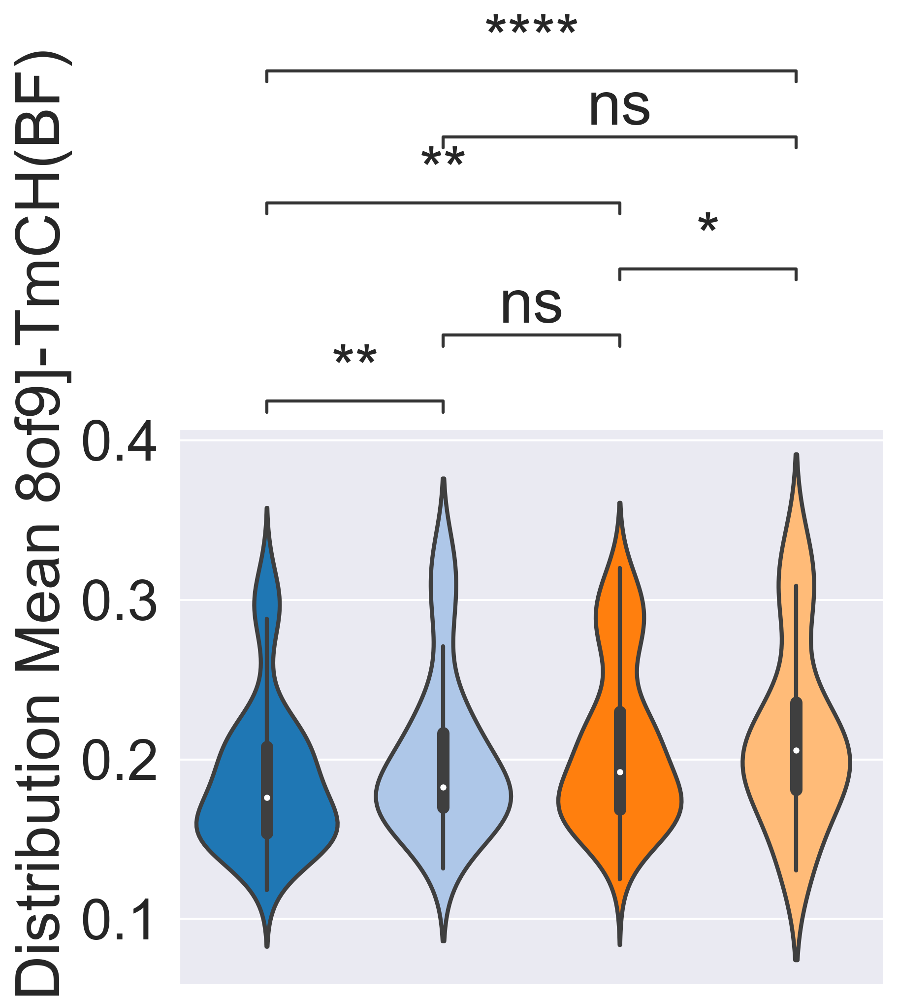

In [66]:
radial_feats_individual_plots=[
    '072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_3of9',
    '072h_raw_CH__bf_mask_RadialDistribution_MeanFrac_8of9',
]

for feat in radial_feats_individual_plots:
    feature = mapping_names[feat]
    print(feature)
    sns.set(font_scale=2.5)
    fig,ax = plt.subplots(figsize = (7,10))
    counts = master_df_72.rename(columns=mapping_names).groupby(hue)[feature].count()
    print(counts)
    g = sns.violinplot(
        data = master_df_72.rename(columns=mapping_names),
        saturation=1,
        y = feature,
        x="Morph_Class", 
        palette="tab20",
        order=["single_bad","double_bad","single_good","double_good"],
        linewidth=2,
        #cut=0,
        ax=ax,
        #kind="violin",
    )
    ax.set_xlabel("")
    ax.set_xticks([])
    
    values_by_hue = [data_renamed.groupby(by=hue)[feature].get_group(group).dropna() for group in annotations]
    p_vals = tukey_hsd(*values_by_hue).pvalue
    tukey_p_vals = [p_vals[i,j] for i,j in pairs_indices]

    annotator = Annotator(ax, pairs, data=data_renamed, x=hue, y=feature, order=annotations)
    annotator.configure(loc="outside",text_offset = 0)
    annotator.set_pvalues(tukey_p_vals)
    annotator.annotate()
    
    plt.tight_layout()
    plt.savefig(f"{out}/72h Feature Plots Morph Class{feature}.pdf", format="pdf", bbox_inches="tight")
    plt.show()

meta NOT subset; don't know how to subset; dropped


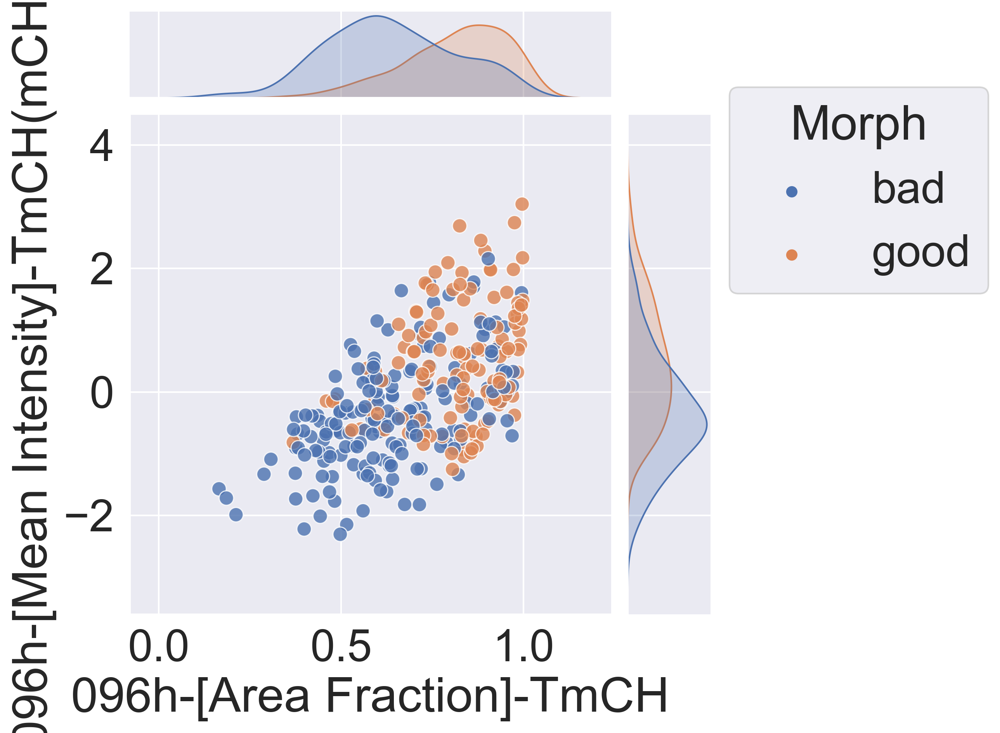

In [67]:
data_renamed_norm = annotated_normalised[annotated_normalised["Morph"]!="unclassified"].rename(columns=mapping_names)
data_renamed_raw = data[data["Morph"]!="unclassified"].rename(columns=mapping_names)


features = [
    mapping_names['096h_raw_CH_AreaShape_Bra_AreaFraction'],
    mapping_names["096h_raw_CH_bra_mask_Intensity_MeanIntensity"],
    mapping_names["072h_raw_CH__bf_mask_Intensity_MeanIntensity"],
]


df = pd.concat(
    [
        data_renamed_norm.set_index(["Run","Plate","ID"])[features[1:]],
        data_renamed_raw.set_index(["Run","Plate","ID"])[[features[0]]+["Morph"]]
    ],
    axis = 1
)


sns.set(font_scale=2.5)
g = sns.jointplot(df,x=features[0],y=features[1],hue="Morph",hue_order=["bad","good"],**{"s":80,"alpha":0.8},height=7)
sns.move_legend(g.ax_joint, "upper left", bbox_to_anchor=(1.2, 1.1))
plt.savefig(f"{home_directory}/Plots/96 Mean v 96 Bra Fraction.pdf", format="pdf", bbox_inches="tight")
plt.show()


meta NOT subset; don't know how to subset; dropped


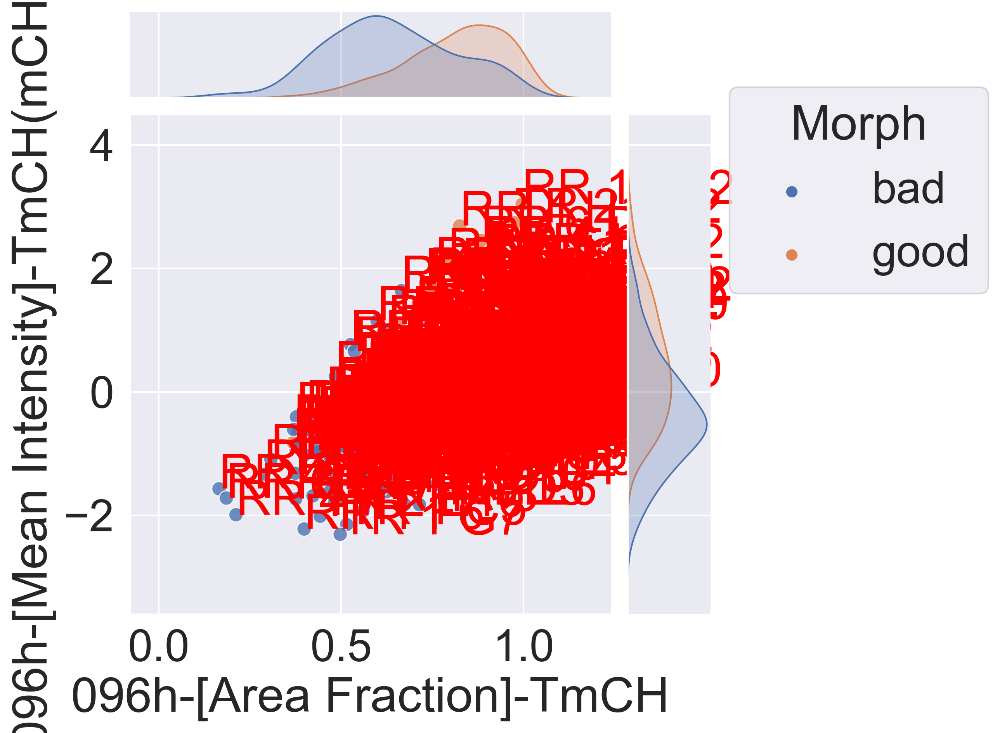

In [68]:
sns.set(font_scale=2.5)
g = sns.jointplot(df,x=features[0],y=features[1],hue="Morph",hue_order=["bad","good"],**{"s":80,"alpha":0.8},height=7)
sns.move_legend(g.ax_joint, "upper left", bbox_to_anchor=(1.2, 1.1))


for row in df[df["Morph"]!="Sequenced"].reset_index()[features[:2]+["Run","Plate","ID"]].itertuples():
    g.ax_joint.annotate(f"{row[3]} {row[4]} {row[5]}", (row[1], row[2]),**{"c":"red"})

plt.tight_layout()
plt.savefig(f"{home_directory}/Plots/96 Mean v 96 Bra Fraction annotated.pdf", format="pdf", bbox_inches="tight")
plt.show()

meta NOT subset; don't know how to subset; dropped


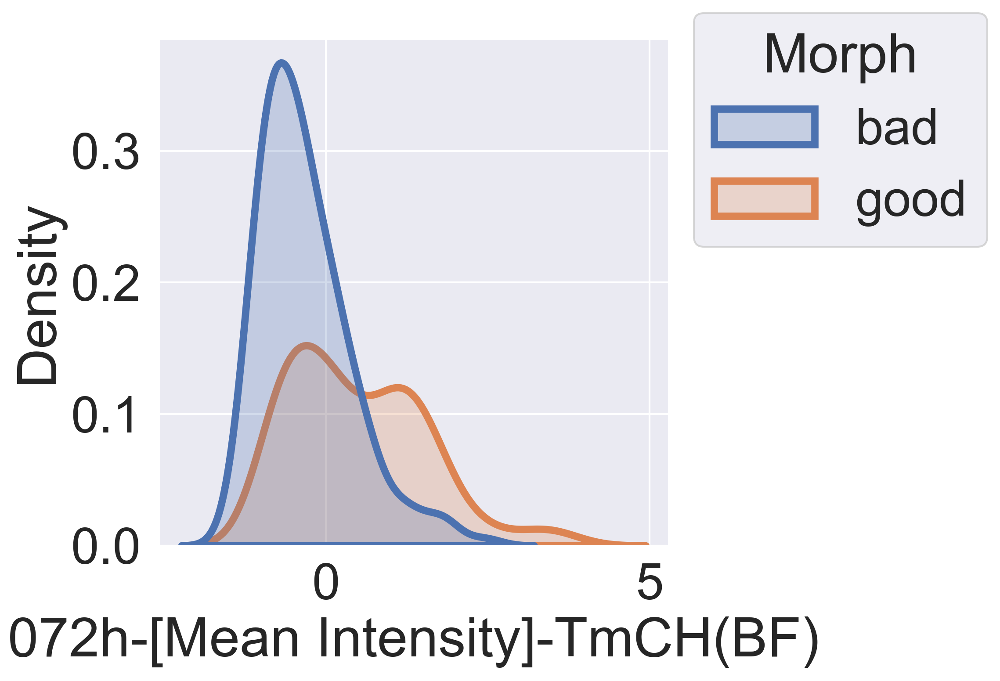

In [69]:
sns.set(font_scale=2.5)
fig,ax = plt.subplots(figsize = (5,5))
sns.kdeplot(df,x=features[2],ax=ax,hue="Morph",hue_order=["bad","good"],fill=True,**{"linewidth":4})
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.1))
plt.savefig(f"{home_directory}/Plots/72 Mean Kde Plot.pdf", format="pdf", bbox_inches="tight")
plt.show()
